### HOUSE SALE PRICING PREDICTION

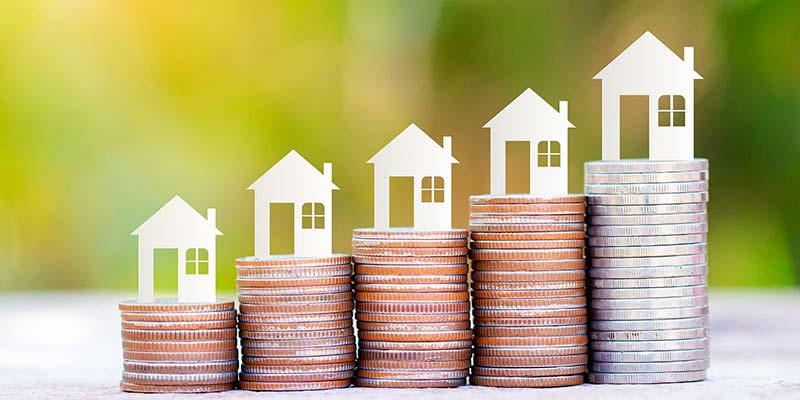

Hi folks! This is a beginners notebook that covers all the main steps necessary to complete a Machine Learning project. Here below you can see a detailed table of contents of the work:

**PREPROCESSING & EDA**

- Importing Libraries & Data
- Dealing with Duplicates and Nan
- Looking at correlations
- Data Normalization (Plots & Tests)


**MODELING**

- Baseline Models with 10-Folds CV
- Best Model (RandomGridSearch)
- Prediction
- Submission

In [3]:
# IMPORTING LIBRARIES & MAIN PATH

import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as stats
from scipy.stats import norm
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import skew, norm
from sklearn.neighbors import KNeighborsRegressor
%matplotlib inline

import warnings
warnings.filterwarnings(action="ignore")

# Defining the working directories

input_path1 = './data/test.csv'
input_path2 = './data/train.csv'

In [4]:
# IMPORTING DATA

house_data = pd.read_csv(input_path2)
test = pd.read_csv(input_path1)
data_w = house_data.copy()
data_w.columns = data_w.columns.str.replace(' ', '') # Replacing the white spaces in columns' names
data_w.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [5]:
data_w.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [6]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

### EDA & VISUALIZATION

Before working with any kind of data it is important to understand them. A crucial step to this aim is the ***Exploratory data analysis (EDA)***: a combination of visualizations and statistical analysis (uni, bi, and multivariate) that helps us to better understand the data we are working with and to gain insight into their relationships. So, let's explore our target variable and how the other features influence it.

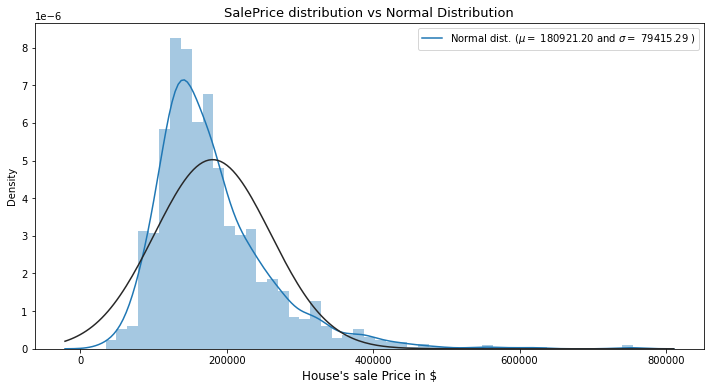

In [7]:
# Getting the main parameters of the Normal Ditribution ()
(mu, sigma) = norm.fit(data_w['SalePrice'])

plt.figure(figsize = (12,6))
sns.distplot(data_w['SalePrice'], kde = True, hist=True, fit = norm)
plt.title('SalePrice distribution vs Normal Distribution', fontsize = 13)
plt.xlabel("House's sale Price in $", fontsize = 12)
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.show()

In literature, acceptable values for skewness are between -0.5 and 0.5 while -2 and 2 for Kurtosis. Looking at the plot, we can clearly see how the distribution does not seem to be normal, but highly right-skewed. The non-normality of our distribution is also supported by the Shapiro test for normality (p-value really small that allows us to reject the hypotesis of normality). Despite that, let's leave it like that for now, we'll deal with that later in the notebook. 

In [8]:
# Skew and kurt
from scipy import stats

shap_t,shap_p = stats.shapiro(data_w['SalePrice'])

print("Skewness: %f" % abs(data_w['SalePrice']).skew())
print("Kurtosis: %f" % abs(data_w['SalePrice']).kurt())
print("Shapiro_Test: %f" % shap_t)
print("Shapiro_Test: %f" % shap_p)

Skewness: 1.882876
Kurtosis: 6.536282
Shapiro_Test: 0.869672
Shapiro_Test: 0.000000


The correlation matrix is the best way to see all the numerical correlation between features. Let's see which are the feature that correlate most with our target variable.

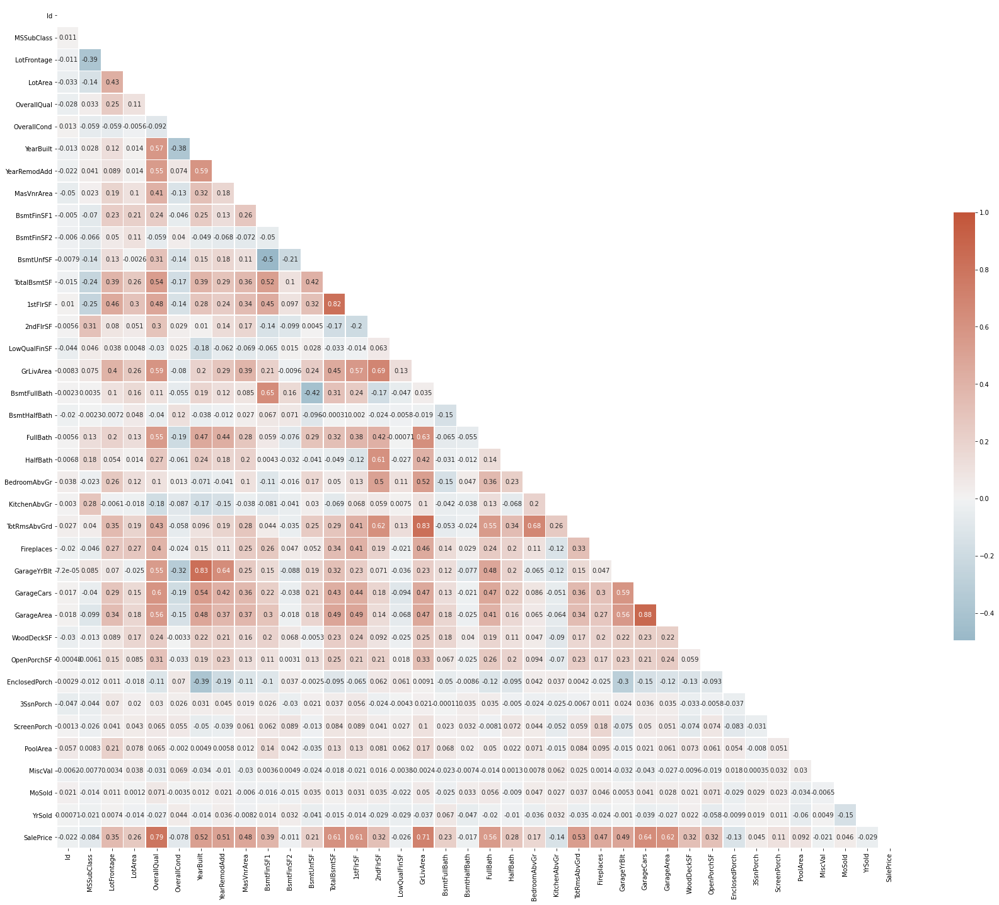

In [9]:
# Correlation Matrix

f, ax = plt.subplots(figsize=(30, 25))
mat = data_w.corr('pearson')
mask = np.triu(np.ones_like(mat, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(mat, mask=mask, cmap=cmap, vmax=1, center=0, annot = True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

Now that we know which features correlates most with our target variable we can investigate them more in depth.

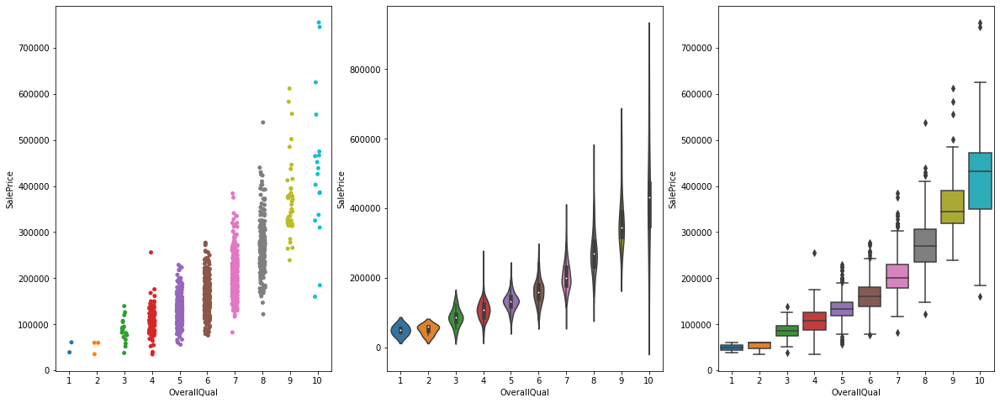

In [10]:
# OverallQuall - SalePrice [Pearson = 0.8]

figure, ax = plt.subplots(1,3, figsize = (20,8))
sns.stripplot(data=data_w, x = 'OverallQual', y='SalePrice', ax = ax[0])
sns.violinplot(data=data_w, x = 'OverallQual', y='SalePrice', ax = ax[1])
sns.boxplot(data=data_w, x = 'OverallQual', y='SalePrice', ax = ax[2])
plt.show()

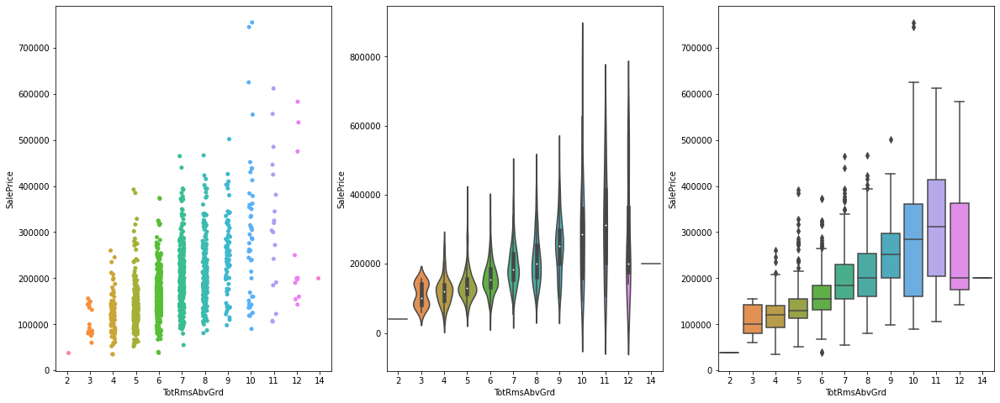

In [11]:
# TotRmsAbvGrd - SalePrice [Pearson = 0.50]

figure, ax = plt.subplots(1,3, figsize = (20,8))
sns.stripplot(data=data_w, x = 'TotRmsAbvGrd', y='SalePrice', ax = ax[0])
sns.violinplot(data=data_w, x = 'TotRmsAbvGrd', y='SalePrice', ax = ax[1])
sns.boxplot(data=data_w, x = 'TotRmsAbvGrd', y='SalePrice', ax = ax[2])
plt.show()

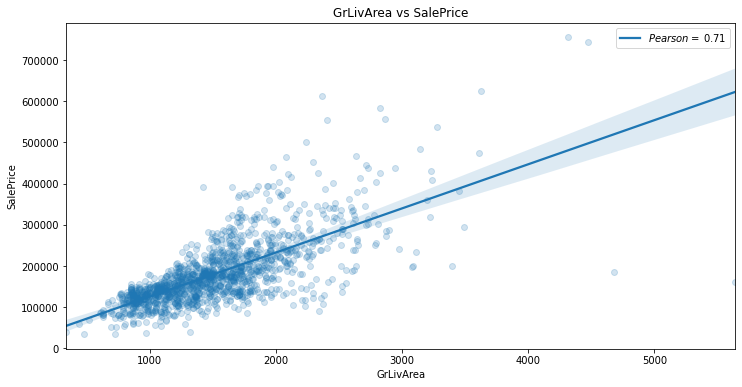

In [12]:
# GrLivArea vs SalePrice [corr = 0.71]

Pearson_GrLiv = 0.71
plt.figure(figsize = (12,6))
sns.regplot(data=data_w, x = 'GrLivArea', y='SalePrice', scatter_kws={'alpha':0.2})
plt.title('GrLivArea vs SalePrice', fontsize = 12)
plt.legend(['$Pearson=$ {:.2f}'.format(Pearson_GrLiv)], loc = 'best')
plt.show()

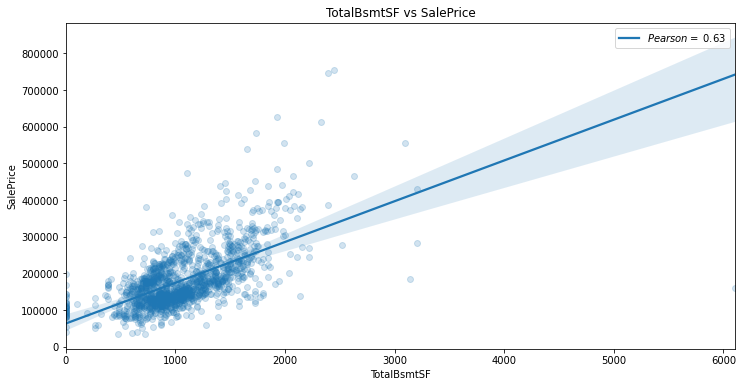

In [13]:
Pearson_TBSF = 0.63
plt.figure(figsize = (12,6))
sns.regplot(data=data_w, x = 'TotalBsmtSF', y='SalePrice', scatter_kws={'alpha':0.2})
plt.title('TotalBsmtSF vs SalePrice', fontsize = 12)
plt.legend(['$Pearson=$ {:.2f}'.format(Pearson_TBSF)], loc = 'best')
plt.show()

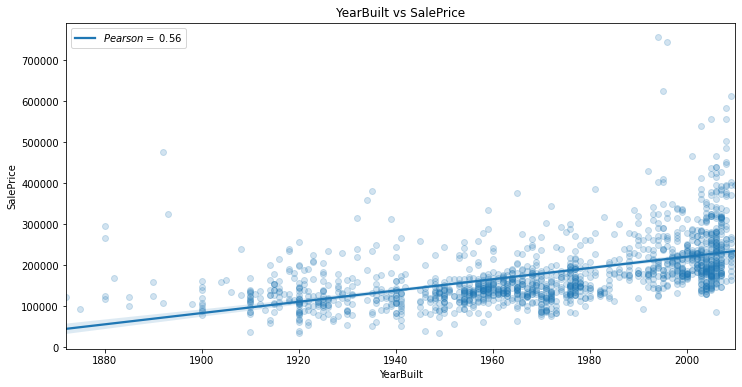

In [14]:
# YearBuilt vs SalePrice

Pearson_YrBlt = 0.56
plt.figure(figsize = (12,6))
sns.regplot(data=data_w, x = 'YearBuilt', y='SalePrice', scatter_kws={'alpha':0.2})
plt.title('YearBuilt vs SalePrice', fontsize = 12)
plt.legend(['$Pearson=$ {:.2f}'.format(Pearson_YrBlt)], loc = 'best')
plt.show()

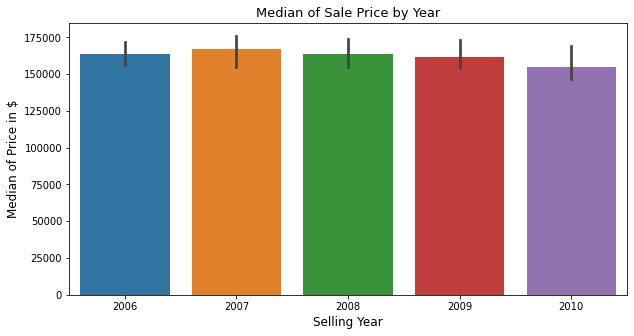

In [15]:
# Median of Sale Price by Year

plt.figure(figsize = (10,5))
sns.barplot(x='YrSold', y="SalePrice", data = data_w, estimator = np.median)
plt.title('Median of Sale Price by Year', fontsize = 13)
plt.xlabel('Selling Year', fontsize = 12)
plt.ylabel('Median of Price in $', fontsize = 12)
plt.show()

###  DATA PREPROCESSING

Now that we have some insights about data, we need to preprocess them for the modeling part. The main steps are:

- Looking at potential NaN
- Dealing with categorical features (e.g. Dummy coding)
- Normalization

N.B:

Usually, in a real-world project, the test data are not available until the end. For this reason, test data should contain the same type of data of the training set to preprocess them in the same way. Here, the test set is available. It contains some observations not present in the training dataset and,the use of dummy coding could raise several issues (I spent a lot of time figuring out why I was not able to make predictions on the test set). The easiest way to solve this problem (that is not applicable if test data are not available) is to concatenate Train and Test sets, preprocess, and divide them again.


In [16]:
# Separating Target and Features

target = data_w['SalePrice']
test_id = test['Id']
test = test.drop(['Id'],axis = 1)
data_w2 = data_w.drop(['SalePrice'], axis = 1)


# Concatenating train & test set

train_test = pd.concat([data_w2,test], axis=0, sort=False)

In [19]:
# Looking at NaN % within the data

nan = pd.DataFrame(train_test.isna().sum(), columns = ['NaN_sum'])
nan['feat'] = nan.index
nan['Perc(%)'] = (nan['NaN_sum']/len(train_test))*100
nan = nan[nan['NaN_sum'] > 0]
nan = nan.sort_values(by = ['NaN_sum'])
nan['Usability'] = np.where(nan['Perc(%)'] > 20, 'Discard', 'Keep')
nan

,NaN_sum,feat,Perc(%),Usability
TotalBsmtSF,1,TotalBsmtSF,0.034258,Keep
GarageArea,1,GarageArea,0.034258,Keep
GarageCars,1,GarageCars,0.034258,Keep
KitchenQual,1,KitchenQual,0.034258,Keep
Electrical,1,Electrical,0.034258,Keep
BsmtUnfSF,1,BsmtUnfSF,0.034258,Keep
BsmtFinSF2,1,BsmtFinSF2,0.034258,Keep
BsmtFinSF1,1,BsmtFinSF1,0.034258,Keep
SaleType,1,SaleType,0.034258,Keep
Exterior2nd,1,Exterior2nd,0.034258,Keep


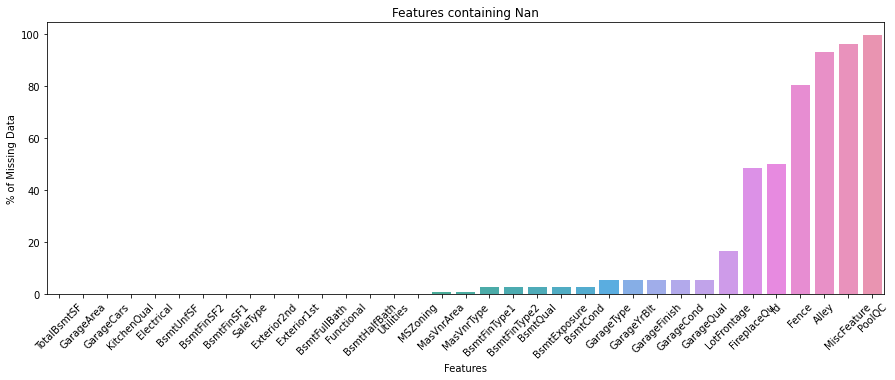

In [20]:
# Plotting Nan

plt.figure(figsize = (15,5))
sns.barplot(x = nan['feat'], y = nan['Perc(%)'])
plt.xticks(rotation=45)
plt.title('Features containing Nan')
plt.xlabel('Features')
plt.ylabel('% of Missing Data')
plt.show()

Are we sure that all these nans are real missing values? Looking at the given description file, we can see how the majority of these nans reflect the absence of something, and for this reason, they are not nans. We can impute them (for numerical features) or substitute them with data in the file:

In [32]:
# Converting non-numeric predictors stored as numbers into string

train_test['MSSubClass'] = train_test['MSSubClass'].apply(str)
train_test['YrSold'] = train_test['YrSold'].apply(str)
train_test['MoSold'] = train_test['MoSold'].apply(str)

# Filling Categorical NaN (That we know how to fill due to the description file )

train_test['Functional'] = train_test['Functional'].fillna('Typ')
train_test['Electrical'] = train_test['Electrical'].fillna("SBrkr")
train_test['KitchenQual'] = train_test['KitchenQual'].fillna("TA")
train_test['Exterior1st'] = train_test['Exterior1st'].fillna(train_test['Exterior1st'].mode()[0])
train_test['Exterior2nd'] = train_test['Exterior2nd'].fillna(train_test['Exterior2nd'].mode()[0])
train_test['SaleType'] = train_test['SaleType'].fillna(train_test['SaleType'].mode()[0])
train_test["PoolQC"] = train_test["PoolQC"].fillna("None")
train_test["Alley"] = train_test["Alley"].fillna("None")
train_test['FireplaceQu'] = train_test['FireplaceQu'].fillna("None")
train_test['Fence'] = train_test['Fence'].fillna("None")
train_test['MiscFeature'] = train_test['MiscFeature'].fillna("None")

for col in ('GarageArea', 'GarageCars'):
    train_test[col] = train_test[col].fillna(0)
        
for col in ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']:
    train_test[col] = train_test[col].fillna('None')
    
for col in ('BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2'):
    train_test[col] = train_test[col].fillna('None')
    
    # Checking the features with NaN remained out

for col in train_test:
    if train_test[col].isna().sum() > 0:
        print(train_test[col][0])

0    1.0
0    NaN
Name: Id, dtype: float64
0    RL
0    RH
Name: MSZoning, dtype: object
0    65.0
0    80.0
Name: LotFrontage, dtype: float64
0    AllPub
0    AllPub
Name: Utilities, dtype: object
0    BrkFace
0       None
Name: MasVnrType, dtype: object
0    196.0
0      0.0
Name: MasVnrArea, dtype: float64
0    706.0
0    468.0
Name: BsmtFinSF1, dtype: float64
0      0.0
0    144.0
Name: BsmtFinSF2, dtype: float64
0    150.0
0    270.0
Name: BsmtUnfSF, dtype: float64
0    856.0
0    882.0
Name: TotalBsmtSF, dtype: float64
0    1.0
0    0.0
Name: BsmtFullBath, dtype: float64
0    0.0
0    0.0
Name: BsmtHalfBath, dtype: float64
0    2003.0
0    1961.0
Name: GarageYrBlt, dtype: float64
0    3.5
0    1.0
Name: Total_Bathrooms, dtype: float64


In [33]:
# Removing the useless variables

useless = ['GarageYrBlt','YearRemodAdd'] 
train_test = train_test.drop(useless, axis = 1)

# Imputing with KnnRegressor (we can also use different Imputers)

def impute_knn(df):
    ttn = train_test.select_dtypes(include=[np.number])
    ttc = train_test.select_dtypes(exclude=[np.number])

    cols_nan = ttn.columns[ttn.isna().any()].tolist()         # columns w/ nan 
    cols_no_nan = ttn.columns.difference(cols_nan).values     # columns w/n nan

    for col in cols_nan:
        imp_test = ttn[ttn[col].isna()]   # indicies which have missing data will become our test set
        imp_train = ttn.dropna()          # all indicies which which have no missing data 
        model = KNeighborsRegressor(n_neighbors=5)  # KNR Unsupervised Approach
        knr = model.fit(imp_train[cols_no_nan], imp_train[col])
        ttn.loc[ttn[col].isna(), col] = knr.predict(imp_test[cols_no_nan])
    
    return pd.concat([ttn,ttc],axis=1)

train_test = impute_knn(train_test)


objects = []
for i in train_test.columns:
    if train_test[i].dtype == object:
        objects.append(i)
train_test.update(train_test[objects].fillna('None'))

# # Checking NaN presence

for col in train_test:
    if train_test[col].isna().sum() > 0:
        print(train_test[col][0])

### FEATURE ENGINEERING

Let's create some new features combining the ones that we already have. These could help us to increase the performance of the model!

In [34]:
train_test["SqFtPerRoom"] = train_test["GrLivArea"] / (train_test["TotRmsAbvGrd"] +
                                                       train_test["FullBath"] +
                                                       train_test["HalfBath"] +
                                                       train_test["KitchenAbvGr"])

train_test['Total_Home_Quality'] = train_test['OverallQual'] + train_test['OverallCond']

train_test['Total_Bathrooms'] = (train_test['FullBath'] + (0.5 * train_test['HalfBath']) +
                               train_test['BsmtFullBath'] + (0.5 * train_test['BsmtHalfBath']))

train_test["HighQualSF"] = train_test["1stFlrSF"] + train_test["2ndFlrSF"]

# Converting non-numeric predictors stored as numbers into string

train_test['MSSubClass'] = train_test['MSSubClass'].apply(str)
train_test['YrSold'] = train_test['YrSold'].apply(str)
train_test['MoSold'] = train_test['MoSold'].apply(str)

# Creating dummy variables from categorical features

train_test_dummy = pd.get_dummies(train_test)

# Fetch all numeric features

#train_test['Id'] = train_test['Id'].apply(str)
numeric_features = train_test_dummy.dtypes[train_test_dummy.dtypes != object].index
skewed_features = train_test_dummy[numeric_features].apply(lambda x: skew(x)).sort_values(ascending=False)
high_skew = skewed_features[skewed_features > 0.5]
skew_index = high_skew.index

# Normalize skewed features using log_transformation
    
for i in skew_index:
    train_test_dummy[i] = np.log1p(train_test_dummy[i])

Now let's try to tranform our target distribution into a normal one. To do this we use a log transformation. We will use qq-plot to see the transformation effect.  

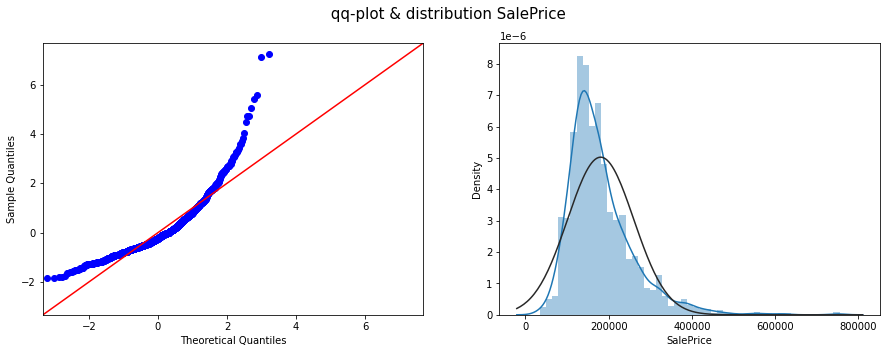

In [35]:
# SalePrice before transformation

fig, ax = plt.subplots(1,2, figsize= (15,5))
fig.suptitle(" qq-plot & distribution SalePrice ", fontsize= 15)

sm.qqplot(target, stats.t, distargs=(4,),fit=True, line="45", ax = ax[0])

sns.distplot(target, kde = True, hist=True, fit = norm, ax = ax[1])
plt.show()

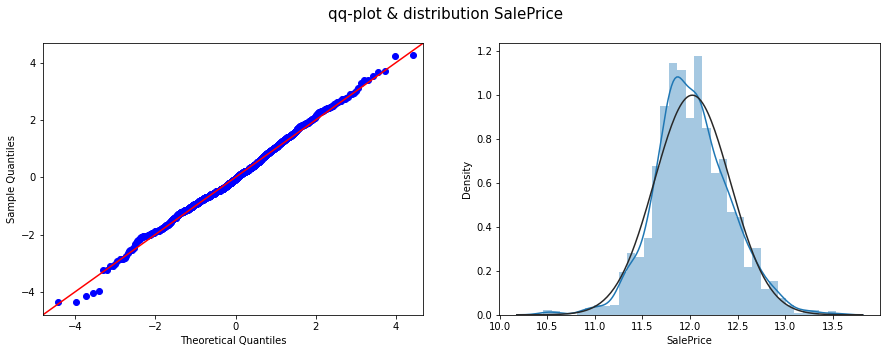

In [36]:
# SalePrice after transformation

target_log = np.log1p(target)

fig, ax = plt.subplots(1,2, figsize= (15,5))
fig.suptitle("qq-plot & distribution SalePrice ", fontsize= 15)

sm.qqplot(target_log, stats.t, distargs=(4,),fit=True, line="45", ax = ax[0])
sns.distplot(target_log, kde = True, hist=True, fit = norm, ax = ax[1])
plt.show()

### MODELING

In [45]:
import shap
import xgboost as xgb
from catboost import Pool
from sklearn.svm import SVR
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeRegressor
from mlxtend.regressor import StackingRegressor
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_squared_log_error

In [46]:
# Train-Test separation

train = train_test_dummy[0:1460]
test = train_test_dummy[1460:]
test['Id'] = test_id

# Creation of the RMSE metric:
    
def rmse(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

def cv_rmse(model):
    rmse = np.sqrt(-cross_val_score(model, train, target_log, scoring="neg_mean_squared_error", cv=kf))
    print(str(model))
    print('rmse', rmse)
    return (rmse)

In [47]:
# 10 Fold Cross validation

kf = KFold(n_splits=10, random_state=42, shuffle=True)

cv_scores = []
cv_std = []

baseline_models = ['Linear_Reg.','Bayesian_Ridge_Reg.','LGBM_Reg.','SVR',
                   'Dec_Tree_Reg.','Random_Forest_Reg.', 'XGB_Reg.',
                   'Grad_Boost_Reg.','Cat_Boost_Reg.','Stacked_Reg.']

# Linear Regression

lreg = LinearRegression()
score_lreg = cv_rmse(lreg)
cv_scores.append(score_lreg.mean())
cv_std.append(score_lreg.std())

# Bayesian Ridge Regression

brr = BayesianRidge(compute_score=True)
score_brr = cv_rmse(brr)
cv_scores.append(score_brr.mean())
cv_std.append(score_brr.std())

# Light Gradient Boost Regressor

l_gbm = LGBMRegressor(objective='regression')
score_l_gbm = cv_rmse(l_gbm)
cv_scores.append(score_l_gbm.mean())
cv_std.append(score_l_gbm.std())

# Support Vector Regression

svr = SVR()
score_svr = cv_rmse(svr)
cv_scores.append(score_svr.mean())
cv_std.append(score_svr.std())

# Decision Tree Regressor

dtr = DecisionTreeRegressor()
score_dtr = cv_rmse(dtr)
cv_scores.append(score_dtr.mean())
cv_std.append(score_dtr.std())

# Random Forest Regressor

rfr = RandomForestRegressor()
score_rfr = cv_rmse(rfr)
cv_scores.append(score_rfr.mean())
cv_std.append(score_rfr.std())

# XGB Regressor

xgb = xgb.XGBRegressor()
score_xgb = cv_rmse(xgb)
cv_scores.append(score_xgb.mean())
cv_std.append(score_xgb.std())

# Gradient Boost Regressor

gbr = GradientBoostingRegressor()
score_gbr = cv_rmse(gbr)
cv_scores.append(score_gbr.mean())
cv_std.append(score_gbr.std())

# Cat Boost Regressor

catb = CatBoostRegressor()
score_catb = cv_rmse(catb)
cv_scores.append(score_catb.mean())
cv_std.append(score_catb.std())

# Stacked Regressor

stack_gen = StackingRegressor(regressors=(CatBoostRegressor(),
                                          LinearRegression(),
                                          BayesianRidge(),
                                          GradientBoostingRegressor()),
                              meta_regressor = CatBoostRegressor(),
                              use_features_in_secondary = True)

score_stack_gen = cv_rmse(stack_gen)
cv_scores.append(score_stack_gen.mean())
cv_std.append(score_stack_gen.std())

final_cv_score = pd.DataFrame(baseline_models, columns = ['Regressors'])
final_cv_score['RMSE_mean'] = cv_scores
final_cv_score['RMSE_std'] = cv_std

LinearRegression()
rmse [0.11761927 0.15126754 0.18339565 0.1319717  0.15672264 0.19046989
 0.14998864 0.11352499 0.13557591 0.08402282]
BayesianRidge(compute_score=True)
rmse [0.10839486 0.14692977 0.1096669  0.12811632 0.14374952 0.1789201
 0.12667819 0.10656594 0.13028201 0.08326642]
LGBMRegressor(objective='regression')
rmse [0.12135782 0.14822475 0.1175453  0.12558738 0.15780176 0.1550948
 0.14883166 0.11424057 0.13862449 0.08970889]
SVR()
rmse [0.30782156 0.30735268 0.25487159 0.27683047 0.2562291  0.27377021
 0.32104153 0.27185433 0.2732228  0.2549125 ]
DecisionTreeRegressor()
rmse [0.21909687 0.19650535 0.16367727 0.24711569 0.23000951 0.23486724
 0.21211695 0.17997061 0.23043093 0.18022796]
RandomForestRegressor()
rmse [0.13428501 0.15312864 0.10617968 0.14378405 0.1670537  0.15772708
 0.16600261 0.13039101 0.14466324 0.09925779]
XGBRegressor(base_score=None, booster=None, colsample_bylevel=None,
             colsample_bynode=None, colsample_bytree=None, gamma=None,
          

126:	learn: 0.1104499	total: 714ms	remaining: 4.91s
127:	learn: 0.1101100	total: 720ms	remaining: 4.9s
128:	learn: 0.1097946	total: 725ms	remaining: 4.89s
129:	learn: 0.1095944	total: 730ms	remaining: 4.89s
130:	learn: 0.1093442	total: 736ms	remaining: 4.88s
131:	learn: 0.1091049	total: 741ms	remaining: 4.87s
132:	learn: 0.1088304	total: 746ms	remaining: 4.86s
133:	learn: 0.1085096	total: 751ms	remaining: 4.86s
134:	learn: 0.1083071	total: 757ms	remaining: 4.85s
135:	learn: 0.1080835	total: 762ms	remaining: 4.84s
136:	learn: 0.1079314	total: 768ms	remaining: 4.83s
137:	learn: 0.1076609	total: 773ms	remaining: 4.83s
138:	learn: 0.1075894	total: 778ms	remaining: 4.82s
139:	learn: 0.1073539	total: 784ms	remaining: 4.81s
140:	learn: 0.1071326	total: 789ms	remaining: 4.81s
141:	learn: 0.1070945	total: 794ms	remaining: 4.8s
142:	learn: 0.1068060	total: 800ms	remaining: 4.79s
143:	learn: 0.1066120	total: 805ms	remaining: 4.79s
144:	learn: 0.1063980	total: 811ms	remaining: 4.78s
145:	learn: 0.

299:	learn: 0.0808786	total: 1.72s	remaining: 4.02s
300:	learn: 0.0807865	total: 1.73s	remaining: 4.02s
301:	learn: 0.0806490	total: 1.74s	remaining: 4.01s
302:	learn: 0.0805081	total: 1.74s	remaining: 4s
303:	learn: 0.0804076	total: 1.75s	remaining: 4s
304:	learn: 0.0803200	total: 1.75s	remaining: 3.99s
305:	learn: 0.0802884	total: 1.76s	remaining: 3.98s
306:	learn: 0.0801471	total: 1.76s	remaining: 3.98s
307:	learn: 0.0800447	total: 1.77s	remaining: 3.97s
308:	learn: 0.0799306	total: 1.77s	remaining: 3.96s
309:	learn: 0.0797951	total: 1.78s	remaining: 3.96s
310:	learn: 0.0797360	total: 1.78s	remaining: 3.95s
311:	learn: 0.0796117	total: 1.79s	remaining: 3.94s
312:	learn: 0.0795136	total: 1.79s	remaining: 3.94s
313:	learn: 0.0793542	total: 1.8s	remaining: 3.93s
314:	learn: 0.0792545	total: 1.8s	remaining: 3.92s
315:	learn: 0.0791896	total: 1.81s	remaining: 3.92s
316:	learn: 0.0790015	total: 1.81s	remaining: 3.91s
317:	learn: 0.0789146	total: 1.82s	remaining: 3.9s
318:	learn: 0.0787276

473:	learn: 0.0642680	total: 2.72s	remaining: 3.02s
474:	learn: 0.0641747	total: 2.73s	remaining: 3.01s
475:	learn: 0.0640829	total: 2.73s	remaining: 3.01s
476:	learn: 0.0639801	total: 2.74s	remaining: 3s
477:	learn: 0.0638942	total: 2.75s	remaining: 3s
478:	learn: 0.0637826	total: 2.77s	remaining: 3.01s
479:	learn: 0.0637746	total: 2.78s	remaining: 3.01s
480:	learn: 0.0636879	total: 2.78s	remaining: 3s
481:	learn: 0.0636324	total: 2.79s	remaining: 3s
482:	learn: 0.0635577	total: 2.79s	remaining: 2.99s
483:	learn: 0.0634430	total: 2.8s	remaining: 2.98s
484:	learn: 0.0633218	total: 2.81s	remaining: 2.98s
485:	learn: 0.0633137	total: 2.81s	remaining: 2.97s
486:	learn: 0.0632025	total: 2.82s	remaining: 2.97s
487:	learn: 0.0631693	total: 2.82s	remaining: 2.96s
488:	learn: 0.0631056	total: 2.83s	remaining: 2.95s
489:	learn: 0.0630484	total: 2.83s	remaining: 2.95s
490:	learn: 0.0629475	total: 2.84s	remaining: 2.94s
491:	learn: 0.0629020	total: 2.84s	remaining: 2.94s
492:	learn: 0.0628204	tot

636:	learn: 0.0532760	total: 3.72s	remaining: 2.12s
637:	learn: 0.0531813	total: 3.72s	remaining: 2.11s
638:	learn: 0.0530845	total: 3.73s	remaining: 2.11s
639:	learn: 0.0530062	total: 3.73s	remaining: 2.1s
640:	learn: 0.0529391	total: 3.74s	remaining: 2.09s
641:	learn: 0.0528580	total: 3.75s	remaining: 2.09s
642:	learn: 0.0528037	total: 3.75s	remaining: 2.08s
643:	learn: 0.0527280	total: 3.76s	remaining: 2.08s
644:	learn: 0.0526564	total: 3.76s	remaining: 2.07s
645:	learn: 0.0526505	total: 3.77s	remaining: 2.06s
646:	learn: 0.0526245	total: 3.77s	remaining: 2.06s
647:	learn: 0.0525673	total: 3.78s	remaining: 2.05s
648:	learn: 0.0525295	total: 3.78s	remaining: 2.05s
649:	learn: 0.0524461	total: 3.79s	remaining: 2.04s
650:	learn: 0.0523771	total: 3.79s	remaining: 2.03s
651:	learn: 0.0523144	total: 3.8s	remaining: 2.03s
652:	learn: 0.0522751	total: 3.81s	remaining: 2.02s
653:	learn: 0.0522153	total: 3.81s	remaining: 2.02s
654:	learn: 0.0521900	total: 3.82s	remaining: 2.01s
655:	learn: 0.

801:	learn: 0.0450730	total: 4.71s	remaining: 1.16s
802:	learn: 0.0450363	total: 4.72s	remaining: 1.16s
803:	learn: 0.0449790	total: 4.72s	remaining: 1.15s
804:	learn: 0.0449004	total: 4.73s	remaining: 1.15s
805:	learn: 0.0448607	total: 4.74s	remaining: 1.14s
806:	learn: 0.0448058	total: 4.74s	remaining: 1.13s
807:	learn: 0.0447503	total: 4.75s	remaining: 1.13s
808:	learn: 0.0446907	total: 4.75s	remaining: 1.12s
809:	learn: 0.0446714	total: 4.76s	remaining: 1.12s
810:	learn: 0.0446203	total: 4.76s	remaining: 1.11s
811:	learn: 0.0445633	total: 4.77s	remaining: 1.1s
812:	learn: 0.0444879	total: 4.77s	remaining: 1.1s
813:	learn: 0.0444488	total: 4.78s	remaining: 1.09s
814:	learn: 0.0444162	total: 4.79s	remaining: 1.09s
815:	learn: 0.0443767	total: 4.79s	remaining: 1.08s
816:	learn: 0.0443291	total: 4.8s	remaining: 1.07s
817:	learn: 0.0442796	total: 4.8s	remaining: 1.07s
818:	learn: 0.0442278	total: 4.81s	remaining: 1.06s
819:	learn: 0.0441746	total: 4.82s	remaining: 1.06s
820:	learn: 0.04

970:	learn: 0.0383384	total: 5.7s	remaining: 170ms
971:	learn: 0.0382975	total: 5.71s	remaining: 164ms
972:	learn: 0.0382595	total: 5.71s	remaining: 159ms
973:	learn: 0.0382267	total: 5.72s	remaining: 153ms
974:	learn: 0.0381762	total: 5.72s	remaining: 147ms
975:	learn: 0.0381672	total: 5.73s	remaining: 141ms
976:	learn: 0.0381342	total: 5.74s	remaining: 135ms
977:	learn: 0.0381163	total: 5.74s	remaining: 129ms
978:	learn: 0.0380701	total: 5.75s	remaining: 123ms
979:	learn: 0.0380459	total: 5.75s	remaining: 117ms
980:	learn: 0.0380033	total: 5.76s	remaining: 112ms
981:	learn: 0.0379967	total: 5.76s	remaining: 106ms
982:	learn: 0.0379528	total: 5.77s	remaining: 99.8ms
983:	learn: 0.0379507	total: 5.77s	remaining: 93.9ms
984:	learn: 0.0378985	total: 5.78s	remaining: 88ms
985:	learn: 0.0378778	total: 5.78s	remaining: 82.1ms
986:	learn: 0.0378239	total: 5.79s	remaining: 76.3ms
987:	learn: 0.0377976	total: 5.79s	remaining: 70.4ms
988:	learn: 0.0377674	total: 5.8s	remaining: 64.5ms
989:	lear

161:	learn: 0.0989083	total: 999ms	remaining: 5.17s
162:	learn: 0.0987062	total: 1s	remaining: 5.16s
163:	learn: 0.0984778	total: 1.01s	remaining: 5.16s
164:	learn: 0.0983195	total: 1.02s	remaining: 5.18s
165:	learn: 0.0981653	total: 1.03s	remaining: 5.17s
166:	learn: 0.0980514	total: 1.03s	remaining: 5.16s
167:	learn: 0.0978815	total: 1.04s	remaining: 5.15s
168:	learn: 0.0976907	total: 1.04s	remaining: 5.14s
169:	learn: 0.0975870	total: 1.05s	remaining: 5.13s
170:	learn: 0.0974380	total: 1.06s	remaining: 5.12s
171:	learn: 0.0972034	total: 1.06s	remaining: 5.11s
172:	learn: 0.0970408	total: 1.07s	remaining: 5.1s
173:	learn: 0.0968566	total: 1.07s	remaining: 5.09s
174:	learn: 0.0966926	total: 1.08s	remaining: 5.08s
175:	learn: 0.0964919	total: 1.08s	remaining: 5.07s
176:	learn: 0.0963295	total: 1.09s	remaining: 5.07s
177:	learn: 0.0961277	total: 1.09s	remaining: 5.05s
178:	learn: 0.0960095	total: 1.1s	remaining: 5.04s
179:	learn: 0.0958070	total: 1.1s	remaining: 5.04s
180:	learn: 0.0956

326:	learn: 0.0759064	total: 1.99s	remaining: 4.09s
327:	learn: 0.0758869	total: 2s	remaining: 4.09s
328:	learn: 0.0757665	total: 2s	remaining: 4.08s
329:	learn: 0.0756365	total: 2.01s	remaining: 4.07s
330:	learn: 0.0756236	total: 2.01s	remaining: 4.07s
331:	learn: 0.0755211	total: 2.02s	remaining: 4.06s
332:	learn: 0.0754943	total: 2.02s	remaining: 4.05s
333:	learn: 0.0754007	total: 2.03s	remaining: 4.04s
334:	learn: 0.0752553	total: 2.03s	remaining: 4.04s
335:	learn: 0.0751941	total: 2.04s	remaining: 4.03s
336:	learn: 0.0750049	total: 2.04s	remaining: 4.02s
337:	learn: 0.0749032	total: 2.05s	remaining: 4.01s
338:	learn: 0.0748369	total: 2.05s	remaining: 4.01s
339:	learn: 0.0748182	total: 2.06s	remaining: 4s
340:	learn: 0.0746214	total: 2.06s	remaining: 3.99s
341:	learn: 0.0744695	total: 2.07s	remaining: 3.98s
342:	learn: 0.0743697	total: 2.08s	remaining: 3.98s
343:	learn: 0.0742544	total: 2.08s	remaining: 3.97s
344:	learn: 0.0741620	total: 2.09s	remaining: 3.97s
345:	learn: 0.0740956

498:	learn: 0.0612639	total: 2.99s	remaining: 3s
499:	learn: 0.0611944	total: 3s	remaining: 3s
500:	learn: 0.0611487	total: 3.01s	remaining: 3s
501:	learn: 0.0610586	total: 3.02s	remaining: 2.99s
502:	learn: 0.0610085	total: 3.02s	remaining: 2.99s
503:	learn: 0.0609296	total: 3.03s	remaining: 2.98s
504:	learn: 0.0608492	total: 3.03s	remaining: 2.97s
505:	learn: 0.0607359	total: 3.04s	remaining: 2.97s
506:	learn: 0.0606835	total: 3.04s	remaining: 2.96s
507:	learn: 0.0606240	total: 3.05s	remaining: 2.95s
508:	learn: 0.0605711	total: 3.05s	remaining: 2.95s
509:	learn: 0.0605163	total: 3.06s	remaining: 2.94s
510:	learn: 0.0604465	total: 3.06s	remaining: 2.93s
511:	learn: 0.0603878	total: 3.07s	remaining: 2.93s
512:	learn: 0.0602960	total: 3.08s	remaining: 2.92s
513:	learn: 0.0601931	total: 3.08s	remaining: 2.91s
514:	learn: 0.0601084	total: 3.09s	remaining: 2.91s
515:	learn: 0.0600093	total: 3.09s	remaining: 2.9s
516:	learn: 0.0599542	total: 3.1s	remaining: 2.89s
517:	learn: 0.0598600	tota

683:	learn: 0.0497729	total: 4.21s	remaining: 1.94s
684:	learn: 0.0497385	total: 4.21s	remaining: 1.94s
685:	learn: 0.0497338	total: 4.22s	remaining: 1.93s
686:	learn: 0.0496269	total: 4.22s	remaining: 1.93s
687:	learn: 0.0495644	total: 4.23s	remaining: 1.92s
688:	learn: 0.0495505	total: 4.24s	remaining: 1.91s
689:	learn: 0.0494791	total: 4.24s	remaining: 1.91s
690:	learn: 0.0494181	total: 4.25s	remaining: 1.9s
691:	learn: 0.0493657	total: 4.25s	remaining: 1.89s
692:	learn: 0.0492690	total: 4.26s	remaining: 1.89s
693:	learn: 0.0492097	total: 4.26s	remaining: 1.88s
694:	learn: 0.0491404	total: 4.27s	remaining: 1.87s
695:	learn: 0.0491345	total: 4.28s	remaining: 1.87s
696:	learn: 0.0491088	total: 4.28s	remaining: 1.86s
697:	learn: 0.0490560	total: 4.29s	remaining: 1.85s
698:	learn: 0.0490522	total: 4.29s	remaining: 1.85s
699:	learn: 0.0489888	total: 4.3s	remaining: 1.84s
700:	learn: 0.0489582	total: 4.3s	remaining: 1.83s
701:	learn: 0.0489215	total: 4.31s	remaining: 1.83s
702:	learn: 0.0

851:	learn: 0.0423312	total: 5.21s	remaining: 905ms
852:	learn: 0.0422793	total: 5.21s	remaining: 898ms
853:	learn: 0.0422230	total: 5.22s	remaining: 892ms
854:	learn: 0.0421713	total: 5.22s	remaining: 886ms
855:	learn: 0.0421355	total: 5.23s	remaining: 880ms
856:	learn: 0.0420872	total: 5.24s	remaining: 874ms
857:	learn: 0.0420429	total: 5.24s	remaining: 867ms
858:	learn: 0.0420056	total: 5.25s	remaining: 861ms
859:	learn: 0.0419403	total: 5.25s	remaining: 855ms
860:	learn: 0.0419120	total: 5.26s	remaining: 849ms
861:	learn: 0.0418825	total: 5.26s	remaining: 843ms
862:	learn: 0.0418121	total: 5.27s	remaining: 837ms
863:	learn: 0.0417584	total: 5.28s	remaining: 831ms
864:	learn: 0.0417093	total: 5.28s	remaining: 825ms
865:	learn: 0.0416340	total: 5.29s	remaining: 819ms
866:	learn: 0.0415678	total: 5.3s	remaining: 813ms
867:	learn: 0.0415217	total: 5.3s	remaining: 807ms
868:	learn: 0.0414529	total: 5.31s	remaining: 801ms
869:	learn: 0.0414348	total: 5.32s	remaining: 795ms
870:	learn: 0.

32:	learn: 0.2019237	total: 197ms	remaining: 5.76s
33:	learn: 0.1987555	total: 202ms	remaining: 5.75s
34:	learn: 0.1958775	total: 209ms	remaining: 5.76s
35:	learn: 0.1931755	total: 215ms	remaining: 5.76s
36:	learn: 0.1905487	total: 220ms	remaining: 5.74s
37:	learn: 0.1878250	total: 227ms	remaining: 5.74s
38:	learn: 0.1851990	total: 232ms	remaining: 5.73s
39:	learn: 0.1828273	total: 239ms	remaining: 5.73s
40:	learn: 0.1804094	total: 245ms	remaining: 5.72s
41:	learn: 0.1777762	total: 250ms	remaining: 5.7s
42:	learn: 0.1755388	total: 256ms	remaining: 5.7s
43:	learn: 0.1734241	total: 262ms	remaining: 5.69s
44:	learn: 0.1712909	total: 268ms	remaining: 5.68s
45:	learn: 0.1694481	total: 276ms	remaining: 5.72s
46:	learn: 0.1675338	total: 285ms	remaining: 5.78s
47:	learn: 0.1658165	total: 291ms	remaining: 5.77s
48:	learn: 0.1640222	total: 297ms	remaining: 5.77s
49:	learn: 0.1625366	total: 303ms	remaining: 5.76s
50:	learn: 0.1610806	total: 309ms	remaining: 5.74s
51:	learn: 0.1595088	total: 314ms

197:	learn: 0.0958466	total: 1.19s	remaining: 4.81s
198:	learn: 0.0957354	total: 1.2s	remaining: 4.83s
199:	learn: 0.0955131	total: 1.21s	remaining: 4.83s
200:	learn: 0.0953618	total: 1.22s	remaining: 4.83s
201:	learn: 0.0952127	total: 1.22s	remaining: 4.83s
202:	learn: 0.0950038	total: 1.23s	remaining: 4.83s
203:	learn: 0.0948104	total: 1.24s	remaining: 4.83s
204:	learn: 0.0945907	total: 1.24s	remaining: 4.82s
205:	learn: 0.0944907	total: 1.25s	remaining: 4.82s
206:	learn: 0.0943220	total: 1.26s	remaining: 4.81s
207:	learn: 0.0941571	total: 1.26s	remaining: 4.81s
208:	learn: 0.0940284	total: 1.27s	remaining: 4.8s
209:	learn: 0.0938802	total: 1.27s	remaining: 4.79s
210:	learn: 0.0936827	total: 1.28s	remaining: 4.78s
211:	learn: 0.0935519	total: 1.28s	remaining: 4.78s
212:	learn: 0.0932879	total: 1.29s	remaining: 4.77s
213:	learn: 0.0930708	total: 1.3s	remaining: 4.76s
214:	learn: 0.0929990	total: 1.3s	remaining: 4.75s
215:	learn: 0.0928236	total: 1.31s	remaining: 4.75s
216:	learn: 0.09

367:	learn: 0.0726096	total: 2.19s	remaining: 3.76s
368:	learn: 0.0725030	total: 2.19s	remaining: 3.75s
369:	learn: 0.0724281	total: 2.2s	remaining: 3.74s
370:	learn: 0.0723176	total: 2.2s	remaining: 3.73s
371:	learn: 0.0721994	total: 2.21s	remaining: 3.73s
372:	learn: 0.0721385	total: 2.21s	remaining: 3.72s
373:	learn: 0.0720613	total: 2.22s	remaining: 3.71s
374:	learn: 0.0719883	total: 2.22s	remaining: 3.71s
375:	learn: 0.0718510	total: 2.23s	remaining: 3.7s
376:	learn: 0.0717255	total: 2.23s	remaining: 3.69s
377:	learn: 0.0715925	total: 2.24s	remaining: 3.69s
378:	learn: 0.0715789	total: 2.25s	remaining: 3.68s
379:	learn: 0.0714396	total: 2.25s	remaining: 3.67s
380:	learn: 0.0713688	total: 2.26s	remaining: 3.67s
381:	learn: 0.0713569	total: 2.26s	remaining: 3.66s
382:	learn: 0.0712209	total: 2.27s	remaining: 3.65s
383:	learn: 0.0710577	total: 2.27s	remaining: 3.65s
384:	learn: 0.0709486	total: 2.28s	remaining: 3.64s
385:	learn: 0.0708658	total: 2.28s	remaining: 3.63s
386:	learn: 0.0

537:	learn: 0.0579183	total: 3.17s	remaining: 2.73s
538:	learn: 0.0578522	total: 3.18s	remaining: 2.72s
539:	learn: 0.0576901	total: 3.19s	remaining: 2.71s
540:	learn: 0.0575869	total: 3.19s	remaining: 2.71s
541:	learn: 0.0575124	total: 3.2s	remaining: 2.7s
542:	learn: 0.0574532	total: 3.2s	remaining: 2.69s
543:	learn: 0.0573844	total: 3.21s	remaining: 2.69s
544:	learn: 0.0573106	total: 3.21s	remaining: 2.68s
545:	learn: 0.0572280	total: 3.22s	remaining: 2.67s
546:	learn: 0.0572202	total: 3.22s	remaining: 2.67s
547:	learn: 0.0571903	total: 3.23s	remaining: 2.66s
548:	learn: 0.0571152	total: 3.23s	remaining: 2.66s
549:	learn: 0.0570297	total: 3.24s	remaining: 2.65s
550:	learn: 0.0569705	total: 3.24s	remaining: 2.64s
551:	learn: 0.0568872	total: 3.25s	remaining: 2.64s
552:	learn: 0.0568815	total: 3.25s	remaining: 2.63s
553:	learn: 0.0568741	total: 3.26s	remaining: 2.62s
554:	learn: 0.0568385	total: 3.27s	remaining: 2.62s
555:	learn: 0.0567480	total: 3.27s	remaining: 2.61s
556:	learn: 0.0

710:	learn: 0.0473431	total: 4.17s	remaining: 1.69s
711:	learn: 0.0472992	total: 4.18s	remaining: 1.69s
712:	learn: 0.0472665	total: 4.18s	remaining: 1.68s
713:	learn: 0.0471870	total: 4.19s	remaining: 1.68s
714:	learn: 0.0471139	total: 4.19s	remaining: 1.67s
715:	learn: 0.0470363	total: 4.2s	remaining: 1.67s
716:	learn: 0.0469442	total: 4.21s	remaining: 1.66s
717:	learn: 0.0469026	total: 4.22s	remaining: 1.66s
718:	learn: 0.0468175	total: 4.22s	remaining: 1.65s
719:	learn: 0.0468132	total: 4.23s	remaining: 1.64s
720:	learn: 0.0467532	total: 4.23s	remaining: 1.64s
721:	learn: 0.0466926	total: 4.24s	remaining: 1.63s
722:	learn: 0.0466209	total: 4.25s	remaining: 1.63s
723:	learn: 0.0465814	total: 4.25s	remaining: 1.62s
724:	learn: 0.0465238	total: 4.26s	remaining: 1.61s
725:	learn: 0.0464749	total: 4.26s	remaining: 1.61s
726:	learn: 0.0464220	total: 4.27s	remaining: 1.6s
727:	learn: 0.0464182	total: 4.27s	remaining: 1.6s
728:	learn: 0.0463642	total: 4.28s	remaining: 1.59s
729:	learn: 0.0

876:	learn: 0.0402483	total: 5.16s	remaining: 724ms
877:	learn: 0.0402172	total: 5.17s	remaining: 718ms
878:	learn: 0.0401837	total: 5.17s	remaining: 712ms
879:	learn: 0.0401287	total: 5.18s	remaining: 706ms
880:	learn: 0.0401128	total: 5.18s	remaining: 700ms
881:	learn: 0.0400494	total: 5.19s	remaining: 694ms
882:	learn: 0.0399953	total: 5.2s	remaining: 688ms
883:	learn: 0.0399510	total: 5.2s	remaining: 682ms
884:	learn: 0.0399086	total: 5.21s	remaining: 676ms
885:	learn: 0.0399002	total: 5.21s	remaining: 671ms
886:	learn: 0.0398423	total: 5.22s	remaining: 665ms
887:	learn: 0.0398163	total: 5.22s	remaining: 659ms
888:	learn: 0.0397830	total: 5.23s	remaining: 653ms
889:	learn: 0.0397613	total: 5.23s	remaining: 647ms
890:	learn: 0.0397273	total: 5.24s	remaining: 641ms
891:	learn: 0.0396965	total: 5.24s	remaining: 635ms
892:	learn: 0.0396732	total: 5.25s	remaining: 629ms
893:	learn: 0.0396437	total: 5.25s	remaining: 623ms
894:	learn: 0.0396381	total: 5.26s	remaining: 617ms
895:	learn: 0.

34:	learn: 0.1907540	total: 196ms	remaining: 5.41s
35:	learn: 0.1881215	total: 202ms	remaining: 5.41s
36:	learn: 0.1860136	total: 208ms	remaining: 5.41s
37:	learn: 0.1835804	total: 214ms	remaining: 5.41s
38:	learn: 0.1812333	total: 219ms	remaining: 5.4s
39:	learn: 0.1787712	total: 224ms	remaining: 5.39s
40:	learn: 0.1764962	total: 230ms	remaining: 5.38s
41:	learn: 0.1742646	total: 235ms	remaining: 5.37s
42:	learn: 0.1722752	total: 241ms	remaining: 5.36s
43:	learn: 0.1701599	total: 247ms	remaining: 5.36s
44:	learn: 0.1682599	total: 252ms	remaining: 5.36s
45:	learn: 0.1664255	total: 258ms	remaining: 5.35s
46:	learn: 0.1645986	total: 264ms	remaining: 5.35s
47:	learn: 0.1629388	total: 270ms	remaining: 5.35s
48:	learn: 0.1614307	total: 275ms	remaining: 5.34s
49:	learn: 0.1597437	total: 281ms	remaining: 5.33s
50:	learn: 0.1581029	total: 287ms	remaining: 5.33s
51:	learn: 0.1567610	total: 292ms	remaining: 5.32s
52:	learn: 0.1553865	total: 298ms	remaining: 5.32s
53:	learn: 0.1539356	total: 303m

196:	learn: 0.0943418	total: 1.19s	remaining: 4.84s
197:	learn: 0.0941717	total: 1.19s	remaining: 4.83s
198:	learn: 0.0939858	total: 1.2s	remaining: 4.82s
199:	learn: 0.0938521	total: 1.2s	remaining: 4.81s
200:	learn: 0.0937179	total: 1.21s	remaining: 4.8s
201:	learn: 0.0935814	total: 1.21s	remaining: 4.8s
202:	learn: 0.0933370	total: 1.22s	remaining: 4.79s
203:	learn: 0.0931889	total: 1.23s	remaining: 4.78s
204:	learn: 0.0930513	total: 1.23s	remaining: 4.77s
205:	learn: 0.0929376	total: 1.24s	remaining: 4.76s
206:	learn: 0.0927996	total: 1.24s	remaining: 4.76s
207:	learn: 0.0926498	total: 1.25s	remaining: 4.75s
208:	learn: 0.0925470	total: 1.25s	remaining: 4.74s
209:	learn: 0.0923593	total: 1.26s	remaining: 4.73s
210:	learn: 0.0921900	total: 1.26s	remaining: 4.72s
211:	learn: 0.0919991	total: 1.27s	remaining: 4.71s
212:	learn: 0.0918778	total: 1.27s	remaining: 4.71s
213:	learn: 0.0917247	total: 1.28s	remaining: 4.7s
214:	learn: 0.0915841	total: 1.29s	remaining: 4.7s
215:	learn: 0.0913

364:	learn: 0.0730241	total: 2.18s	remaining: 3.8s
365:	learn: 0.0728577	total: 2.19s	remaining: 3.79s
366:	learn: 0.0727546	total: 2.19s	remaining: 3.78s
367:	learn: 0.0726473	total: 2.2s	remaining: 3.78s
368:	learn: 0.0725626	total: 2.2s	remaining: 3.77s
369:	learn: 0.0724070	total: 2.21s	remaining: 3.76s
370:	learn: 0.0722954	total: 2.21s	remaining: 3.76s
371:	learn: 0.0721786	total: 2.22s	remaining: 3.75s
372:	learn: 0.0720961	total: 2.23s	remaining: 3.74s
373:	learn: 0.0720115	total: 2.24s	remaining: 3.75s
374:	learn: 0.0719245	total: 2.25s	remaining: 3.74s
375:	learn: 0.0718688	total: 2.26s	remaining: 3.75s
376:	learn: 0.0717568	total: 2.27s	remaining: 3.75s
377:	learn: 0.0717478	total: 2.27s	remaining: 3.74s
378:	learn: 0.0717001	total: 2.28s	remaining: 3.73s
379:	learn: 0.0715776	total: 2.28s	remaining: 3.72s
380:	learn: 0.0714212	total: 2.29s	remaining: 3.72s
381:	learn: 0.0713075	total: 2.29s	remaining: 3.71s
382:	learn: 0.0712236	total: 2.3s	remaining: 3.71s
383:	learn: 0.07

539:	learn: 0.0587307	total: 3.18s	remaining: 2.71s
540:	learn: 0.0586452	total: 3.18s	remaining: 2.7s
541:	learn: 0.0585612	total: 3.19s	remaining: 2.69s
542:	learn: 0.0584928	total: 3.19s	remaining: 2.69s
543:	learn: 0.0584525	total: 3.2s	remaining: 2.68s
544:	learn: 0.0583735	total: 3.21s	remaining: 2.68s
545:	learn: 0.0582943	total: 3.21s	remaining: 2.67s
546:	learn: 0.0582286	total: 3.22s	remaining: 2.66s
547:	learn: 0.0581039	total: 3.22s	remaining: 2.66s
548:	learn: 0.0580403	total: 3.23s	remaining: 2.65s
549:	learn: 0.0579854	total: 3.23s	remaining: 2.65s
550:	learn: 0.0578930	total: 3.24s	remaining: 2.64s
551:	learn: 0.0578472	total: 3.25s	remaining: 2.63s
552:	learn: 0.0577498	total: 3.25s	remaining: 2.63s
553:	learn: 0.0576848	total: 3.26s	remaining: 2.62s
554:	learn: 0.0576179	total: 3.26s	remaining: 2.62s
555:	learn: 0.0575324	total: 3.27s	remaining: 2.61s
556:	learn: 0.0574262	total: 3.28s	remaining: 2.6s
557:	learn: 0.0573528	total: 3.31s	remaining: 2.62s
558:	learn: 0.0

704:	learn: 0.0484072	total: 4.18s	remaining: 1.75s
705:	learn: 0.0483360	total: 4.19s	remaining: 1.75s
706:	learn: 0.0483194	total: 4.2s	remaining: 1.74s
707:	learn: 0.0482379	total: 4.2s	remaining: 1.73s
708:	learn: 0.0481961	total: 4.21s	remaining: 1.73s
709:	learn: 0.0481458	total: 4.21s	remaining: 1.72s
710:	learn: 0.0480680	total: 4.22s	remaining: 1.72s
711:	learn: 0.0480141	total: 4.22s	remaining: 1.71s
712:	learn: 0.0479428	total: 4.23s	remaining: 1.7s
713:	learn: 0.0478648	total: 4.24s	remaining: 1.7s
714:	learn: 0.0477924	total: 4.24s	remaining: 1.69s
715:	learn: 0.0477386	total: 4.25s	remaining: 1.69s
716:	learn: 0.0476603	total: 4.26s	remaining: 1.68s
717:	learn: 0.0475807	total: 4.26s	remaining: 1.68s
718:	learn: 0.0475561	total: 4.27s	remaining: 1.67s
719:	learn: 0.0475179	total: 4.28s	remaining: 1.66s
720:	learn: 0.0474703	total: 4.28s	remaining: 1.66s
721:	learn: 0.0474415	total: 4.29s	remaining: 1.65s
722:	learn: 0.0473654	total: 4.29s	remaining: 1.64s
723:	learn: 0.04

867:	learn: 0.0405084	total: 5.18s	remaining: 788ms
868:	learn: 0.0404545	total: 5.2s	remaining: 784ms
869:	learn: 0.0404215	total: 5.21s	remaining: 778ms
870:	learn: 0.0403949	total: 5.21s	remaining: 772ms
871:	learn: 0.0403575	total: 5.22s	remaining: 766ms
872:	learn: 0.0402952	total: 5.23s	remaining: 760ms
873:	learn: 0.0402595	total: 5.23s	remaining: 754ms
874:	learn: 0.0401988	total: 5.24s	remaining: 748ms
875:	learn: 0.0401668	total: 5.24s	remaining: 742ms
876:	learn: 0.0401198	total: 5.25s	remaining: 736ms
877:	learn: 0.0400739	total: 5.25s	remaining: 730ms
878:	learn: 0.0400191	total: 5.26s	remaining: 724ms
879:	learn: 0.0399736	total: 5.27s	remaining: 719ms
880:	learn: 0.0398912	total: 5.28s	remaining: 713ms
881:	learn: 0.0398810	total: 5.29s	remaining: 708ms
882:	learn: 0.0398385	total: 5.3s	remaining: 702ms
883:	learn: 0.0397852	total: 5.3s	remaining: 696ms
884:	learn: 0.0397721	total: 5.31s	remaining: 690ms
885:	learn: 0.0397154	total: 5.32s	remaining: 684ms
886:	learn: 0.0

32:	learn: 0.1995687	total: 198ms	remaining: 5.8s
33:	learn: 0.1965887	total: 204ms	remaining: 5.79s
34:	learn: 0.1935257	total: 211ms	remaining: 5.82s
35:	learn: 0.1903881	total: 217ms	remaining: 5.81s
36:	learn: 0.1877325	total: 223ms	remaining: 5.79s
37:	learn: 0.1852571	total: 228ms	remaining: 5.77s
38:	learn: 0.1826865	total: 234ms	remaining: 5.75s
39:	learn: 0.1802570	total: 239ms	remaining: 5.74s
40:	learn: 0.1778506	total: 245ms	remaining: 5.73s
41:	learn: 0.1756501	total: 250ms	remaining: 5.71s
42:	learn: 0.1734168	total: 256ms	remaining: 5.7s
43:	learn: 0.1713385	total: 261ms	remaining: 5.68s
44:	learn: 0.1691487	total: 268ms	remaining: 5.68s
45:	learn: 0.1668819	total: 273ms	remaining: 5.67s
46:	learn: 0.1646469	total: 279ms	remaining: 5.66s
47:	learn: 0.1626641	total: 285ms	remaining: 5.64s
48:	learn: 0.1609670	total: 290ms	remaining: 5.63s
49:	learn: 0.1591097	total: 296ms	remaining: 5.63s
50:	learn: 0.1576975	total: 302ms	remaining: 5.61s
51:	learn: 0.1560054	total: 308ms

198:	learn: 0.0941634	total: 1.2s	remaining: 4.81s
199:	learn: 0.0940995	total: 1.2s	remaining: 4.79s
200:	learn: 0.0939361	total: 1.2s	remaining: 4.78s
201:	learn: 0.0937395	total: 1.21s	remaining: 4.77s
202:	learn: 0.0934686	total: 1.21s	remaining: 4.76s
203:	learn: 0.0934164	total: 1.22s	remaining: 4.76s
204:	learn: 0.0932874	total: 1.22s	remaining: 4.75s
205:	learn: 0.0932231	total: 1.23s	remaining: 4.73s
206:	learn: 0.0930095	total: 1.23s	remaining: 4.73s
207:	learn: 0.0927423	total: 1.24s	remaining: 4.72s
208:	learn: 0.0926287	total: 1.25s	remaining: 4.71s
209:	learn: 0.0923983	total: 1.25s	remaining: 4.7s
210:	learn: 0.0922513	total: 1.26s	remaining: 4.7s
211:	learn: 0.0921224	total: 1.26s	remaining: 4.69s
212:	learn: 0.0919390	total: 1.27s	remaining: 4.68s
213:	learn: 0.0917786	total: 1.27s	remaining: 4.67s
214:	learn: 0.0916317	total: 1.28s	remaining: 4.67s
215:	learn: 0.0915494	total: 1.28s	remaining: 4.66s
216:	learn: 0.0913549	total: 1.29s	remaining: 4.65s
217:	learn: 0.091

369:	learn: 0.0728456	total: 2.2s	remaining: 3.74s
370:	learn: 0.0727356	total: 2.2s	remaining: 3.73s
371:	learn: 0.0726530	total: 2.21s	remaining: 3.73s
372:	learn: 0.0725596	total: 2.21s	remaining: 3.72s
373:	learn: 0.0724823	total: 2.22s	remaining: 3.71s
374:	learn: 0.0723658	total: 2.22s	remaining: 3.71s
375:	learn: 0.0722386	total: 2.23s	remaining: 3.7s
376:	learn: 0.0721477	total: 2.23s	remaining: 3.69s
377:	learn: 0.0720295	total: 2.24s	remaining: 3.69s
378:	learn: 0.0719294	total: 2.25s	remaining: 3.68s
379:	learn: 0.0718134	total: 2.25s	remaining: 3.67s
380:	learn: 0.0716659	total: 2.26s	remaining: 3.67s
381:	learn: 0.0716022	total: 2.26s	remaining: 3.66s
382:	learn: 0.0715108	total: 2.27s	remaining: 3.65s
383:	learn: 0.0714973	total: 2.27s	remaining: 3.65s
384:	learn: 0.0714299	total: 2.28s	remaining: 3.64s
385:	learn: 0.0713260	total: 2.29s	remaining: 3.63s
386:	learn: 0.0712693	total: 2.29s	remaining: 3.63s
387:	learn: 0.0712327	total: 2.3s	remaining: 3.62s
388:	learn: 0.07

537:	learn: 0.0596636	total: 3.2s	remaining: 2.75s
538:	learn: 0.0596155	total: 3.2s	remaining: 2.74s
539:	learn: 0.0595750	total: 3.21s	remaining: 2.73s
540:	learn: 0.0595401	total: 3.21s	remaining: 2.73s
541:	learn: 0.0594492	total: 3.22s	remaining: 2.72s
542:	learn: 0.0593534	total: 3.23s	remaining: 2.71s
543:	learn: 0.0592743	total: 3.23s	remaining: 2.71s
544:	learn: 0.0591798	total: 3.24s	remaining: 2.7s
545:	learn: 0.0591477	total: 3.24s	remaining: 2.7s
546:	learn: 0.0590092	total: 3.25s	remaining: 2.69s
547:	learn: 0.0589242	total: 3.25s	remaining: 2.68s
548:	learn: 0.0588204	total: 3.26s	remaining: 2.68s
549:	learn: 0.0587361	total: 3.26s	remaining: 2.67s
550:	learn: 0.0586420	total: 3.27s	remaining: 2.66s
551:	learn: 0.0585655	total: 3.27s	remaining: 2.66s
552:	learn: 0.0584322	total: 3.28s	remaining: 2.65s
553:	learn: 0.0583094	total: 3.29s	remaining: 2.65s
554:	learn: 0.0582457	total: 3.29s	remaining: 2.64s
555:	learn: 0.0581664	total: 3.29s	remaining: 2.63s
556:	learn: 0.05

714:	learn: 0.0484544	total: 4.19s	remaining: 1.67s
715:	learn: 0.0483870	total: 4.2s	remaining: 1.67s
716:	learn: 0.0483356	total: 4.21s	remaining: 1.66s
717:	learn: 0.0482788	total: 4.21s	remaining: 1.65s
718:	learn: 0.0482444	total: 4.22s	remaining: 1.65s
719:	learn: 0.0481583	total: 4.22s	remaining: 1.64s
720:	learn: 0.0481382	total: 4.23s	remaining: 1.64s
721:	learn: 0.0480822	total: 4.23s	remaining: 1.63s
722:	learn: 0.0480748	total: 4.24s	remaining: 1.62s
723:	learn: 0.0480043	total: 4.25s	remaining: 1.62s
724:	learn: 0.0479805	total: 4.25s	remaining: 1.61s
725:	learn: 0.0479476	total: 4.26s	remaining: 1.61s
726:	learn: 0.0478891	total: 4.26s	remaining: 1.6s
727:	learn: 0.0478584	total: 4.27s	remaining: 1.59s
728:	learn: 0.0478149	total: 4.27s	remaining: 1.59s
729:	learn: 0.0477423	total: 4.28s	remaining: 1.58s
730:	learn: 0.0476560	total: 4.29s	remaining: 1.58s
731:	learn: 0.0476213	total: 4.29s	remaining: 1.57s
732:	learn: 0.0475854	total: 4.3s	remaining: 1.56s
733:	learn: 0.0

880:	learn: 0.0411228	total: 5.2s	remaining: 703ms
881:	learn: 0.0410713	total: 5.21s	remaining: 697ms
882:	learn: 0.0410356	total: 5.21s	remaining: 691ms
883:	learn: 0.0409838	total: 5.22s	remaining: 685ms
884:	learn: 0.0409788	total: 5.22s	remaining: 679ms
885:	learn: 0.0409176	total: 5.23s	remaining: 673ms
886:	learn: 0.0408964	total: 5.24s	remaining: 667ms
887:	learn: 0.0408361	total: 5.24s	remaining: 661ms
888:	learn: 0.0407977	total: 5.25s	remaining: 655ms
889:	learn: 0.0407943	total: 5.25s	remaining: 649ms
890:	learn: 0.0407453	total: 5.26s	remaining: 644ms
891:	learn: 0.0407197	total: 5.27s	remaining: 638ms
892:	learn: 0.0406576	total: 5.27s	remaining: 632ms
893:	learn: 0.0406412	total: 5.28s	remaining: 626ms
894:	learn: 0.0405995	total: 5.28s	remaining: 620ms
895:	learn: 0.0405695	total: 5.29s	remaining: 614ms
896:	learn: 0.0405659	total: 5.29s	remaining: 608ms
897:	learn: 0.0405386	total: 5.3s	remaining: 602ms
898:	learn: 0.0404929	total: 5.31s	remaining: 596ms
899:	learn: 0.

62:	learn: 0.1413132	total: 390ms	remaining: 5.81s
63:	learn: 0.1403151	total: 397ms	remaining: 5.8s
64:	learn: 0.1393848	total: 402ms	remaining: 5.79s
65:	learn: 0.1382530	total: 408ms	remaining: 5.77s
66:	learn: 0.1372090	total: 413ms	remaining: 5.76s
67:	learn: 0.1362991	total: 419ms	remaining: 5.74s
68:	learn: 0.1352924	total: 424ms	remaining: 5.72s
69:	learn: 0.1344702	total: 430ms	remaining: 5.71s
70:	learn: 0.1336151	total: 435ms	remaining: 5.7s
71:	learn: 0.1327541	total: 441ms	remaining: 5.68s
72:	learn: 0.1320341	total: 446ms	remaining: 5.67s
73:	learn: 0.1312662	total: 452ms	remaining: 5.66s
74:	learn: 0.1305397	total: 458ms	remaining: 5.64s
75:	learn: 0.1299027	total: 463ms	remaining: 5.63s
76:	learn: 0.1291222	total: 469ms	remaining: 5.62s
77:	learn: 0.1284477	total: 474ms	remaining: 5.6s
78:	learn: 0.1279246	total: 480ms	remaining: 5.6s
79:	learn: 0.1270839	total: 486ms	remaining: 5.59s
80:	learn: 0.1266434	total: 491ms	remaining: 5.57s
81:	learn: 0.1259170	total: 497ms	r

228:	learn: 0.0911461	total: 1.39s	remaining: 4.67s
229:	learn: 0.0909321	total: 1.39s	remaining: 4.66s
230:	learn: 0.0907466	total: 1.4s	remaining: 4.66s
231:	learn: 0.0905988	total: 1.4s	remaining: 4.65s
232:	learn: 0.0905603	total: 1.41s	remaining: 4.64s
233:	learn: 0.0903436	total: 1.41s	remaining: 4.63s
234:	learn: 0.0903045	total: 1.42s	remaining: 4.62s
235:	learn: 0.0900946	total: 1.43s	remaining: 4.62s
236:	learn: 0.0898801	total: 1.43s	remaining: 4.61s
237:	learn: 0.0898420	total: 1.44s	remaining: 4.6s
238:	learn: 0.0898046	total: 1.44s	remaining: 4.59s
239:	learn: 0.0896389	total: 1.45s	remaining: 4.58s
240:	learn: 0.0894912	total: 1.45s	remaining: 4.58s
241:	learn: 0.0894581	total: 1.46s	remaining: 4.57s
242:	learn: 0.0893862	total: 1.46s	remaining: 4.56s
243:	learn: 0.0891745	total: 1.47s	remaining: 4.55s
244:	learn: 0.0889760	total: 1.47s	remaining: 4.54s
245:	learn: 0.0889331	total: 1.48s	remaining: 4.54s
246:	learn: 0.0889017	total: 1.49s	remaining: 4.53s
247:	learn: 0.0

397:	learn: 0.0725962	total: 2.37s	remaining: 3.59s
398:	learn: 0.0724997	total: 2.38s	remaining: 3.59s
399:	learn: 0.0724874	total: 2.39s	remaining: 3.58s
400:	learn: 0.0724120	total: 2.39s	remaining: 3.58s
401:	learn: 0.0723976	total: 2.4s	remaining: 3.57s
402:	learn: 0.0723212	total: 2.4s	remaining: 3.56s
403:	learn: 0.0723091	total: 2.41s	remaining: 3.56s
404:	learn: 0.0721704	total: 2.42s	remaining: 3.55s
405:	learn: 0.0720795	total: 2.42s	remaining: 3.54s
406:	learn: 0.0719493	total: 2.43s	remaining: 3.54s
407:	learn: 0.0719377	total: 2.43s	remaining: 3.53s
408:	learn: 0.0718058	total: 2.44s	remaining: 3.52s
409:	learn: 0.0717270	total: 2.44s	remaining: 3.52s
410:	learn: 0.0716926	total: 2.45s	remaining: 3.51s
411:	learn: 0.0715201	total: 2.46s	remaining: 3.5s
412:	learn: 0.0713902	total: 2.46s	remaining: 3.5s
413:	learn: 0.0713200	total: 2.47s	remaining: 3.49s
414:	learn: 0.0712086	total: 2.47s	remaining: 3.48s
415:	learn: 0.0711965	total: 2.48s	remaining: 3.48s
416:	learn: 0.07

558:	learn: 0.0596827	total: 3.38s	remaining: 2.67s
559:	learn: 0.0596143	total: 3.39s	remaining: 2.66s
560:	learn: 0.0595253	total: 3.39s	remaining: 2.66s
561:	learn: 0.0595196	total: 3.4s	remaining: 2.65s
562:	learn: 0.0594535	total: 3.41s	remaining: 2.64s
563:	learn: 0.0593909	total: 3.41s	remaining: 2.64s
564:	learn: 0.0593176	total: 3.42s	remaining: 2.63s
565:	learn: 0.0592654	total: 3.42s	remaining: 2.62s
566:	learn: 0.0592590	total: 3.43s	remaining: 2.62s
567:	learn: 0.0591936	total: 3.43s	remaining: 2.61s
568:	learn: 0.0590934	total: 3.44s	remaining: 2.6s
569:	learn: 0.0590367	total: 3.44s	remaining: 2.6s
570:	learn: 0.0589349	total: 3.45s	remaining: 2.59s
571:	learn: 0.0588768	total: 3.46s	remaining: 2.59s
572:	learn: 0.0587777	total: 3.46s	remaining: 2.58s
573:	learn: 0.0586853	total: 3.47s	remaining: 2.57s
574:	learn: 0.0586308	total: 3.47s	remaining: 2.57s
575:	learn: 0.0585785	total: 3.48s	remaining: 2.56s
576:	learn: 0.0585005	total: 3.48s	remaining: 2.55s
577:	learn: 0.0

732:	learn: 0.0503169	total: 4.38s	remaining: 1.6s
733:	learn: 0.0502379	total: 4.39s	remaining: 1.59s
734:	learn: 0.0501870	total: 4.39s	remaining: 1.58s
735:	learn: 0.0501804	total: 4.4s	remaining: 1.58s
736:	learn: 0.0501610	total: 4.4s	remaining: 1.57s
737:	learn: 0.0500921	total: 4.41s	remaining: 1.56s
738:	learn: 0.0500551	total: 4.42s	remaining: 1.56s
739:	learn: 0.0499619	total: 4.42s	remaining: 1.55s
740:	learn: 0.0499228	total: 4.43s	remaining: 1.55s
741:	learn: 0.0498666	total: 4.43s	remaining: 1.54s
742:	learn: 0.0498240	total: 4.44s	remaining: 1.53s
743:	learn: 0.0497712	total: 4.44s	remaining: 1.53s
744:	learn: 0.0496578	total: 4.45s	remaining: 1.52s
745:	learn: 0.0496064	total: 4.46s	remaining: 1.52s
746:	learn: 0.0495388	total: 4.46s	remaining: 1.51s
747:	learn: 0.0494512	total: 4.47s	remaining: 1.5s
748:	learn: 0.0494146	total: 4.47s	remaining: 1.5s
749:	learn: 0.0493564	total: 4.48s	remaining: 1.49s
750:	learn: 0.0493043	total: 4.49s	remaining: 1.49s
751:	learn: 0.049

899:	learn: 0.0422022	total: 5.38s	remaining: 598ms
900:	learn: 0.0421422	total: 5.38s	remaining: 592ms
901:	learn: 0.0420883	total: 5.39s	remaining: 586ms
902:	learn: 0.0420532	total: 5.4s	remaining: 580ms
903:	learn: 0.0420009	total: 5.4s	remaining: 574ms
904:	learn: 0.0419915	total: 5.41s	remaining: 568ms
905:	learn: 0.0419489	total: 5.41s	remaining: 562ms
906:	learn: 0.0419165	total: 5.42s	remaining: 556ms
907:	learn: 0.0418853	total: 5.42s	remaining: 550ms
908:	learn: 0.0418294	total: 5.43s	remaining: 544ms
909:	learn: 0.0417649	total: 5.43s	remaining: 538ms
910:	learn: 0.0417009	total: 5.44s	remaining: 532ms
911:	learn: 0.0416462	total: 5.45s	remaining: 526ms
912:	learn: 0.0416203	total: 5.45s	remaining: 520ms
913:	learn: 0.0415669	total: 5.46s	remaining: 513ms
914:	learn: 0.0415201	total: 5.46s	remaining: 507ms
915:	learn: 0.0414528	total: 5.47s	remaining: 501ms
916:	learn: 0.0414045	total: 5.47s	remaining: 495ms
917:	learn: 0.0413525	total: 5.48s	remaining: 489ms
918:	learn: 0.

65:	learn: 0.1377630	total: 397ms	remaining: 5.62s
66:	learn: 0.1367724	total: 403ms	remaining: 5.61s
67:	learn: 0.1358139	total: 409ms	remaining: 5.61s
68:	learn: 0.1350979	total: 415ms	remaining: 5.59s
69:	learn: 0.1340912	total: 421ms	remaining: 5.59s
70:	learn: 0.1332599	total: 427ms	remaining: 5.58s
71:	learn: 0.1325398	total: 433ms	remaining: 5.58s
72:	learn: 0.1318422	total: 438ms	remaining: 5.57s
73:	learn: 0.1311058	total: 444ms	remaining: 5.56s
74:	learn: 0.1304814	total: 450ms	remaining: 5.55s
75:	learn: 0.1298406	total: 456ms	remaining: 5.54s
76:	learn: 0.1292979	total: 462ms	remaining: 5.53s
77:	learn: 0.1285842	total: 468ms	remaining: 5.53s
78:	learn: 0.1279469	total: 474ms	remaining: 5.53s
79:	learn: 0.1274175	total: 480ms	remaining: 5.52s
80:	learn: 0.1267643	total: 485ms	remaining: 5.51s
81:	learn: 0.1262040	total: 503ms	remaining: 5.63s
82:	learn: 0.1255833	total: 512ms	remaining: 5.66s
83:	learn: 0.1248520	total: 518ms	remaining: 5.65s
84:	learn: 0.1241898	total: 525

232:	learn: 0.0883964	total: 1.4s	remaining: 4.6s
233:	learn: 0.0882052	total: 1.4s	remaining: 4.59s
234:	learn: 0.0881163	total: 1.41s	remaining: 4.58s
235:	learn: 0.0880105	total: 1.41s	remaining: 4.57s
236:	learn: 0.0878239	total: 1.42s	remaining: 4.57s
237:	learn: 0.0876258	total: 1.42s	remaining: 4.56s
238:	learn: 0.0874811	total: 1.43s	remaining: 4.55s
239:	learn: 0.0873462	total: 1.44s	remaining: 4.55s
240:	learn: 0.0872134	total: 1.44s	remaining: 4.54s
241:	learn: 0.0870807	total: 1.45s	remaining: 4.53s
242:	learn: 0.0869661	total: 1.45s	remaining: 4.53s
243:	learn: 0.0868799	total: 1.46s	remaining: 4.52s
244:	learn: 0.0866245	total: 1.46s	remaining: 4.51s
245:	learn: 0.0865196	total: 1.47s	remaining: 4.5s
246:	learn: 0.0863813	total: 1.47s	remaining: 4.5s
247:	learn: 0.0862103	total: 1.48s	remaining: 4.49s
248:	learn: 0.0860876	total: 1.49s	remaining: 4.48s
249:	learn: 0.0859575	total: 1.49s	remaining: 4.47s
250:	learn: 0.0858239	total: 1.5s	remaining: 4.46s
251:	learn: 0.0856

402:	learn: 0.0705057	total: 2.39s	remaining: 3.55s
403:	learn: 0.0703980	total: 2.4s	remaining: 3.54s
404:	learn: 0.0703006	total: 2.41s	remaining: 3.54s
405:	learn: 0.0701740	total: 2.42s	remaining: 3.54s
406:	learn: 0.0701368	total: 2.42s	remaining: 3.53s
407:	learn: 0.0700417	total: 2.43s	remaining: 3.53s
408:	learn: 0.0699351	total: 2.46s	remaining: 3.55s
409:	learn: 0.0698710	total: 2.46s	remaining: 3.54s
410:	learn: 0.0697816	total: 2.47s	remaining: 3.53s
411:	learn: 0.0696262	total: 2.47s	remaining: 3.53s
412:	learn: 0.0695523	total: 2.48s	remaining: 3.52s
413:	learn: 0.0694644	total: 2.48s	remaining: 3.51s
414:	learn: 0.0693934	total: 2.49s	remaining: 3.51s
415:	learn: 0.0692924	total: 2.5s	remaining: 3.5s
416:	learn: 0.0691906	total: 2.51s	remaining: 3.5s
417:	learn: 0.0691787	total: 2.51s	remaining: 3.5s
418:	learn: 0.0690892	total: 2.52s	remaining: 3.49s
419:	learn: 0.0689785	total: 2.52s	remaining: 3.49s
420:	learn: 0.0688564	total: 2.53s	remaining: 3.48s
421:	learn: 0.068

566:	learn: 0.0584356	total: 3.38s	remaining: 2.58s
567:	learn: 0.0584196	total: 3.39s	remaining: 2.58s
568:	learn: 0.0583652	total: 3.39s	remaining: 2.57s
569:	learn: 0.0582979	total: 3.4s	remaining: 2.56s
570:	learn: 0.0582441	total: 3.4s	remaining: 2.56s
571:	learn: 0.0581432	total: 3.41s	remaining: 2.55s
572:	learn: 0.0580586	total: 3.41s	remaining: 2.54s
573:	learn: 0.0580185	total: 3.42s	remaining: 2.54s
574:	learn: 0.0579391	total: 3.42s	remaining: 2.53s
575:	learn: 0.0579018	total: 3.43s	remaining: 2.52s
576:	learn: 0.0578604	total: 3.44s	remaining: 2.52s
577:	learn: 0.0577851	total: 3.44s	remaining: 2.51s
578:	learn: 0.0577224	total: 3.45s	remaining: 2.51s
579:	learn: 0.0576243	total: 3.45s	remaining: 2.5s
580:	learn: 0.0575938	total: 3.46s	remaining: 2.49s
581:	learn: 0.0575603	total: 3.46s	remaining: 2.49s
582:	learn: 0.0575298	total: 3.48s	remaining: 2.49s
583:	learn: 0.0574759	total: 3.48s	remaining: 2.48s
584:	learn: 0.0574036	total: 3.49s	remaining: 2.47s
585:	learn: 0.0

735:	learn: 0.0497385	total: 4.37s	remaining: 1.57s
736:	learn: 0.0497354	total: 4.38s	remaining: 1.56s
737:	learn: 0.0496540	total: 4.39s	remaining: 1.56s
738:	learn: 0.0496180	total: 4.39s	remaining: 1.55s
739:	learn: 0.0496129	total: 4.4s	remaining: 1.54s
740:	learn: 0.0495339	total: 4.4s	remaining: 1.54s
741:	learn: 0.0495293	total: 4.41s	remaining: 1.53s
742:	learn: 0.0495253	total: 4.41s	remaining: 1.53s
743:	learn: 0.0495205	total: 4.42s	remaining: 1.52s
744:	learn: 0.0494589	total: 4.42s	remaining: 1.51s
745:	learn: 0.0494416	total: 4.43s	remaining: 1.51s
746:	learn: 0.0494353	total: 4.44s	remaining: 1.5s
747:	learn: 0.0493520	total: 4.45s	remaining: 1.5s
748:	learn: 0.0492854	total: 4.45s	remaining: 1.49s
749:	learn: 0.0492501	total: 4.46s	remaining: 1.49s
750:	learn: 0.0491780	total: 4.46s	remaining: 1.48s
751:	learn: 0.0491529	total: 4.47s	remaining: 1.47s
752:	learn: 0.0491497	total: 4.47s	remaining: 1.47s
753:	learn: 0.0490953	total: 4.48s	remaining: 1.46s
754:	learn: 0.04

903:	learn: 0.0425064	total: 5.36s	remaining: 569ms
904:	learn: 0.0424454	total: 5.36s	remaining: 563ms
905:	learn: 0.0423917	total: 5.37s	remaining: 557ms
906:	learn: 0.0423329	total: 5.38s	remaining: 551ms
907:	learn: 0.0423081	total: 5.38s	remaining: 545ms
908:	learn: 0.0422681	total: 5.39s	remaining: 539ms
909:	learn: 0.0422364	total: 5.39s	remaining: 533ms
910:	learn: 0.0421944	total: 5.4s	remaining: 528ms
911:	learn: 0.0421903	total: 5.41s	remaining: 522ms
912:	learn: 0.0421679	total: 5.42s	remaining: 516ms
913:	learn: 0.0421502	total: 5.42s	remaining: 510ms
914:	learn: 0.0420876	total: 5.43s	remaining: 504ms
915:	learn: 0.0420563	total: 5.43s	remaining: 498ms
916:	learn: 0.0420064	total: 5.44s	remaining: 493ms
917:	learn: 0.0419791	total: 5.45s	remaining: 487ms
918:	learn: 0.0418999	total: 5.45s	remaining: 481ms
919:	learn: 0.0418663	total: 5.46s	remaining: 475ms
920:	learn: 0.0418501	total: 5.46s	remaining: 469ms
921:	learn: 0.0417929	total: 5.47s	remaining: 463ms
922:	learn: 0

62:	learn: 0.1435437	total: 401ms	remaining: 5.97s
63:	learn: 0.1425071	total: 407ms	remaining: 5.95s
64:	learn: 0.1413540	total: 412ms	remaining: 5.92s
65:	learn: 0.1404015	total: 419ms	remaining: 5.92s
66:	learn: 0.1393618	total: 425ms	remaining: 5.92s
67:	learn: 0.1385016	total: 430ms	remaining: 5.89s
68:	learn: 0.1376806	total: 437ms	remaining: 5.9s
69:	learn: 0.1369622	total: 442ms	remaining: 5.87s
70:	learn: 0.1362625	total: 448ms	remaining: 5.86s
71:	learn: 0.1354024	total: 455ms	remaining: 5.86s
72:	learn: 0.1346453	total: 460ms	remaining: 5.84s
73:	learn: 0.1338351	total: 466ms	remaining: 5.83s
74:	learn: 0.1332034	total: 471ms	remaining: 5.81s
75:	learn: 0.1323216	total: 477ms	remaining: 5.79s
76:	learn: 0.1315439	total: 482ms	remaining: 5.77s
77:	learn: 0.1307799	total: 488ms	remaining: 5.77s
78:	learn: 0.1299265	total: 493ms	remaining: 5.75s
79:	learn: 0.1291316	total: 499ms	remaining: 5.73s
80:	learn: 0.1286405	total: 504ms	remaining: 5.72s
81:	learn: 0.1279368	total: 509m

231:	learn: 0.0899701	total: 1.4s	remaining: 4.65s
232:	learn: 0.0898355	total: 1.41s	remaining: 4.64s
233:	learn: 0.0897053	total: 1.42s	remaining: 4.63s
234:	learn: 0.0895352	total: 1.42s	remaining: 4.63s
235:	learn: 0.0893554	total: 1.43s	remaining: 4.62s
236:	learn: 0.0892439	total: 1.43s	remaining: 4.61s
237:	learn: 0.0891016	total: 1.44s	remaining: 4.6s
238:	learn: 0.0889313	total: 1.44s	remaining: 4.59s
239:	learn: 0.0888139	total: 1.45s	remaining: 4.58s
240:	learn: 0.0887145	total: 1.45s	remaining: 4.58s
241:	learn: 0.0885393	total: 1.46s	remaining: 4.57s
242:	learn: 0.0883399	total: 1.46s	remaining: 4.56s
243:	learn: 0.0882653	total: 1.47s	remaining: 4.55s
244:	learn: 0.0880796	total: 1.48s	remaining: 4.55s
245:	learn: 0.0879893	total: 1.48s	remaining: 4.54s
246:	learn: 0.0878929	total: 1.49s	remaining: 4.53s
247:	learn: 0.0876998	total: 1.49s	remaining: 4.52s
248:	learn: 0.0875435	total: 1.5s	remaining: 4.52s
249:	learn: 0.0874138	total: 1.5s	remaining: 4.51s
250:	learn: 0.08

407:	learn: 0.0707612	total: 2.4s	remaining: 3.49s
408:	learn: 0.0706414	total: 2.41s	remaining: 3.48s
409:	learn: 0.0705959	total: 2.41s	remaining: 3.47s
410:	learn: 0.0705199	total: 2.42s	remaining: 3.47s
411:	learn: 0.0704237	total: 2.42s	remaining: 3.46s
412:	learn: 0.0703752	total: 2.43s	remaining: 3.45s
413:	learn: 0.0702646	total: 2.44s	remaining: 3.45s
414:	learn: 0.0702009	total: 2.44s	remaining: 3.44s
415:	learn: 0.0701098	total: 2.45s	remaining: 3.43s
416:	learn: 0.0700167	total: 2.45s	remaining: 3.43s
417:	learn: 0.0699232	total: 2.46s	remaining: 3.42s
418:	learn: 0.0697614	total: 2.46s	remaining: 3.41s
419:	learn: 0.0696629	total: 2.47s	remaining: 3.41s
420:	learn: 0.0695503	total: 2.47s	remaining: 3.4s
421:	learn: 0.0694711	total: 2.48s	remaining: 3.39s
422:	learn: 0.0694415	total: 2.48s	remaining: 3.39s
423:	learn: 0.0693418	total: 2.49s	remaining: 3.38s
424:	learn: 0.0692536	total: 2.5s	remaining: 3.38s
425:	learn: 0.0691013	total: 2.5s	remaining: 3.37s
426:	learn: 0.06

577:	learn: 0.0582862	total: 3.4s	remaining: 2.48s
578:	learn: 0.0582024	total: 3.41s	remaining: 2.48s
579:	learn: 0.0581451	total: 3.41s	remaining: 2.47s
580:	learn: 0.0581044	total: 3.42s	remaining: 2.46s
581:	learn: 0.0580121	total: 3.42s	remaining: 2.46s
582:	learn: 0.0579789	total: 3.43s	remaining: 2.45s
583:	learn: 0.0578862	total: 3.44s	remaining: 2.45s
584:	learn: 0.0578117	total: 3.45s	remaining: 2.45s
585:	learn: 0.0577592	total: 3.46s	remaining: 2.44s
586:	learn: 0.0576718	total: 3.47s	remaining: 2.44s
587:	learn: 0.0575840	total: 3.48s	remaining: 2.44s
588:	learn: 0.0574953	total: 3.49s	remaining: 2.43s
589:	learn: 0.0574191	total: 3.49s	remaining: 2.43s
590:	learn: 0.0573369	total: 3.5s	remaining: 2.42s
591:	learn: 0.0573108	total: 3.5s	remaining: 2.42s
592:	learn: 0.0572609	total: 3.51s	remaining: 2.41s
593:	learn: 0.0572008	total: 3.52s	remaining: 2.4s
594:	learn: 0.0571194	total: 3.52s	remaining: 2.4s
595:	learn: 0.0570541	total: 3.53s	remaining: 2.39s
596:	learn: 0.057

746:	learn: 0.0493882	total: 4.4s	remaining: 1.49s
747:	learn: 0.0493544	total: 4.41s	remaining: 1.48s
748:	learn: 0.0492631	total: 4.41s	remaining: 1.48s
749:	learn: 0.0492486	total: 4.42s	remaining: 1.47s
750:	learn: 0.0491673	total: 4.42s	remaining: 1.47s
751:	learn: 0.0490988	total: 4.43s	remaining: 1.46s
752:	learn: 0.0490508	total: 4.43s	remaining: 1.45s
753:	learn: 0.0490251	total: 4.44s	remaining: 1.45s
754:	learn: 0.0489663	total: 4.44s	remaining: 1.44s
755:	learn: 0.0488932	total: 4.45s	remaining: 1.44s
756:	learn: 0.0488284	total: 4.45s	remaining: 1.43s
757:	learn: 0.0487908	total: 4.46s	remaining: 1.42s
758:	learn: 0.0487486	total: 4.46s	remaining: 1.42s
759:	learn: 0.0486992	total: 4.47s	remaining: 1.41s
760:	learn: 0.0485983	total: 4.48s	remaining: 1.41s
761:	learn: 0.0485574	total: 4.48s	remaining: 1.4s
762:	learn: 0.0484901	total: 4.49s	remaining: 1.39s
763:	learn: 0.0484194	total: 4.49s	remaining: 1.39s
764:	learn: 0.0483587	total: 4.5s	remaining: 1.38s
765:	learn: 0.0

925:	learn: 0.0407878	total: 5.59s	remaining: 447ms
926:	learn: 0.0407469	total: 5.59s	remaining: 441ms
927:	learn: 0.0407124	total: 5.6s	remaining: 435ms
928:	learn: 0.0406515	total: 5.61s	remaining: 429ms
929:	learn: 0.0406232	total: 5.62s	remaining: 423ms
930:	learn: 0.0405835	total: 5.62s	remaining: 417ms
931:	learn: 0.0405673	total: 5.63s	remaining: 411ms
932:	learn: 0.0404817	total: 5.64s	remaining: 405ms
933:	learn: 0.0404589	total: 5.64s	remaining: 399ms
934:	learn: 0.0404002	total: 5.65s	remaining: 393ms
935:	learn: 0.0403506	total: 5.66s	remaining: 387ms
936:	learn: 0.0402933	total: 5.67s	remaining: 381ms
937:	learn: 0.0402593	total: 5.67s	remaining: 375ms
938:	learn: 0.0402146	total: 5.68s	remaining: 369ms
939:	learn: 0.0401672	total: 5.69s	remaining: 363ms
940:	learn: 0.0401301	total: 5.69s	remaining: 357ms
941:	learn: 0.0400953	total: 5.7s	remaining: 351ms
942:	learn: 0.0400374	total: 5.71s	remaining: 345ms
943:	learn: 0.0400128	total: 5.71s	remaining: 339ms
944:	learn: 0.

104:	learn: 0.1162079	total: 599ms	remaining: 5.11s
105:	learn: 0.1157618	total: 605ms	remaining: 5.1s
106:	learn: 0.1154476	total: 611ms	remaining: 5.1s
107:	learn: 0.1150574	total: 616ms	remaining: 5.09s
108:	learn: 0.1147895	total: 622ms	remaining: 5.08s
109:	learn: 0.1143837	total: 627ms	remaining: 5.07s
110:	learn: 0.1141272	total: 633ms	remaining: 5.07s
111:	learn: 0.1138039	total: 639ms	remaining: 5.07s
112:	learn: 0.1134660	total: 649ms	remaining: 5.09s
113:	learn: 0.1131351	total: 655ms	remaining: 5.09s
114:	learn: 0.1127798	total: 661ms	remaining: 5.08s
115:	learn: 0.1124697	total: 666ms	remaining: 5.08s
116:	learn: 0.1119727	total: 671ms	remaining: 5.07s
117:	learn: 0.1116261	total: 677ms	remaining: 5.06s
118:	learn: 0.1113556	total: 682ms	remaining: 5.05s
119:	learn: 0.1109740	total: 688ms	remaining: 5.04s
120:	learn: 0.1106144	total: 694ms	remaining: 5.04s
121:	learn: 0.1103028	total: 699ms	remaining: 5.03s
122:	learn: 0.1100074	total: 705ms	remaining: 5.02s
123:	learn: 0.

273:	learn: 0.0830153	total: 1.59s	remaining: 4.21s
274:	learn: 0.0829868	total: 1.59s	remaining: 4.21s
275:	learn: 0.0828278	total: 1.6s	remaining: 4.2s
276:	learn: 0.0826826	total: 1.61s	remaining: 4.2s
277:	learn: 0.0825645	total: 1.62s	remaining: 4.21s
278:	learn: 0.0824285	total: 1.63s	remaining: 4.21s
279:	learn: 0.0823073	total: 1.64s	remaining: 4.21s
280:	learn: 0.0822112	total: 1.64s	remaining: 4.2s
281:	learn: 0.0820474	total: 1.65s	remaining: 4.2s
282:	learn: 0.0819717	total: 1.65s	remaining: 4.19s
283:	learn: 0.0818564	total: 1.66s	remaining: 4.18s
284:	learn: 0.0816406	total: 1.66s	remaining: 4.18s
285:	learn: 0.0815002	total: 1.68s	remaining: 4.19s
286:	learn: 0.0813852	total: 1.69s	remaining: 4.19s
287:	learn: 0.0812281	total: 1.7s	remaining: 4.21s
288:	learn: 0.0810336	total: 1.72s	remaining: 4.22s
289:	learn: 0.0808919	total: 1.72s	remaining: 4.22s
290:	learn: 0.0808574	total: 1.73s	remaining: 4.22s
291:	learn: 0.0808264	total: 1.74s	remaining: 4.21s
292:	learn: 0.0806

438:	learn: 0.0668691	total: 2.58s	remaining: 3.3s
439:	learn: 0.0667785	total: 2.59s	remaining: 3.3s
440:	learn: 0.0667705	total: 2.6s	remaining: 3.29s
441:	learn: 0.0666968	total: 2.6s	remaining: 3.29s
442:	learn: 0.0666112	total: 2.61s	remaining: 3.28s
443:	learn: 0.0665100	total: 2.62s	remaining: 3.28s
444:	learn: 0.0664212	total: 2.62s	remaining: 3.27s
445:	learn: 0.0663538	total: 2.63s	remaining: 3.26s
446:	learn: 0.0662480	total: 2.63s	remaining: 3.26s
447:	learn: 0.0661540	total: 2.64s	remaining: 3.25s
448:	learn: 0.0661460	total: 2.64s	remaining: 3.24s
449:	learn: 0.0660667	total: 2.65s	remaining: 3.24s
450:	learn: 0.0659635	total: 2.65s	remaining: 3.23s
451:	learn: 0.0659430	total: 2.66s	remaining: 3.23s
452:	learn: 0.0658413	total: 2.67s	remaining: 3.22s
453:	learn: 0.0657779	total: 2.67s	remaining: 3.21s
454:	learn: 0.0656747	total: 2.68s	remaining: 3.21s
455:	learn: 0.0655665	total: 2.68s	remaining: 3.2s
456:	learn: 0.0654249	total: 2.69s	remaining: 3.19s
457:	learn: 0.065

613:	learn: 0.0541783	total: 3.58s	remaining: 2.25s
614:	learn: 0.0541449	total: 3.58s	remaining: 2.24s
615:	learn: 0.0540898	total: 3.59s	remaining: 2.24s
616:	learn: 0.0540315	total: 3.59s	remaining: 2.23s
617:	learn: 0.0539780	total: 3.6s	remaining: 2.22s
618:	learn: 0.0538942	total: 3.6s	remaining: 2.22s
619:	learn: 0.0538701	total: 3.61s	remaining: 2.21s
620:	learn: 0.0538032	total: 3.62s	remaining: 2.21s
621:	learn: 0.0537764	total: 3.62s	remaining: 2.2s
622:	learn: 0.0537075	total: 3.63s	remaining: 2.19s
623:	learn: 0.0536480	total: 3.63s	remaining: 2.19s
624:	learn: 0.0535680	total: 3.64s	remaining: 2.18s
625:	learn: 0.0535441	total: 3.64s	remaining: 2.18s
626:	learn: 0.0534777	total: 3.65s	remaining: 2.17s
627:	learn: 0.0534120	total: 3.65s	remaining: 2.16s
628:	learn: 0.0534081	total: 3.66s	remaining: 2.16s
629:	learn: 0.0533173	total: 3.66s	remaining: 2.15s
630:	learn: 0.0532263	total: 3.67s	remaining: 2.15s
631:	learn: 0.0531469	total: 3.67s	remaining: 2.14s
632:	learn: 0.0

789:	learn: 0.0446604	total: 4.58s	remaining: 1.22s
790:	learn: 0.0446086	total: 4.58s	remaining: 1.21s
791:	learn: 0.0445447	total: 4.59s	remaining: 1.21s
792:	learn: 0.0445028	total: 4.6s	remaining: 1.2s
793:	learn: 0.0444280	total: 4.6s	remaining: 1.19s
794:	learn: 0.0443767	total: 4.61s	remaining: 1.19s
795:	learn: 0.0443196	total: 4.61s	remaining: 1.18s
796:	learn: 0.0442896	total: 4.62s	remaining: 1.18s
797:	learn: 0.0442360	total: 4.62s	remaining: 1.17s
798:	learn: 0.0441840	total: 4.63s	remaining: 1.16s
799:	learn: 0.0441177	total: 4.63s	remaining: 1.16s
800:	learn: 0.0441048	total: 4.64s	remaining: 1.15s
801:	learn: 0.0440793	total: 4.64s	remaining: 1.15s
802:	learn: 0.0440139	total: 4.66s	remaining: 1.14s
803:	learn: 0.0439576	total: 4.66s	remaining: 1.14s
804:	learn: 0.0439236	total: 4.67s	remaining: 1.13s
805:	learn: 0.0438527	total: 4.67s	remaining: 1.12s
806:	learn: 0.0438243	total: 4.68s	remaining: 1.12s
807:	learn: 0.0437939	total: 4.68s	remaining: 1.11s
808:	learn: 0.0

961:	learn: 0.0375564	total: 5.57s	remaining: 220ms
962:	learn: 0.0375086	total: 5.58s	remaining: 214ms
963:	learn: 0.0374599	total: 5.58s	remaining: 209ms
964:	learn: 0.0374234	total: 5.59s	remaining: 203ms
965:	learn: 0.0373761	total: 5.6s	remaining: 197ms
966:	learn: 0.0373305	total: 5.6s	remaining: 191ms
967:	learn: 0.0372934	total: 5.61s	remaining: 185ms
968:	learn: 0.0372386	total: 5.61s	remaining: 180ms
969:	learn: 0.0371813	total: 5.62s	remaining: 174ms
970:	learn: 0.0371476	total: 5.62s	remaining: 168ms
971:	learn: 0.0371001	total: 5.63s	remaining: 162ms
972:	learn: 0.0370577	total: 5.64s	remaining: 156ms
973:	learn: 0.0370310	total: 5.64s	remaining: 151ms
974:	learn: 0.0369814	total: 5.65s	remaining: 145ms
975:	learn: 0.0369461	total: 5.65s	remaining: 139ms
976:	learn: 0.0369241	total: 5.66s	remaining: 133ms
977:	learn: 0.0368750	total: 5.66s	remaining: 127ms
978:	learn: 0.0368379	total: 5.67s	remaining: 122ms
979:	learn: 0.0368052	total: 5.67s	remaining: 116ms
980:	learn: 0.

127:	learn: 0.1118103	total: 796ms	remaining: 5.42s
128:	learn: 0.1115193	total: 802ms	remaining: 5.41s
129:	learn: 0.1112414	total: 807ms	remaining: 5.4s
130:	learn: 0.1110132	total: 813ms	remaining: 5.39s
131:	learn: 0.1106497	total: 819ms	remaining: 5.39s
132:	learn: 0.1103156	total: 825ms	remaining: 5.38s
133:	learn: 0.1100291	total: 832ms	remaining: 5.38s
134:	learn: 0.1098290	total: 837ms	remaining: 5.37s
135:	learn: 0.1095680	total: 843ms	remaining: 5.36s
136:	learn: 0.1093818	total: 849ms	remaining: 5.35s
137:	learn: 0.1091604	total: 855ms	remaining: 5.34s
138:	learn: 0.1088831	total: 861ms	remaining: 5.33s
139:	learn: 0.1087018	total: 867ms	remaining: 5.33s
140:	learn: 0.1085747	total: 873ms	remaining: 5.32s
141:	learn: 0.1082910	total: 880ms	remaining: 5.32s
142:	learn: 0.1080068	total: 885ms	remaining: 5.3s
143:	learn: 0.1077385	total: 891ms	remaining: 5.29s
144:	learn: 0.1075119	total: 896ms	remaining: 5.29s
145:	learn: 0.1072519	total: 902ms	remaining: 5.28s
146:	learn: 0.

297:	learn: 0.0834299	total: 1.79s	remaining: 4.22s
298:	learn: 0.0832810	total: 1.8s	remaining: 4.21s
299:	learn: 0.0831452	total: 1.8s	remaining: 4.21s
300:	learn: 0.0830638	total: 1.81s	remaining: 4.2s
301:	learn: 0.0829212	total: 1.82s	remaining: 4.2s
302:	learn: 0.0828631	total: 1.82s	remaining: 4.2s
303:	learn: 0.0828111	total: 1.83s	remaining: 4.19s
304:	learn: 0.0827864	total: 1.83s	remaining: 4.18s
305:	learn: 0.0826574	total: 1.84s	remaining: 4.18s
306:	learn: 0.0824893	total: 1.85s	remaining: 4.17s
307:	learn: 0.0823643	total: 1.85s	remaining: 4.16s
308:	learn: 0.0822469	total: 1.86s	remaining: 4.15s
309:	learn: 0.0820970	total: 1.86s	remaining: 4.15s
310:	learn: 0.0818506	total: 1.87s	remaining: 4.14s
311:	learn: 0.0817859	total: 1.87s	remaining: 4.13s
312:	learn: 0.0816865	total: 1.88s	remaining: 4.12s
313:	learn: 0.0815344	total: 1.88s	remaining: 4.12s
314:	learn: 0.0813576	total: 1.89s	remaining: 4.11s
315:	learn: 0.0811967	total: 1.9s	remaining: 4.1s
316:	learn: 0.08101

466:	learn: 0.0668322	total: 2.8s	remaining: 3.19s
467:	learn: 0.0667618	total: 2.8s	remaining: 3.19s
468:	learn: 0.0666912	total: 2.81s	remaining: 3.18s
469:	learn: 0.0665729	total: 2.82s	remaining: 3.17s
470:	learn: 0.0665052	total: 2.82s	remaining: 3.17s
471:	learn: 0.0664269	total: 2.83s	remaining: 3.16s
472:	learn: 0.0663122	total: 2.83s	remaining: 3.16s
473:	learn: 0.0661820	total: 2.84s	remaining: 3.15s
474:	learn: 0.0661146	total: 2.85s	remaining: 3.14s
475:	learn: 0.0660513	total: 2.85s	remaining: 3.14s
476:	learn: 0.0659753	total: 2.87s	remaining: 3.15s
477:	learn: 0.0658283	total: 2.88s	remaining: 3.14s
478:	learn: 0.0658128	total: 2.88s	remaining: 3.14s
479:	learn: 0.0656894	total: 2.89s	remaining: 3.13s
480:	learn: 0.0655909	total: 2.91s	remaining: 3.14s
481:	learn: 0.0654862	total: 2.91s	remaining: 3.13s
482:	learn: 0.0654121	total: 2.92s	remaining: 3.12s
483:	learn: 0.0653250	total: 2.92s	remaining: 3.12s
484:	learn: 0.0652353	total: 2.93s	remaining: 3.11s
485:	learn: 0.

632:	learn: 0.0551003	total: 3.79s	remaining: 2.2s
633:	learn: 0.0550351	total: 3.8s	remaining: 2.19s
634:	learn: 0.0549730	total: 3.8s	remaining: 2.19s
635:	learn: 0.0549085	total: 3.81s	remaining: 2.18s
636:	learn: 0.0548707	total: 3.81s	remaining: 2.17s
637:	learn: 0.0548144	total: 3.82s	remaining: 2.17s
638:	learn: 0.0547220	total: 3.83s	remaining: 2.16s
639:	learn: 0.0546199	total: 3.83s	remaining: 2.15s
640:	learn: 0.0546124	total: 3.84s	remaining: 2.15s
641:	learn: 0.0546053	total: 3.84s	remaining: 2.14s
642:	learn: 0.0545452	total: 3.85s	remaining: 2.14s
643:	learn: 0.0544845	total: 3.85s	remaining: 2.13s
644:	learn: 0.0544177	total: 3.86s	remaining: 2.12s
645:	learn: 0.0542957	total: 3.87s	remaining: 2.12s
646:	learn: 0.0542869	total: 3.87s	remaining: 2.11s
647:	learn: 0.0542272	total: 3.88s	remaining: 2.1s
648:	learn: 0.0541548	total: 3.88s	remaining: 2.1s
649:	learn: 0.0540815	total: 3.89s	remaining: 2.09s
650:	learn: 0.0540663	total: 3.89s	remaining: 2.09s
651:	learn: 0.054

802:	learn: 0.0457793	total: 4.8s	remaining: 1.18s
803:	learn: 0.0457394	total: 4.8s	remaining: 1.17s
804:	learn: 0.0456726	total: 4.81s	remaining: 1.16s
805:	learn: 0.0456392	total: 4.81s	remaining: 1.16s
806:	learn: 0.0456333	total: 4.82s	remaining: 1.15s
807:	learn: 0.0455723	total: 4.82s	remaining: 1.15s
808:	learn: 0.0454985	total: 4.83s	remaining: 1.14s
809:	learn: 0.0454931	total: 4.83s	remaining: 1.13s
810:	learn: 0.0454488	total: 4.84s	remaining: 1.13s
811:	learn: 0.0454430	total: 4.85s	remaining: 1.12s
812:	learn: 0.0454300	total: 4.85s	remaining: 1.12s
813:	learn: 0.0453490	total: 4.86s	remaining: 1.11s
814:	learn: 0.0452694	total: 4.87s	remaining: 1.1s
815:	learn: 0.0452038	total: 4.88s	remaining: 1.1s
816:	learn: 0.0451604	total: 4.88s	remaining: 1.09s
817:	learn: 0.0451347	total: 4.89s	remaining: 1.09s
818:	learn: 0.0451091	total: 4.89s	remaining: 1.08s
819:	learn: 0.0450444	total: 4.9s	remaining: 1.07s
820:	learn: 0.0449544	total: 4.9s	remaining: 1.07s
821:	learn: 0.0448

971:	learn: 0.0386705	total: 5.79s	remaining: 167ms
972:	learn: 0.0386394	total: 5.79s	remaining: 161ms
973:	learn: 0.0386170	total: 5.8s	remaining: 155ms
974:	learn: 0.0385629	total: 5.8s	remaining: 149ms
975:	learn: 0.0385228	total: 5.81s	remaining: 143ms
976:	learn: 0.0385038	total: 5.81s	remaining: 137ms
977:	learn: 0.0384819	total: 5.82s	remaining: 131ms
978:	learn: 0.0384287	total: 5.82s	remaining: 125ms
979:	learn: 0.0383996	total: 5.83s	remaining: 119ms
980:	learn: 0.0383699	total: 5.83s	remaining: 113ms
981:	learn: 0.0383187	total: 5.84s	remaining: 107ms
982:	learn: 0.0383148	total: 5.85s	remaining: 101ms
983:	learn: 0.0382528	total: 5.85s	remaining: 95.2ms
984:	learn: 0.0382062	total: 5.86s	remaining: 89.2ms
985:	learn: 0.0381688	total: 5.86s	remaining: 83.2ms
986:	learn: 0.0381474	total: 5.87s	remaining: 77.3ms
987:	learn: 0.0380819	total: 5.87s	remaining: 71.3ms
988:	learn: 0.0380788	total: 5.88s	remaining: 65.4ms
989:	learn: 0.0380185	total: 5.88s	remaining: 59.4ms
990:	le

148:	learn: 0.1055314	total: 906ms	remaining: 5.18s
149:	learn: 0.1052407	total: 912ms	remaining: 5.17s
150:	learn: 0.1049907	total: 918ms	remaining: 5.16s
151:	learn: 0.1047293	total: 923ms	remaining: 5.15s
152:	learn: 0.1044944	total: 929ms	remaining: 5.14s
153:	learn: 0.1042866	total: 934ms	remaining: 5.13s
154:	learn: 0.1040190	total: 940ms	remaining: 5.12s
155:	learn: 0.1038698	total: 945ms	remaining: 5.11s
156:	learn: 0.1036527	total: 951ms	remaining: 5.11s
157:	learn: 0.1035368	total: 957ms	remaining: 5.1s
158:	learn: 0.1033111	total: 963ms	remaining: 5.09s
159:	learn: 0.1032031	total: 968ms	remaining: 5.08s
160:	learn: 0.1030784	total: 974ms	remaining: 5.08s
161:	learn: 0.1028585	total: 979ms	remaining: 5.07s
162:	learn: 0.1026857	total: 985ms	remaining: 5.06s
163:	learn: 0.1023955	total: 992ms	remaining: 5.06s
164:	learn: 0.1021756	total: 1.01s	remaining: 5.12s
165:	learn: 0.1019414	total: 1.02s	remaining: 5.12s
166:	learn: 0.1018320	total: 1.03s	remaining: 5.13s
167:	learn: 0

309:	learn: 0.0797951	total: 1.9s	remaining: 4.23s
310:	learn: 0.0797360	total: 1.91s	remaining: 4.24s
311:	learn: 0.0796117	total: 1.92s	remaining: 4.24s
312:	learn: 0.0795136	total: 1.93s	remaining: 4.23s
313:	learn: 0.0793542	total: 1.95s	remaining: 4.25s
314:	learn: 0.0792545	total: 1.96s	remaining: 4.25s
315:	learn: 0.0791896	total: 1.97s	remaining: 4.27s
316:	learn: 0.0790015	total: 1.98s	remaining: 4.27s
317:	learn: 0.0789146	total: 1.99s	remaining: 4.26s
318:	learn: 0.0787276	total: 1.99s	remaining: 4.26s
319:	learn: 0.0786071	total: 2s	remaining: 4.25s
320:	learn: 0.0785730	total: 2s	remaining: 4.24s
321:	learn: 0.0785065	total: 2.01s	remaining: 4.23s
322:	learn: 0.0783950	total: 2.02s	remaining: 4.23s
323:	learn: 0.0782670	total: 2.02s	remaining: 4.22s
324:	learn: 0.0782184	total: 2.03s	remaining: 4.21s
325:	learn: 0.0780981	total: 2.03s	remaining: 4.21s
326:	learn: 0.0779804	total: 2.04s	remaining: 4.2s
327:	learn: 0.0778431	total: 2.05s	remaining: 4.19s
328:	learn: 0.077785

470:	learn: 0.0644258	total: 2.9s	remaining: 3.25s
471:	learn: 0.0643649	total: 2.9s	remaining: 3.25s
472:	learn: 0.0643513	total: 2.91s	remaining: 3.24s
473:	learn: 0.0642680	total: 2.91s	remaining: 3.23s
474:	learn: 0.0641747	total: 2.92s	remaining: 3.23s
475:	learn: 0.0640829	total: 2.92s	remaining: 3.22s
476:	learn: 0.0639801	total: 2.93s	remaining: 3.21s
477:	learn: 0.0638942	total: 2.94s	remaining: 3.21s
478:	learn: 0.0637826	total: 2.94s	remaining: 3.2s
479:	learn: 0.0637746	total: 2.95s	remaining: 3.19s
480:	learn: 0.0636879	total: 2.95s	remaining: 3.19s
481:	learn: 0.0636324	total: 2.96s	remaining: 3.18s
482:	learn: 0.0635577	total: 2.96s	remaining: 3.17s
483:	learn: 0.0634430	total: 2.97s	remaining: 3.17s
484:	learn: 0.0633218	total: 2.98s	remaining: 3.16s
485:	learn: 0.0633137	total: 2.98s	remaining: 3.15s
486:	learn: 0.0632025	total: 2.99s	remaining: 3.15s
487:	learn: 0.0631693	total: 2.99s	remaining: 3.14s
488:	learn: 0.0631056	total: 3s	remaining: 3.13s
489:	learn: 0.0630

629:	learn: 0.0536162	total: 3.9s	remaining: 2.29s
630:	learn: 0.0535398	total: 3.9s	remaining: 2.28s
631:	learn: 0.0534972	total: 3.91s	remaining: 2.28s
632:	learn: 0.0534917	total: 3.92s	remaining: 2.27s
633:	learn: 0.0534446	total: 3.92s	remaining: 2.26s
634:	learn: 0.0534189	total: 3.93s	remaining: 2.26s
635:	learn: 0.0533317	total: 3.93s	remaining: 2.25s
636:	learn: 0.0532760	total: 3.94s	remaining: 2.25s
637:	learn: 0.0531813	total: 3.95s	remaining: 2.24s
638:	learn: 0.0530845	total: 3.95s	remaining: 2.23s
639:	learn: 0.0530062	total: 3.96s	remaining: 2.23s
640:	learn: 0.0529391	total: 3.96s	remaining: 2.22s
641:	learn: 0.0528580	total: 3.97s	remaining: 2.21s
642:	learn: 0.0528037	total: 3.97s	remaining: 2.21s
643:	learn: 0.0527280	total: 3.98s	remaining: 2.2s
644:	learn: 0.0526564	total: 3.99s	remaining: 2.19s
645:	learn: 0.0526505	total: 3.99s	remaining: 2.19s
646:	learn: 0.0526245	total: 4.02s	remaining: 2.19s
647:	learn: 0.0525673	total: 4.02s	remaining: 2.19s
648:	learn: 0.0

789:	learn: 0.0456449	total: 4.9s	remaining: 1.3s
790:	learn: 0.0456182	total: 4.91s	remaining: 1.3s
791:	learn: 0.0455977	total: 4.92s	remaining: 1.29s
792:	learn: 0.0455573	total: 4.92s	remaining: 1.28s
793:	learn: 0.0454986	total: 4.93s	remaining: 1.28s
794:	learn: 0.0454110	total: 4.93s	remaining: 1.27s
795:	learn: 0.0453629	total: 4.94s	remaining: 1.26s
796:	learn: 0.0452847	total: 4.94s	remaining: 1.26s
797:	learn: 0.0452318	total: 4.95s	remaining: 1.25s
798:	learn: 0.0451852	total: 4.95s	remaining: 1.25s
799:	learn: 0.0451332	total: 4.96s	remaining: 1.24s
800:	learn: 0.0450760	total: 4.97s	remaining: 1.23s
801:	learn: 0.0450730	total: 4.97s	remaining: 1.23s
802:	learn: 0.0450363	total: 4.98s	remaining: 1.22s
803:	learn: 0.0449790	total: 4.98s	remaining: 1.21s
804:	learn: 0.0449004	total: 4.99s	remaining: 1.21s
805:	learn: 0.0448607	total: 4.99s	remaining: 1.2s
806:	learn: 0.0448058	total: 5s	remaining: 1.2s
807:	learn: 0.0447503	total: 5s	remaining: 1.19s
808:	learn: 0.0446907	t

948:	learn: 0.0391267	total: 5.9s	remaining: 317ms
949:	learn: 0.0390829	total: 5.91s	remaining: 311ms
950:	learn: 0.0390269	total: 5.91s	remaining: 305ms
951:	learn: 0.0389873	total: 5.92s	remaining: 298ms
952:	learn: 0.0389845	total: 5.92s	remaining: 292ms
953:	learn: 0.0389544	total: 5.93s	remaining: 286ms
954:	learn: 0.0389419	total: 5.93s	remaining: 280ms
955:	learn: 0.0389141	total: 5.94s	remaining: 273ms
956:	learn: 0.0388958	total: 5.95s	remaining: 267ms
957:	learn: 0.0388483	total: 5.95s	remaining: 261ms
958:	learn: 0.0387915	total: 5.96s	remaining: 255ms
959:	learn: 0.0387556	total: 5.96s	remaining: 248ms
960:	learn: 0.0387282	total: 5.97s	remaining: 242ms
961:	learn: 0.0387048	total: 5.97s	remaining: 236ms
962:	learn: 0.0386605	total: 5.98s	remaining: 230ms
963:	learn: 0.0386278	total: 5.99s	remaining: 224ms
964:	learn: 0.0385964	total: 6s	remaining: 218ms
965:	learn: 0.0385215	total: 6s	remaining: 211ms
966:	learn: 0.0384810	total: 6.01s	remaining: 205ms
967:	learn: 0.03847

125:	learn: 0.0557875	total: 796ms	remaining: 5.52s
126:	learn: 0.0556473	total: 802ms	remaining: 5.51s
127:	learn: 0.0555036	total: 808ms	remaining: 5.5s
128:	learn: 0.0554227	total: 814ms	remaining: 5.49s
129:	learn: 0.0552767	total: 820ms	remaining: 5.49s
130:	learn: 0.0551391	total: 826ms	remaining: 5.48s
131:	learn: 0.0550615	total: 833ms	remaining: 5.47s
132:	learn: 0.0550202	total: 839ms	remaining: 5.47s
133:	learn: 0.0549448	total: 845ms	remaining: 5.46s
134:	learn: 0.0548773	total: 851ms	remaining: 5.46s
135:	learn: 0.0547035	total: 858ms	remaining: 5.45s
136:	learn: 0.0545864	total: 874ms	remaining: 5.51s
137:	learn: 0.0545393	total: 890ms	remaining: 5.56s
138:	learn: 0.0544579	total: 898ms	remaining: 5.56s
139:	learn: 0.0543529	total: 904ms	remaining: 5.55s
140:	learn: 0.0541746	total: 913ms	remaining: 5.56s
141:	learn: 0.0540536	total: 920ms	remaining: 5.56s
142:	learn: 0.0538562	total: 927ms	remaining: 5.55s
143:	learn: 0.0537615	total: 933ms	remaining: 5.54s
144:	learn: 0

307:	learn: 0.0399396	total: 2.01s	remaining: 4.51s
308:	learn: 0.0398609	total: 2.02s	remaining: 4.51s
309:	learn: 0.0397794	total: 2.02s	remaining: 4.5s
310:	learn: 0.0396945	total: 2.03s	remaining: 4.49s
311:	learn: 0.0396250	total: 2.03s	remaining: 4.49s
312:	learn: 0.0396180	total: 2.04s	remaining: 4.48s
313:	learn: 0.0395270	total: 2.05s	remaining: 4.47s
314:	learn: 0.0394484	total: 2.05s	remaining: 4.46s
315:	learn: 0.0393700	total: 2.06s	remaining: 4.46s
316:	learn: 0.0392943	total: 2.07s	remaining: 4.45s
317:	learn: 0.0392508	total: 2.07s	remaining: 4.45s
318:	learn: 0.0391838	total: 2.08s	remaining: 4.44s
319:	learn: 0.0390989	total: 2.08s	remaining: 4.43s
320:	learn: 0.0390205	total: 2.09s	remaining: 4.42s
321:	learn: 0.0389617	total: 2.1s	remaining: 4.42s
322:	learn: 0.0389155	total: 2.1s	remaining: 4.41s
323:	learn: 0.0388342	total: 2.11s	remaining: 4.4s
324:	learn: 0.0387119	total: 2.12s	remaining: 4.39s
325:	learn: 0.0386295	total: 2.12s	remaining: 4.39s
326:	learn: 0.03

492:	learn: 0.0299298	total: 3.21s	remaining: 3.3s
493:	learn: 0.0298702	total: 3.21s	remaining: 3.29s
494:	learn: 0.0298265	total: 3.22s	remaining: 3.28s
495:	learn: 0.0297799	total: 3.22s	remaining: 3.28s
496:	learn: 0.0297432	total: 3.23s	remaining: 3.27s
497:	learn: 0.0296903	total: 3.24s	remaining: 3.26s
498:	learn: 0.0296381	total: 3.24s	remaining: 3.25s
499:	learn: 0.0295988	total: 3.25s	remaining: 3.25s
500:	learn: 0.0295557	total: 3.25s	remaining: 3.24s
501:	learn: 0.0295110	total: 3.26s	remaining: 3.23s
502:	learn: 0.0294558	total: 3.27s	remaining: 3.23s
503:	learn: 0.0294087	total: 3.27s	remaining: 3.22s
504:	learn: 0.0293519	total: 3.28s	remaining: 3.21s
505:	learn: 0.0293039	total: 3.28s	remaining: 3.21s
506:	learn: 0.0292593	total: 3.29s	remaining: 3.2s
507:	learn: 0.0292134	total: 3.3s	remaining: 3.19s
508:	learn: 0.0291631	total: 3.3s	remaining: 3.19s
509:	learn: 0.0291225	total: 3.31s	remaining: 3.18s
510:	learn: 0.0290881	total: 3.31s	remaining: 3.17s
511:	learn: 0.02

681:	learn: 0.0235011	total: 4.41s	remaining: 2.06s
682:	learn: 0.0234792	total: 4.42s	remaining: 2.05s
683:	learn: 0.0234410	total: 4.42s	remaining: 2.04s
684:	learn: 0.0234192	total: 4.43s	remaining: 2.04s
685:	learn: 0.0233948	total: 4.44s	remaining: 2.03s
686:	learn: 0.0233762	total: 4.44s	remaining: 2.02s
687:	learn: 0.0233399	total: 4.45s	remaining: 2.02s
688:	learn: 0.0232986	total: 4.46s	remaining: 2.01s
689:	learn: 0.0232715	total: 4.46s	remaining: 2s
690:	learn: 0.0232480	total: 4.47s	remaining: 2s
691:	learn: 0.0232309	total: 4.47s	remaining: 1.99s
692:	learn: 0.0231959	total: 4.48s	remaining: 1.98s
693:	learn: 0.0231642	total: 4.49s	remaining: 1.98s
694:	learn: 0.0231281	total: 4.49s	remaining: 1.97s
695:	learn: 0.0231027	total: 4.5s	remaining: 1.97s
696:	learn: 0.0230721	total: 4.5s	remaining: 1.96s
697:	learn: 0.0230447	total: 4.51s	remaining: 1.95s
698:	learn: 0.0230097	total: 4.52s	remaining: 1.95s
699:	learn: 0.0229824	total: 4.52s	remaining: 1.94s
700:	learn: 0.022967

864:	learn: 0.0189736	total: 5.61s	remaining: 875ms
865:	learn: 0.0189642	total: 5.62s	remaining: 869ms
866:	learn: 0.0189333	total: 5.62s	remaining: 862ms
867:	learn: 0.0189055	total: 5.63s	remaining: 856ms
868:	learn: 0.0188742	total: 5.63s	remaining: 849ms
869:	learn: 0.0188614	total: 5.64s	remaining: 843ms
870:	learn: 0.0188309	total: 5.65s	remaining: 836ms
871:	learn: 0.0187967	total: 5.65s	remaining: 830ms
872:	learn: 0.0187873	total: 5.66s	remaining: 823ms
873:	learn: 0.0187738	total: 5.66s	remaining: 817ms
874:	learn: 0.0187503	total: 5.67s	remaining: 810ms
875:	learn: 0.0187208	total: 5.68s	remaining: 804ms
876:	learn: 0.0187026	total: 5.68s	remaining: 797ms
877:	learn: 0.0186748	total: 5.69s	remaining: 791ms
878:	learn: 0.0186570	total: 5.69s	remaining: 784ms
879:	learn: 0.0186379	total: 5.7s	remaining: 777ms
880:	learn: 0.0186168	total: 5.71s	remaining: 771ms
881:	learn: 0.0185909	total: 5.71s	remaining: 764ms
882:	learn: 0.0185667	total: 5.72s	remaining: 758ms
883:	learn: 0

35:	learn: 0.1872645	total: 197ms	remaining: 5.28s
36:	learn: 0.1850261	total: 203ms	remaining: 5.28s
37:	learn: 0.1827232	total: 208ms	remaining: 5.27s
38:	learn: 0.1801553	total: 214ms	remaining: 5.27s
39:	learn: 0.1778507	total: 219ms	remaining: 5.27s
40:	learn: 0.1753864	total: 225ms	remaining: 5.26s
41:	learn: 0.1731468	total: 230ms	remaining: 5.25s
42:	learn: 0.1710428	total: 236ms	remaining: 5.26s
43:	learn: 0.1688544	total: 242ms	remaining: 5.25s
44:	learn: 0.1668390	total: 247ms	remaining: 5.25s
45:	learn: 0.1650633	total: 253ms	remaining: 5.24s
46:	learn: 0.1633922	total: 260ms	remaining: 5.27s
47:	learn: 0.1615514	total: 265ms	remaining: 5.26s
48:	learn: 0.1601651	total: 271ms	remaining: 5.25s
49:	learn: 0.1586800	total: 277ms	remaining: 5.27s
50:	learn: 0.1570075	total: 283ms	remaining: 5.26s
51:	learn: 0.1556410	total: 288ms	remaining: 5.25s
52:	learn: 0.1541727	total: 294ms	remaining: 5.25s
53:	learn: 0.1528668	total: 299ms	remaining: 5.25s
54:	learn: 0.1511968	total: 307

201:	learn: 0.0921740	total: 1.19s	remaining: 4.71s
202:	learn: 0.0919551	total: 1.2s	remaining: 4.7s
203:	learn: 0.0918808	total: 1.2s	remaining: 4.69s
204:	learn: 0.0916916	total: 1.21s	remaining: 4.68s
205:	learn: 0.0916153	total: 1.21s	remaining: 4.67s
206:	learn: 0.0914420	total: 1.22s	remaining: 4.67s
207:	learn: 0.0912691	total: 1.22s	remaining: 4.66s
208:	learn: 0.0911803	total: 1.23s	remaining: 4.65s
209:	learn: 0.0910257	total: 1.23s	remaining: 4.64s
210:	learn: 0.0908660	total: 1.24s	remaining: 4.63s
211:	learn: 0.0906163	total: 1.24s	remaining: 4.62s
212:	learn: 0.0903755	total: 1.25s	remaining: 4.62s
213:	learn: 0.0901721	total: 1.25s	remaining: 4.61s
214:	learn: 0.0900145	total: 1.26s	remaining: 4.6s
215:	learn: 0.0899366	total: 1.26s	remaining: 4.59s
216:	learn: 0.0897824	total: 1.27s	remaining: 4.58s
217:	learn: 0.0895845	total: 1.27s	remaining: 4.57s
218:	learn: 0.0894448	total: 1.28s	remaining: 4.56s
219:	learn: 0.0893173	total: 1.28s	remaining: 4.56s
220:	learn: 0.08

368:	learn: 0.0718479	total: 2.19s	remaining: 3.75s
369:	learn: 0.0717452	total: 2.2s	remaining: 3.74s
370:	learn: 0.0716999	total: 2.2s	remaining: 3.74s
371:	learn: 0.0716079	total: 2.21s	remaining: 3.73s
372:	learn: 0.0715374	total: 2.21s	remaining: 3.72s
373:	learn: 0.0714572	total: 2.22s	remaining: 3.71s
374:	learn: 0.0713640	total: 2.22s	remaining: 3.71s
375:	learn: 0.0713514	total: 2.23s	remaining: 3.7s
376:	learn: 0.0712684	total: 2.23s	remaining: 3.69s
377:	learn: 0.0711721	total: 2.24s	remaining: 3.69s
378:	learn: 0.0710801	total: 2.25s	remaining: 3.68s
379:	learn: 0.0709999	total: 2.25s	remaining: 3.67s
380:	learn: 0.0708906	total: 2.26s	remaining: 3.67s
381:	learn: 0.0708422	total: 2.26s	remaining: 3.66s
382:	learn: 0.0707473	total: 2.27s	remaining: 3.65s
383:	learn: 0.0705816	total: 2.27s	remaining: 3.65s
384:	learn: 0.0705216	total: 2.28s	remaining: 3.65s
385:	learn: 0.0704776	total: 2.29s	remaining: 3.64s
386:	learn: 0.0704352	total: 2.29s	remaining: 3.63s
387:	learn: 0.0

537:	learn: 0.0582565	total: 3.2s	remaining: 2.75s
538:	learn: 0.0582359	total: 3.21s	remaining: 2.74s
539:	learn: 0.0581188	total: 3.21s	remaining: 2.74s
540:	learn: 0.0580327	total: 3.22s	remaining: 2.73s
541:	learn: 0.0579596	total: 3.22s	remaining: 2.72s
542:	learn: 0.0578876	total: 3.23s	remaining: 2.72s
543:	learn: 0.0578229	total: 3.23s	remaining: 2.71s
544:	learn: 0.0577447	total: 3.24s	remaining: 2.7s
545:	learn: 0.0576779	total: 3.25s	remaining: 2.7s
546:	learn: 0.0576001	total: 3.25s	remaining: 2.69s
547:	learn: 0.0575103	total: 3.25s	remaining: 2.69s
548:	learn: 0.0574328	total: 3.26s	remaining: 2.68s
549:	learn: 0.0574264	total: 3.27s	remaining: 2.67s
550:	learn: 0.0573156	total: 3.27s	remaining: 2.67s
551:	learn: 0.0572468	total: 3.27s	remaining: 2.66s
552:	learn: 0.0571746	total: 3.28s	remaining: 2.65s
553:	learn: 0.0571429	total: 3.29s	remaining: 2.65s
554:	learn: 0.0571061	total: 3.29s	remaining: 2.64s
555:	learn: 0.0570380	total: 3.3s	remaining: 2.63s
556:	learn: 0.05

713:	learn: 0.0483697	total: 4.19s	remaining: 1.68s
714:	learn: 0.0483387	total: 4.2s	remaining: 1.67s
715:	learn: 0.0483017	total: 4.2s	remaining: 1.67s
716:	learn: 0.0482460	total: 4.21s	remaining: 1.66s
717:	learn: 0.0481769	total: 4.21s	remaining: 1.65s
718:	learn: 0.0481048	total: 4.22s	remaining: 1.65s
719:	learn: 0.0480537	total: 4.22s	remaining: 1.64s
720:	learn: 0.0480472	total: 4.23s	remaining: 1.64s
721:	learn: 0.0480417	total: 4.23s	remaining: 1.63s
722:	learn: 0.0480057	total: 4.24s	remaining: 1.62s
723:	learn: 0.0479113	total: 4.25s	remaining: 1.62s
724:	learn: 0.0478389	total: 4.25s	remaining: 1.61s
725:	learn: 0.0477866	total: 4.28s	remaining: 1.61s
726:	learn: 0.0477813	total: 4.29s	remaining: 1.61s
727:	learn: 0.0477495	total: 4.29s	remaining: 1.6s
728:	learn: 0.0477249	total: 4.32s	remaining: 1.6s
729:	learn: 0.0476814	total: 4.33s	remaining: 1.6s
730:	learn: 0.0476337	total: 4.33s	remaining: 1.59s
731:	learn: 0.0476291	total: 4.34s	remaining: 1.59s
732:	learn: 0.047

882:	learn: 0.0408787	total: 5.19s	remaining: 687ms
883:	learn: 0.0408045	total: 5.19s	remaining: 682ms
884:	learn: 0.0407585	total: 5.2s	remaining: 676ms
885:	learn: 0.0407106	total: 5.2s	remaining: 670ms
886:	learn: 0.0406450	total: 5.21s	remaining: 664ms
887:	learn: 0.0405905	total: 5.22s	remaining: 658ms
888:	learn: 0.0405459	total: 5.22s	remaining: 652ms
889:	learn: 0.0404741	total: 5.23s	remaining: 646ms
890:	learn: 0.0404712	total: 5.23s	remaining: 640ms
891:	learn: 0.0404377	total: 5.24s	remaining: 634ms
892:	learn: 0.0404099	total: 5.24s	remaining: 628ms
893:	learn: 0.0403467	total: 5.25s	remaining: 622ms
894:	learn: 0.0402937	total: 5.25s	remaining: 616ms
895:	learn: 0.0402619	total: 5.26s	remaining: 610ms
896:	learn: 0.0402166	total: 5.26s	remaining: 605ms
897:	learn: 0.0401875	total: 5.27s	remaining: 599ms
898:	learn: 0.0401413	total: 5.28s	remaining: 593ms
899:	learn: 0.0401039	total: 5.28s	remaining: 587ms
900:	learn: 0.0400725	total: 5.29s	remaining: 581ms
901:	learn: 0.

66:	learn: 0.0801086	total: 397ms	remaining: 5.52s
67:	learn: 0.0792401	total: 403ms	remaining: 5.52s
68:	learn: 0.0783698	total: 409ms	remaining: 5.51s
69:	learn: 0.0775872	total: 415ms	remaining: 5.51s
70:	learn: 0.0766755	total: 421ms	remaining: 5.5s
71:	learn: 0.0760254	total: 426ms	remaining: 5.5s
72:	learn: 0.0752074	total: 433ms	remaining: 5.49s
73:	learn: 0.0744097	total: 439ms	remaining: 5.49s
74:	learn: 0.0738151	total: 445ms	remaining: 5.49s
75:	learn: 0.0732131	total: 451ms	remaining: 5.48s
76:	learn: 0.0725678	total: 462ms	remaining: 5.54s
77:	learn: 0.0719809	total: 470ms	remaining: 5.56s
78:	learn: 0.0713192	total: 477ms	remaining: 5.56s
79:	learn: 0.0706785	total: 483ms	remaining: 5.55s
80:	learn: 0.0702351	total: 488ms	remaining: 5.54s
81:	learn: 0.0698899	total: 495ms	remaining: 5.54s
82:	learn: 0.0694257	total: 503ms	remaining: 5.55s
83:	learn: 0.0688694	total: 510ms	remaining: 5.56s
84:	learn: 0.0683519	total: 520ms	remaining: 5.59s
85:	learn: 0.0679002	total: 526ms

249:	learn: 0.0452674	total: 1.6s	remaining: 4.79s
250:	learn: 0.0451905	total: 1.6s	remaining: 4.78s
251:	learn: 0.0451196	total: 1.61s	remaining: 4.78s
252:	learn: 0.0449733	total: 1.61s	remaining: 4.77s
253:	learn: 0.0449552	total: 1.62s	remaining: 4.76s
254:	learn: 0.0448432	total: 1.63s	remaining: 4.75s
255:	learn: 0.0448046	total: 1.63s	remaining: 4.75s
256:	learn: 0.0447183	total: 1.64s	remaining: 4.74s
257:	learn: 0.0447033	total: 1.65s	remaining: 4.73s
258:	learn: 0.0445774	total: 1.65s	remaining: 4.73s
259:	learn: 0.0445063	total: 1.66s	remaining: 4.72s
260:	learn: 0.0444347	total: 1.66s	remaining: 4.71s
261:	learn: 0.0443306	total: 1.67s	remaining: 4.71s
262:	learn: 0.0442170	total: 1.68s	remaining: 4.7s
263:	learn: 0.0441985	total: 1.68s	remaining: 4.69s
264:	learn: 0.0440816	total: 1.69s	remaining: 4.68s
265:	learn: 0.0439818	total: 1.7s	remaining: 4.68s
266:	learn: 0.0439486	total: 1.7s	remaining: 4.67s
267:	learn: 0.0438491	total: 1.71s	remaining: 4.67s
268:	learn: 0.043

409:	learn: 0.0346780	total: 2.6s	remaining: 3.74s
410:	learn: 0.0346291	total: 2.61s	remaining: 3.73s
411:	learn: 0.0345767	total: 2.61s	remaining: 3.73s
412:	learn: 0.0345341	total: 2.62s	remaining: 3.72s
413:	learn: 0.0344923	total: 2.63s	remaining: 3.72s
414:	learn: 0.0344229	total: 2.65s	remaining: 3.73s
415:	learn: 0.0343553	total: 2.67s	remaining: 3.74s
416:	learn: 0.0343265	total: 2.68s	remaining: 3.74s
417:	learn: 0.0343040	total: 2.7s	remaining: 3.75s
418:	learn: 0.0342993	total: 2.7s	remaining: 3.75s
419:	learn: 0.0342358	total: 2.71s	remaining: 3.74s
420:	learn: 0.0341892	total: 2.71s	remaining: 3.73s
421:	learn: 0.0341117	total: 2.72s	remaining: 3.73s
422:	learn: 0.0340567	total: 2.73s	remaining: 3.72s
423:	learn: 0.0340065	total: 2.74s	remaining: 3.72s
424:	learn: 0.0339535	total: 2.74s	remaining: 3.71s
425:	learn: 0.0338969	total: 2.75s	remaining: 3.7s
426:	learn: 0.0338573	total: 2.76s	remaining: 3.7s
427:	learn: 0.0338193	total: 2.76s	remaining: 3.69s
428:	learn: 0.033

590:	learn: 0.0270165	total: 3.8s	remaining: 2.63s
591:	learn: 0.0270094	total: 3.81s	remaining: 2.62s
592:	learn: 0.0269750	total: 3.81s	remaining: 2.62s
593:	learn: 0.0269428	total: 3.82s	remaining: 2.61s
594:	learn: 0.0269297	total: 3.83s	remaining: 2.6s
595:	learn: 0.0269183	total: 3.83s	remaining: 2.6s
596:	learn: 0.0269073	total: 3.84s	remaining: 2.59s
597:	learn: 0.0268891	total: 3.84s	remaining: 2.58s
598:	learn: 0.0268811	total: 3.85s	remaining: 2.58s
599:	learn: 0.0268436	total: 3.86s	remaining: 2.57s
600:	learn: 0.0268073	total: 3.86s	remaining: 2.56s
601:	learn: 0.0267670	total: 3.87s	remaining: 2.56s
602:	learn: 0.0267358	total: 3.87s	remaining: 2.55s
603:	learn: 0.0267062	total: 3.88s	remaining: 2.54s
604:	learn: 0.0266859	total: 3.88s	remaining: 2.54s
605:	learn: 0.0266506	total: 3.89s	remaining: 2.53s
606:	learn: 0.0266229	total: 3.9s	remaining: 2.52s
607:	learn: 0.0265805	total: 3.9s	remaining: 2.52s
608:	learn: 0.0265463	total: 3.91s	remaining: 2.51s
609:	learn: 0.026

777:	learn: 0.0218777	total: 4.99s	remaining: 1.43s
778:	learn: 0.0218543	total: 5s	remaining: 1.42s
779:	learn: 0.0218334	total: 5.01s	remaining: 1.41s
780:	learn: 0.0217982	total: 5.01s	remaining: 1.41s
781:	learn: 0.0217966	total: 5.02s	remaining: 1.4s
782:	learn: 0.0217650	total: 5.03s	remaining: 1.39s
783:	learn: 0.0217362	total: 5.03s	remaining: 1.39s
784:	learn: 0.0217134	total: 5.04s	remaining: 1.38s
785:	learn: 0.0216848	total: 5.04s	remaining: 1.37s
786:	learn: 0.0216555	total: 5.05s	remaining: 1.37s
787:	learn: 0.0216295	total: 5.05s	remaining: 1.36s
788:	learn: 0.0216062	total: 5.06s	remaining: 1.35s
789:	learn: 0.0215974	total: 5.07s	remaining: 1.35s
790:	learn: 0.0215828	total: 5.07s	remaining: 1.34s
791:	learn: 0.0215574	total: 5.08s	remaining: 1.33s
792:	learn: 0.0215474	total: 5.08s	remaining: 1.33s
793:	learn: 0.0215213	total: 5.09s	remaining: 1.32s
794:	learn: 0.0214889	total: 5.1s	remaining: 1.31s
795:	learn: 0.0214582	total: 5.1s	remaining: 1.31s
796:	learn: 0.0214

936:	learn: 0.0185346	total: 6s	remaining: 403ms
937:	learn: 0.0185239	total: 6s	remaining: 397ms
938:	learn: 0.0185039	total: 6.01s	remaining: 390ms
939:	learn: 0.0184828	total: 6.01s	remaining: 384ms
940:	learn: 0.0184636	total: 6.02s	remaining: 377ms
941:	learn: 0.0184376	total: 6.02s	remaining: 371ms
942:	learn: 0.0184284	total: 6.03s	remaining: 364ms
943:	learn: 0.0184009	total: 6.04s	remaining: 358ms
944:	learn: 0.0183741	total: 6.04s	remaining: 352ms
945:	learn: 0.0183530	total: 6.05s	remaining: 345ms
946:	learn: 0.0183341	total: 6.06s	remaining: 339ms
947:	learn: 0.0183295	total: 6.06s	remaining: 333ms
948:	learn: 0.0183131	total: 6.07s	remaining: 326ms
949:	learn: 0.0182953	total: 6.07s	remaining: 320ms
950:	learn: 0.0182760	total: 6.08s	remaining: 313ms
951:	learn: 0.0182497	total: 6.08s	remaining: 307ms
952:	learn: 0.0182233	total: 6.09s	remaining: 300ms
953:	learn: 0.0182057	total: 6.1s	remaining: 294ms
954:	learn: 0.0182038	total: 6.1s	remaining: 288ms
955:	learn: 0.018188

100:	learn: 0.1183759	total: 595ms	remaining: 5.29s
101:	learn: 0.1180515	total: 600ms	remaining: 5.29s
102:	learn: 0.1176180	total: 606ms	remaining: 5.28s
103:	learn: 0.1172259	total: 611ms	remaining: 5.27s
104:	learn: 0.1168420	total: 617ms	remaining: 5.26s
105:	learn: 0.1164947	total: 622ms	remaining: 5.25s
106:	learn: 0.1161397	total: 628ms	remaining: 5.24s
107:	learn: 0.1158233	total: 633ms	remaining: 5.23s
108:	learn: 0.1154714	total: 638ms	remaining: 5.22s
109:	learn: 0.1151730	total: 644ms	remaining: 5.21s
110:	learn: 0.1147719	total: 650ms	remaining: 5.2s
111:	learn: 0.1144376	total: 655ms	remaining: 5.19s
112:	learn: 0.1140392	total: 661ms	remaining: 5.18s
113:	learn: 0.1136634	total: 667ms	remaining: 5.18s
114:	learn: 0.1133973	total: 673ms	remaining: 5.18s
115:	learn: 0.1130341	total: 678ms	remaining: 5.17s
116:	learn: 0.1126253	total: 683ms	remaining: 5.16s
117:	learn: 0.1122853	total: 689ms	remaining: 5.15s
118:	learn: 0.1119388	total: 694ms	remaining: 5.14s
119:	learn: 0

273:	learn: 0.0839712	total: 1.59s	remaining: 4.22s
274:	learn: 0.0838145	total: 1.6s	remaining: 4.21s
275:	learn: 0.0837160	total: 1.6s	remaining: 4.21s
276:	learn: 0.0835401	total: 1.61s	remaining: 4.2s
277:	learn: 0.0833676	total: 1.61s	remaining: 4.19s
278:	learn: 0.0832055	total: 1.62s	remaining: 4.18s
279:	learn: 0.0831541	total: 1.62s	remaining: 4.17s
280:	learn: 0.0830417	total: 1.63s	remaining: 4.17s
281:	learn: 0.0830160	total: 1.63s	remaining: 4.16s
282:	learn: 0.0828515	total: 1.64s	remaining: 4.15s
283:	learn: 0.0826524	total: 1.64s	remaining: 4.14s
284:	learn: 0.0824736	total: 1.65s	remaining: 4.14s
285:	learn: 0.0822834	total: 1.65s	remaining: 4.13s
286:	learn: 0.0821229	total: 1.66s	remaining: 4.12s
287:	learn: 0.0820002	total: 1.66s	remaining: 4.11s
288:	learn: 0.0818452	total: 1.67s	remaining: 4.11s
289:	learn: 0.0817756	total: 1.67s	remaining: 4.1s
290:	learn: 0.0816008	total: 1.68s	remaining: 4.09s
291:	learn: 0.0814703	total: 1.69s	remaining: 4.09s
292:	learn: 0.08

453:	learn: 0.0645275	total: 2.59s	remaining: 3.12s
454:	learn: 0.0644154	total: 2.6s	remaining: 3.11s
455:	learn: 0.0643575	total: 2.6s	remaining: 3.11s
456:	learn: 0.0642873	total: 2.61s	remaining: 3.1s
457:	learn: 0.0642194	total: 2.61s	remaining: 3.09s
458:	learn: 0.0641547	total: 2.62s	remaining: 3.09s
459:	learn: 0.0640672	total: 2.63s	remaining: 3.08s
460:	learn: 0.0639678	total: 2.63s	remaining: 3.08s
461:	learn: 0.0638849	total: 2.64s	remaining: 3.07s
462:	learn: 0.0637454	total: 2.64s	remaining: 3.06s
463:	learn: 0.0636522	total: 2.65s	remaining: 3.06s
464:	learn: 0.0635784	total: 2.65s	remaining: 3.05s
465:	learn: 0.0635055	total: 2.66s	remaining: 3.05s
466:	learn: 0.0634448	total: 2.67s	remaining: 3.05s
467:	learn: 0.0634119	total: 2.68s	remaining: 3.04s
468:	learn: 0.0633220	total: 2.68s	remaining: 3.04s
469:	learn: 0.0632033	total: 2.69s	remaining: 3.03s
470:	learn: 0.0631017	total: 2.69s	remaining: 3.02s
471:	learn: 0.0629821	total: 2.7s	remaining: 3.02s
472:	learn: 0.06

624:	learn: 0.0522540	total: 3.6s	remaining: 2.16s
625:	learn: 0.0522248	total: 3.61s	remaining: 2.15s
626:	learn: 0.0521386	total: 3.61s	remaining: 2.15s
627:	learn: 0.0520879	total: 3.62s	remaining: 2.14s
628:	learn: 0.0520369	total: 3.62s	remaining: 2.14s
629:	learn: 0.0520283	total: 3.63s	remaining: 2.13s
630:	learn: 0.0519337	total: 3.64s	remaining: 2.13s
631:	learn: 0.0518732	total: 3.65s	remaining: 2.12s
632:	learn: 0.0518228	total: 3.65s	remaining: 2.12s
633:	learn: 0.0517827	total: 3.66s	remaining: 2.11s
634:	learn: 0.0517126	total: 3.66s	remaining: 2.1s
635:	learn: 0.0516593	total: 3.67s	remaining: 2.1s
636:	learn: 0.0516170	total: 3.67s	remaining: 2.09s
637:	learn: 0.0515442	total: 3.68s	remaining: 2.09s
638:	learn: 0.0514709	total: 3.68s	remaining: 2.08s
639:	learn: 0.0514149	total: 3.69s	remaining: 2.07s
640:	learn: 0.0513368	total: 3.69s	remaining: 2.07s
641:	learn: 0.0512902	total: 3.7s	remaining: 2.06s
642:	learn: 0.0512142	total: 3.7s	remaining: 2.06s
643:	learn: 0.051

807:	learn: 0.0431046	total: 4.6s	remaining: 1.09s
808:	learn: 0.0430540	total: 4.61s	remaining: 1.09s
809:	learn: 0.0430064	total: 4.62s	remaining: 1.08s
810:	learn: 0.0429542	total: 4.62s	remaining: 1.08s
811:	learn: 0.0429074	total: 4.63s	remaining: 1.07s
812:	learn: 0.0428806	total: 4.63s	remaining: 1.06s
813:	learn: 0.0428771	total: 4.64s	remaining: 1.06s
814:	learn: 0.0428739	total: 4.64s	remaining: 1.05s
815:	learn: 0.0428533	total: 4.65s	remaining: 1.05s
816:	learn: 0.0428165	total: 4.65s	remaining: 1.04s
817:	learn: 0.0428125	total: 4.66s	remaining: 1.04s
818:	learn: 0.0427543	total: 4.66s	remaining: 1.03s
819:	learn: 0.0427504	total: 4.67s	remaining: 1.02s
820:	learn: 0.0426770	total: 4.68s	remaining: 1.02s
821:	learn: 0.0426728	total: 4.68s	remaining: 1.01s
822:	learn: 0.0426301	total: 4.69s	remaining: 1.01s
823:	learn: 0.0425637	total: 4.69s	remaining: 1s
824:	learn: 0.0425126	total: 4.7s	remaining: 997ms
825:	learn: 0.0424420	total: 4.7s	remaining: 991ms
826:	learn: 0.0423

982:	learn: 0.0365002	total: 5.6s	remaining: 96.9ms
983:	learn: 0.0364960	total: 5.61s	remaining: 91.2ms
984:	learn: 0.0364403	total: 5.61s	remaining: 85.5ms
985:	learn: 0.0364047	total: 5.62s	remaining: 79.8ms
986:	learn: 0.0363728	total: 5.62s	remaining: 74.1ms
987:	learn: 0.0363351	total: 5.63s	remaining: 68.4ms
988:	learn: 0.0363025	total: 5.63s	remaining: 62.7ms
989:	learn: 0.0362949	total: 5.64s	remaining: 57ms
990:	learn: 0.0362706	total: 5.64s	remaining: 51.3ms
991:	learn: 0.0362357	total: 5.65s	remaining: 45.6ms
992:	learn: 0.0361815	total: 5.66s	remaining: 39.9ms
993:	learn: 0.0361429	total: 5.66s	remaining: 34.2ms
994:	learn: 0.0360820	total: 5.67s	remaining: 28.5ms
995:	learn: 0.0360471	total: 5.67s	remaining: 22.8ms
996:	learn: 0.0360417	total: 5.68s	remaining: 17.1ms
997:	learn: 0.0360210	total: 5.68s	remaining: 11.4ms
998:	learn: 0.0359598	total: 5.69s	remaining: 5.7ms
999:	learn: 0.0359116	total: 5.7s	remaining: 0us
Learning rate set to 0.040974
0:	learn: 0.3904770	tota

167:	learn: 0.0535997	total: 992ms	remaining: 4.91s
168:	learn: 0.0535137	total: 998ms	remaining: 4.91s
169:	learn: 0.0533770	total: 1s	remaining: 4.9s
170:	learn: 0.0532285	total: 1.01s	remaining: 4.9s
171:	learn: 0.0531477	total: 1.01s	remaining: 4.89s
172:	learn: 0.0531318	total: 1.02s	remaining: 4.88s
173:	learn: 0.0530093	total: 1.03s	remaining: 4.88s
174:	learn: 0.0528658	total: 1.03s	remaining: 4.87s
175:	learn: 0.0527352	total: 1.04s	remaining: 4.87s
176:	learn: 0.0525963	total: 1.04s	remaining: 4.86s
177:	learn: 0.0525019	total: 1.05s	remaining: 4.86s
178:	learn: 0.0524183	total: 1.06s	remaining: 4.85s
179:	learn: 0.0523114	total: 1.06s	remaining: 4.84s
180:	learn: 0.0522046	total: 1.07s	remaining: 4.84s
181:	learn: 0.0520879	total: 1.07s	remaining: 4.83s
182:	learn: 0.0519604	total: 1.08s	remaining: 4.83s
183:	learn: 0.0518195	total: 1.09s	remaining: 4.82s
184:	learn: 0.0516945	total: 1.09s	remaining: 4.82s
185:	learn: 0.0516479	total: 1.1s	remaining: 4.81s
186:	learn: 0.0515

329:	learn: 0.0381924	total: 2s	remaining: 4.05s
330:	learn: 0.0381227	total: 2s	remaining: 4.04s
331:	learn: 0.0380686	total: 2.01s	remaining: 4.04s
332:	learn: 0.0380136	total: 2.01s	remaining: 4.03s
333:	learn: 0.0379338	total: 2.02s	remaining: 4.02s
334:	learn: 0.0378581	total: 2.02s	remaining: 4.02s
335:	learn: 0.0378204	total: 2.03s	remaining: 4.01s
336:	learn: 0.0377464	total: 2.04s	remaining: 4.01s
337:	learn: 0.0377169	total: 2.04s	remaining: 4s
338:	learn: 0.0376581	total: 2.05s	remaining: 3.99s
339:	learn: 0.0375323	total: 2.05s	remaining: 3.99s
340:	learn: 0.0374610	total: 2.06s	remaining: 3.98s
341:	learn: 0.0374335	total: 2.06s	remaining: 3.97s
342:	learn: 0.0373723	total: 2.07s	remaining: 3.97s
343:	learn: 0.0373042	total: 2.08s	remaining: 3.96s
344:	learn: 0.0372306	total: 2.08s	remaining: 3.95s
345:	learn: 0.0371672	total: 2.09s	remaining: 3.95s
346:	learn: 0.0371257	total: 2.09s	remaining: 3.94s
347:	learn: 0.0370708	total: 2.1s	remaining: 3.93s
348:	learn: 0.0370300	

519:	learn: 0.0283555	total: 3.19s	remaining: 2.94s
520:	learn: 0.0283272	total: 3.2s	remaining: 2.94s
521:	learn: 0.0282831	total: 3.2s	remaining: 2.93s
522:	learn: 0.0282493	total: 3.21s	remaining: 2.93s
523:	learn: 0.0282056	total: 3.21s	remaining: 2.92s
524:	learn: 0.0281665	total: 3.22s	remaining: 2.92s
525:	learn: 0.0281065	total: 3.23s	remaining: 2.91s
526:	learn: 0.0280564	total: 3.23s	remaining: 2.9s
527:	learn: 0.0280042	total: 3.24s	remaining: 2.9s
528:	learn: 0.0279866	total: 3.25s	remaining: 2.89s
529:	learn: 0.0279563	total: 3.25s	remaining: 2.88s
530:	learn: 0.0279324	total: 3.26s	remaining: 2.88s
531:	learn: 0.0278853	total: 3.26s	remaining: 2.87s
532:	learn: 0.0278361	total: 3.27s	remaining: 2.87s
533:	learn: 0.0277953	total: 3.28s	remaining: 2.86s
534:	learn: 0.0277659	total: 3.28s	remaining: 2.85s
535:	learn: 0.0277539	total: 3.29s	remaining: 2.85s
536:	learn: 0.0277101	total: 3.29s	remaining: 2.84s
537:	learn: 0.0276762	total: 3.3s	remaining: 2.83s
538:	learn: 0.027

678:	learn: 0.0232829	total: 4.2s	remaining: 1.98s
679:	learn: 0.0232716	total: 4.2s	remaining: 1.98s
680:	learn: 0.0232262	total: 4.21s	remaining: 1.97s
681:	learn: 0.0232029	total: 4.21s	remaining: 1.97s
682:	learn: 0.0231516	total: 4.22s	remaining: 1.96s
683:	learn: 0.0231492	total: 4.23s	remaining: 1.95s
684:	learn: 0.0231132	total: 4.23s	remaining: 1.95s
685:	learn: 0.0230931	total: 4.24s	remaining: 1.94s
686:	learn: 0.0230759	total: 4.24s	remaining: 1.93s
687:	learn: 0.0230287	total: 4.25s	remaining: 1.93s
688:	learn: 0.0230064	total: 4.26s	remaining: 1.92s
689:	learn: 0.0229882	total: 4.26s	remaining: 1.91s
690:	learn: 0.0229591	total: 4.27s	remaining: 1.91s
691:	learn: 0.0229320	total: 4.27s	remaining: 1.9s
692:	learn: 0.0229240	total: 4.28s	remaining: 1.9s
693:	learn: 0.0228850	total: 4.29s	remaining: 1.89s
694:	learn: 0.0228490	total: 4.29s	remaining: 1.88s
695:	learn: 0.0228464	total: 4.3s	remaining: 1.88s
696:	learn: 0.0228265	total: 4.3s	remaining: 1.87s
697:	learn: 0.0228

856:	learn: 0.0190555	total: 5.4s	remaining: 902ms
857:	learn: 0.0190434	total: 5.41s	remaining: 895ms
858:	learn: 0.0190208	total: 5.42s	remaining: 889ms
859:	learn: 0.0190013	total: 5.42s	remaining: 883ms
860:	learn: 0.0189798	total: 5.43s	remaining: 876ms
861:	learn: 0.0189607	total: 5.43s	remaining: 870ms
862:	learn: 0.0189458	total: 5.44s	remaining: 863ms
863:	learn: 0.0189130	total: 5.45s	remaining: 857ms
864:	learn: 0.0188962	total: 5.45s	remaining: 851ms
865:	learn: 0.0188745	total: 5.46s	remaining: 844ms
866:	learn: 0.0188635	total: 5.46s	remaining: 838ms
867:	learn: 0.0188451	total: 5.47s	remaining: 832ms
868:	learn: 0.0188106	total: 5.47s	remaining: 825ms
869:	learn: 0.0187995	total: 5.48s	remaining: 819ms
870:	learn: 0.0187805	total: 5.49s	remaining: 813ms
871:	learn: 0.0187627	total: 5.49s	remaining: 806ms
872:	learn: 0.0187311	total: 5.5s	remaining: 800ms
873:	learn: 0.0187291	total: 5.5s	remaining: 794ms
874:	learn: 0.0187225	total: 5.51s	remaining: 787ms
875:	learn: 0.0

33:	learn: 0.1935927	total: 194ms	remaining: 5.51s
34:	learn: 0.1907540	total: 200ms	remaining: 5.51s
35:	learn: 0.1881215	total: 205ms	remaining: 5.5s
36:	learn: 0.1860136	total: 211ms	remaining: 5.49s
37:	learn: 0.1835804	total: 217ms	remaining: 5.5s
38:	learn: 0.1812333	total: 223ms	remaining: 5.49s
39:	learn: 0.1787712	total: 228ms	remaining: 5.48s
40:	learn: 0.1764962	total: 234ms	remaining: 5.47s
41:	learn: 0.1742646	total: 239ms	remaining: 5.46s
42:	learn: 0.1722752	total: 248ms	remaining: 5.51s
43:	learn: 0.1701599	total: 267ms	remaining: 5.8s
44:	learn: 0.1682599	total: 277ms	remaining: 5.87s
45:	learn: 0.1664255	total: 285ms	remaining: 5.92s
46:	learn: 0.1645986	total: 293ms	remaining: 5.95s
47:	learn: 0.1629388	total: 301ms	remaining: 5.98s
48:	learn: 0.1614307	total: 310ms	remaining: 6.01s
49:	learn: 0.1597437	total: 318ms	remaining: 6.04s
50:	learn: 0.1581029	total: 323ms	remaining: 6.01s
51:	learn: 0.1567610	total: 328ms	remaining: 5.98s
52:	learn: 0.1553865	total: 334ms	

212:	learn: 0.0918778	total: 1.19s	remaining: 4.4s
213:	learn: 0.0917247	total: 1.2s	remaining: 4.39s
214:	learn: 0.0915841	total: 1.2s	remaining: 4.4s
215:	learn: 0.0913772	total: 1.21s	remaining: 4.39s
216:	learn: 0.0912060	total: 1.21s	remaining: 4.38s
217:	learn: 0.0909779	total: 1.22s	remaining: 4.38s
218:	learn: 0.0907796	total: 1.22s	remaining: 4.37s
219:	learn: 0.0905863	total: 1.23s	remaining: 4.36s
220:	learn: 0.0905436	total: 1.24s	remaining: 4.35s
221:	learn: 0.0904541	total: 1.24s	remaining: 4.35s
222:	learn: 0.0903296	total: 1.25s	remaining: 4.34s
223:	learn: 0.0901547	total: 1.25s	remaining: 4.33s
224:	learn: 0.0899657	total: 1.25s	remaining: 4.33s
225:	learn: 0.0898980	total: 1.26s	remaining: 4.32s
226:	learn: 0.0897616	total: 1.26s	remaining: 4.31s
227:	learn: 0.0896607	total: 1.27s	remaining: 4.3s
228:	learn: 0.0895457	total: 1.28s	remaining: 4.3s
229:	learn: 0.0893062	total: 1.28s	remaining: 4.29s
230:	learn: 0.0892074	total: 1.29s	remaining: 4.29s
231:	learn: 0.0890

392:	learn: 0.0703572	total: 2.19s	remaining: 3.38s
393:	learn: 0.0702675	total: 2.19s	remaining: 3.37s
394:	learn: 0.0701626	total: 2.2s	remaining: 3.37s
395:	learn: 0.0700690	total: 2.2s	remaining: 3.36s
396:	learn: 0.0699507	total: 2.21s	remaining: 3.35s
397:	learn: 0.0698150	total: 2.21s	remaining: 3.35s
398:	learn: 0.0696587	total: 2.22s	remaining: 3.34s
399:	learn: 0.0695537	total: 2.22s	remaining: 3.33s
400:	learn: 0.0694538	total: 2.23s	remaining: 3.33s
401:	learn: 0.0694069	total: 2.23s	remaining: 3.32s
402:	learn: 0.0693901	total: 2.24s	remaining: 3.32s
403:	learn: 0.0693267	total: 2.24s	remaining: 3.31s
404:	learn: 0.0692827	total: 2.25s	remaining: 3.31s
405:	learn: 0.0691464	total: 2.25s	remaining: 3.3s
406:	learn: 0.0690643	total: 2.26s	remaining: 3.29s
407:	learn: 0.0689229	total: 2.27s	remaining: 3.29s
408:	learn: 0.0688286	total: 2.27s	remaining: 3.28s
409:	learn: 0.0687135	total: 2.28s	remaining: 3.28s
410:	learn: 0.0687022	total: 2.28s	remaining: 3.27s
411:	learn: 0.0

568:	learn: 0.0565407	total: 3.18s	remaining: 2.41s
569:	learn: 0.0564812	total: 3.18s	remaining: 2.4s
570:	learn: 0.0563876	total: 3.19s	remaining: 2.4s
571:	learn: 0.0563477	total: 3.19s	remaining: 2.39s
572:	learn: 0.0563422	total: 3.2s	remaining: 2.38s
573:	learn: 0.0562456	total: 3.2s	remaining: 2.38s
574:	learn: 0.0562150	total: 3.21s	remaining: 2.37s
575:	learn: 0.0561304	total: 3.21s	remaining: 2.37s
576:	learn: 0.0560983	total: 3.22s	remaining: 2.36s
577:	learn: 0.0560923	total: 3.23s	remaining: 2.35s
578:	learn: 0.0560428	total: 3.23s	remaining: 2.35s
579:	learn: 0.0559734	total: 3.23s	remaining: 2.34s
580:	learn: 0.0558760	total: 3.24s	remaining: 2.34s
581:	learn: 0.0558269	total: 3.25s	remaining: 2.33s
582:	learn: 0.0557557	total: 3.25s	remaining: 2.33s
583:	learn: 0.0556823	total: 3.26s	remaining: 2.32s
584:	learn: 0.0556022	total: 3.26s	remaining: 2.31s
585:	learn: 0.0555346	total: 3.27s	remaining: 2.31s
586:	learn: 0.0554553	total: 3.27s	remaining: 2.3s
587:	learn: 0.055

749:	learn: 0.0458615	total: 4.17s	remaining: 1.39s
750:	learn: 0.0457949	total: 4.18s	remaining: 1.38s
751:	learn: 0.0457186	total: 4.18s	remaining: 1.38s
752:	learn: 0.0456760	total: 4.19s	remaining: 1.37s
753:	learn: 0.0456216	total: 4.19s	remaining: 1.37s
754:	learn: 0.0456138	total: 4.2s	remaining: 1.36s
755:	learn: 0.0455958	total: 4.2s	remaining: 1.36s
756:	learn: 0.0455566	total: 4.21s	remaining: 1.35s
757:	learn: 0.0455324	total: 4.21s	remaining: 1.34s
758:	learn: 0.0454688	total: 4.22s	remaining: 1.34s
759:	learn: 0.0454072	total: 4.22s	remaining: 1.33s
760:	learn: 0.0453703	total: 4.23s	remaining: 1.33s
761:	learn: 0.0453350	total: 4.24s	remaining: 1.32s
762:	learn: 0.0452919	total: 4.24s	remaining: 1.32s
763:	learn: 0.0452389	total: 4.25s	remaining: 1.31s
764:	learn: 0.0452091	total: 4.25s	remaining: 1.31s
765:	learn: 0.0451702	total: 4.26s	remaining: 1.3s
766:	learn: 0.0451528	total: 4.27s	remaining: 1.3s
767:	learn: 0.0451050	total: 4.28s	remaining: 1.29s
768:	learn: 0.04

927:	learn: 0.0381842	total: 5.17s	remaining: 401ms
928:	learn: 0.0381318	total: 5.17s	remaining: 396ms
929:	learn: 0.0381263	total: 5.18s	remaining: 390ms
930:	learn: 0.0380931	total: 5.19s	remaining: 384ms
931:	learn: 0.0380438	total: 5.19s	remaining: 379ms
932:	learn: 0.0379969	total: 5.2s	remaining: 373ms
933:	learn: 0.0379645	total: 5.2s	remaining: 368ms
934:	learn: 0.0379332	total: 5.21s	remaining: 362ms
935:	learn: 0.0378910	total: 5.21s	remaining: 356ms
936:	learn: 0.0378302	total: 5.22s	remaining: 351ms
937:	learn: 0.0378001	total: 5.22s	remaining: 345ms
938:	learn: 0.0377338	total: 5.23s	remaining: 340ms
939:	learn: 0.0377180	total: 5.23s	remaining: 334ms
940:	learn: 0.0376493	total: 5.24s	remaining: 328ms
941:	learn: 0.0376052	total: 5.24s	remaining: 323ms
942:	learn: 0.0376003	total: 5.25s	remaining: 317ms
943:	learn: 0.0375975	total: 5.25s	remaining: 312ms
944:	learn: 0.0375503	total: 5.26s	remaining: 306ms
945:	learn: 0.0375471	total: 5.26s	remaining: 300ms
946:	learn: 0.

104:	learn: 0.0610609	total: 594ms	remaining: 5.06s
105:	learn: 0.0609304	total: 599ms	remaining: 5.05s
106:	learn: 0.0606892	total: 605ms	remaining: 5.05s
107:	learn: 0.0604602	total: 611ms	remaining: 5.04s
108:	learn: 0.0602246	total: 616ms	remaining: 5.04s
109:	learn: 0.0599982	total: 622ms	remaining: 5.03s
110:	learn: 0.0598903	total: 628ms	remaining: 5.03s
111:	learn: 0.0596709	total: 633ms	remaining: 5.02s
112:	learn: 0.0594521	total: 639ms	remaining: 5.02s
113:	learn: 0.0592599	total: 645ms	remaining: 5.01s
114:	learn: 0.0590931	total: 651ms	remaining: 5.01s
115:	learn: 0.0588752	total: 657ms	remaining: 5s
116:	learn: 0.0586208	total: 662ms	remaining: 5s
117:	learn: 0.0584246	total: 668ms	remaining: 4.99s
118:	learn: 0.0582814	total: 673ms	remaining: 4.99s
119:	learn: 0.0580968	total: 679ms	remaining: 4.98s
120:	learn: 0.0579298	total: 685ms	remaining: 4.98s
121:	learn: 0.0577659	total: 691ms	remaining: 4.97s
122:	learn: 0.0576203	total: 696ms	remaining: 4.96s
123:	learn: 0.0575

266:	learn: 0.0425469	total: 1.59s	remaining: 4.38s
267:	learn: 0.0425305	total: 1.6s	remaining: 4.37s
268:	learn: 0.0423991	total: 1.61s	remaining: 4.36s
269:	learn: 0.0422875	total: 1.61s	remaining: 4.36s
270:	learn: 0.0422772	total: 1.62s	remaining: 4.35s
271:	learn: 0.0421770	total: 1.62s	remaining: 4.35s
272:	learn: 0.0421613	total: 1.63s	remaining: 4.34s
273:	learn: 0.0420269	total: 1.64s	remaining: 4.33s
274:	learn: 0.0419943	total: 1.64s	remaining: 4.33s
275:	learn: 0.0419404	total: 1.65s	remaining: 4.32s
276:	learn: 0.0419019	total: 1.65s	remaining: 4.31s
277:	learn: 0.0418453	total: 1.66s	remaining: 4.31s
278:	learn: 0.0417827	total: 1.67s	remaining: 4.31s
279:	learn: 0.0417312	total: 1.67s	remaining: 4.3s
280:	learn: 0.0417167	total: 1.68s	remaining: 4.3s
281:	learn: 0.0416219	total: 1.69s	remaining: 4.29s
282:	learn: 0.0415329	total: 1.69s	remaining: 4.29s
283:	learn: 0.0414630	total: 1.7s	remaining: 4.28s
284:	learn: 0.0413636	total: 1.7s	remaining: 4.27s
285:	learn: 0.041

425:	learn: 0.0333923	total: 2.59s	remaining: 3.49s
426:	learn: 0.0333897	total: 2.6s	remaining: 3.48s
427:	learn: 0.0333424	total: 2.6s	remaining: 3.48s
428:	learn: 0.0333314	total: 2.61s	remaining: 3.47s
429:	learn: 0.0332683	total: 2.61s	remaining: 3.46s
430:	learn: 0.0331988	total: 2.62s	remaining: 3.46s
431:	learn: 0.0331964	total: 2.63s	remaining: 3.45s
432:	learn: 0.0331313	total: 2.63s	remaining: 3.45s
433:	learn: 0.0331250	total: 2.64s	remaining: 3.44s
434:	learn: 0.0330842	total: 2.64s	remaining: 3.43s
435:	learn: 0.0330300	total: 2.65s	remaining: 3.43s
436:	learn: 0.0329561	total: 2.65s	remaining: 3.42s
437:	learn: 0.0328955	total: 2.66s	remaining: 3.41s
438:	learn: 0.0328405	total: 2.67s	remaining: 3.41s
439:	learn: 0.0327842	total: 2.67s	remaining: 3.4s
440:	learn: 0.0327267	total: 2.68s	remaining: 3.39s
441:	learn: 0.0326510	total: 2.68s	remaining: 3.39s
442:	learn: 0.0326013	total: 2.69s	remaining: 3.38s
443:	learn: 0.0325582	total: 2.69s	remaining: 3.38s
444:	learn: 0.0

585:	learn: 0.0264391	total: 3.6s	remaining: 2.54s
586:	learn: 0.0264095	total: 3.6s	remaining: 2.53s
587:	learn: 0.0263735	total: 3.61s	remaining: 2.53s
588:	learn: 0.0263530	total: 3.62s	remaining: 2.52s
589:	learn: 0.0263129	total: 3.62s	remaining: 2.52s
590:	learn: 0.0262846	total: 3.63s	remaining: 2.51s
591:	learn: 0.0262493	total: 3.63s	remaining: 2.5s
592:	learn: 0.0262458	total: 3.64s	remaining: 2.5s
593:	learn: 0.0262227	total: 3.64s	remaining: 2.49s
594:	learn: 0.0261793	total: 3.65s	remaining: 2.48s
595:	learn: 0.0261541	total: 3.66s	remaining: 2.48s
596:	learn: 0.0261361	total: 3.66s	remaining: 2.47s
597:	learn: 0.0260891	total: 3.67s	remaining: 2.47s
598:	learn: 0.0260839	total: 3.67s	remaining: 2.46s
599:	learn: 0.0260521	total: 3.68s	remaining: 2.45s
600:	learn: 0.0260388	total: 3.69s	remaining: 2.45s
601:	learn: 0.0260321	total: 3.69s	remaining: 2.44s
602:	learn: 0.0260121	total: 3.7s	remaining: 2.44s
603:	learn: 0.0259616	total: 3.71s	remaining: 2.43s
604:	learn: 0.025

745:	learn: 0.0218884	total: 4.59s	remaining: 1.56s
746:	learn: 0.0218857	total: 4.6s	remaining: 1.56s
747:	learn: 0.0218564	total: 4.61s	remaining: 1.55s
748:	learn: 0.0218425	total: 4.62s	remaining: 1.55s
749:	learn: 0.0218209	total: 4.63s	remaining: 1.54s
750:	learn: 0.0218164	total: 4.63s	remaining: 1.54s
751:	learn: 0.0217931	total: 4.64s	remaining: 1.53s
752:	learn: 0.0217658	total: 4.65s	remaining: 1.52s
753:	learn: 0.0217370	total: 4.65s	remaining: 1.52s
754:	learn: 0.0217191	total: 4.66s	remaining: 1.51s
755:	learn: 0.0216890	total: 4.67s	remaining: 1.51s
756:	learn: 0.0216647	total: 4.67s	remaining: 1.5s
757:	learn: 0.0216466	total: 4.68s	remaining: 1.49s
758:	learn: 0.0216159	total: 4.68s	remaining: 1.49s
759:	learn: 0.0216021	total: 4.69s	remaining: 1.48s
760:	learn: 0.0215904	total: 4.7s	remaining: 1.48s
761:	learn: 0.0215762	total: 4.7s	remaining: 1.47s
762:	learn: 0.0215622	total: 4.71s	remaining: 1.46s
763:	learn: 0.0215390	total: 4.71s	remaining: 1.46s
764:	learn: 0.02

935:	learn: 0.0181219	total: 5.78s	remaining: 395ms
936:	learn: 0.0181120	total: 5.79s	remaining: 389ms
937:	learn: 0.0180870	total: 5.79s	remaining: 383ms
938:	learn: 0.0180736	total: 5.8s	remaining: 377ms
939:	learn: 0.0180518	total: 5.81s	remaining: 371ms
940:	learn: 0.0180249	total: 5.81s	remaining: 365ms
941:	learn: 0.0180102	total: 5.82s	remaining: 358ms
942:	learn: 0.0179949	total: 5.83s	remaining: 352ms
943:	learn: 0.0179812	total: 5.83s	remaining: 346ms
944:	learn: 0.0179568	total: 5.84s	remaining: 340ms
945:	learn: 0.0179296	total: 5.84s	remaining: 334ms
946:	learn: 0.0179194	total: 5.85s	remaining: 327ms
947:	learn: 0.0179003	total: 5.86s	remaining: 321ms
948:	learn: 0.0178995	total: 5.86s	remaining: 315ms
949:	learn: 0.0178755	total: 5.87s	remaining: 309ms
950:	learn: 0.0178532	total: 5.87s	remaining: 303ms
951:	learn: 0.0178238	total: 5.88s	remaining: 296ms
952:	learn: 0.0178217	total: 5.89s	remaining: 290ms
953:	learn: 0.0178175	total: 5.89s	remaining: 284ms
954:	learn: 0

108:	learn: 0.1138683	total: 600ms	remaining: 4.91s
109:	learn: 0.1134239	total: 605ms	remaining: 4.9s
110:	learn: 0.1130897	total: 611ms	remaining: 4.89s
111:	learn: 0.1127328	total: 616ms	remaining: 4.88s
112:	learn: 0.1122933	total: 621ms	remaining: 4.88s
113:	learn: 0.1119185	total: 627ms	remaining: 4.87s
114:	learn: 0.1116257	total: 632ms	remaining: 4.87s
115:	learn: 0.1112783	total: 641ms	remaining: 4.88s
116:	learn: 0.1109865	total: 650ms	remaining: 4.9s
117:	learn: 0.1107011	total: 656ms	remaining: 4.9s
118:	learn: 0.1104072	total: 661ms	remaining: 4.9s
119:	learn: 0.1100397	total: 667ms	remaining: 4.89s
120:	learn: 0.1097584	total: 672ms	remaining: 4.88s
121:	learn: 0.1094830	total: 678ms	remaining: 4.88s
122:	learn: 0.1093519	total: 680ms	remaining: 4.85s
123:	learn: 0.1089638	total: 685ms	remaining: 4.84s
124:	learn: 0.1085804	total: 691ms	remaining: 4.83s
125:	learn: 0.1082860	total: 696ms	remaining: 4.83s
126:	learn: 0.1080134	total: 702ms	remaining: 4.82s
127:	learn: 0.10

292:	learn: 0.0806664	total: 1.6s	remaining: 3.87s
293:	learn: 0.0806237	total: 1.61s	remaining: 3.87s
294:	learn: 0.0805509	total: 1.63s	remaining: 3.89s
295:	learn: 0.0803911	total: 1.63s	remaining: 3.89s
296:	learn: 0.0802950	total: 1.64s	remaining: 3.88s
297:	learn: 0.0802566	total: 1.65s	remaining: 3.88s
298:	learn: 0.0800982	total: 1.65s	remaining: 3.87s
299:	learn: 0.0799595	total: 1.66s	remaining: 3.87s
300:	learn: 0.0798383	total: 1.66s	remaining: 3.86s
301:	learn: 0.0797287	total: 1.67s	remaining: 3.85s
302:	learn: 0.0795706	total: 1.67s	remaining: 3.85s
303:	learn: 0.0794236	total: 1.68s	remaining: 3.84s
304:	learn: 0.0792758	total: 1.68s	remaining: 3.84s
305:	learn: 0.0791927	total: 1.69s	remaining: 3.83s
306:	learn: 0.0790441	total: 1.69s	remaining: 3.83s
307:	learn: 0.0788901	total: 1.7s	remaining: 3.82s
308:	learn: 0.0787098	total: 1.71s	remaining: 3.81s
309:	learn: 0.0786512	total: 1.71s	remaining: 3.81s
310:	learn: 0.0786285	total: 1.72s	remaining: 3.8s
311:	learn: 0.0

465:	learn: 0.0650125	total: 2.6s	remaining: 2.98s
466:	learn: 0.0649071	total: 2.61s	remaining: 2.98s
467:	learn: 0.0648348	total: 2.61s	remaining: 2.97s
468:	learn: 0.0647927	total: 2.62s	remaining: 2.96s
469:	learn: 0.0647464	total: 2.62s	remaining: 2.96s
470:	learn: 0.0646112	total: 2.63s	remaining: 2.95s
471:	learn: 0.0645158	total: 2.63s	remaining: 2.95s
472:	learn: 0.0644271	total: 2.64s	remaining: 2.94s
473:	learn: 0.0643185	total: 2.65s	remaining: 2.94s
474:	learn: 0.0642459	total: 2.65s	remaining: 2.93s
475:	learn: 0.0641966	total: 2.66s	remaining: 2.92s
476:	learn: 0.0641424	total: 2.66s	remaining: 2.92s
477:	learn: 0.0641345	total: 2.67s	remaining: 2.91s
478:	learn: 0.0640174	total: 2.67s	remaining: 2.91s
479:	learn: 0.0639235	total: 2.68s	remaining: 2.9s
480:	learn: 0.0639108	total: 2.68s	remaining: 2.9s
481:	learn: 0.0637772	total: 2.69s	remaining: 2.89s
482:	learn: 0.0636974	total: 2.69s	remaining: 2.88s
483:	learn: 0.0636009	total: 2.7s	remaining: 2.88s
484:	learn: 0.06

638:	learn: 0.0526615	total: 3.6s	remaining: 2.03s
639:	learn: 0.0525840	total: 3.6s	remaining: 2.03s
640:	learn: 0.0525192	total: 3.61s	remaining: 2.02s
641:	learn: 0.0524636	total: 3.61s	remaining: 2.02s
642:	learn: 0.0523895	total: 3.62s	remaining: 2.01s
643:	learn: 0.0523145	total: 3.63s	remaining: 2s
644:	learn: 0.0522330	total: 3.63s	remaining: 2s
645:	learn: 0.0521730	total: 3.63s	remaining: 1.99s
646:	learn: 0.0521493	total: 3.64s	remaining: 1.99s
647:	learn: 0.0520679	total: 3.65s	remaining: 1.98s
648:	learn: 0.0520142	total: 3.65s	remaining: 1.97s
649:	learn: 0.0519919	total: 3.66s	remaining: 1.97s
650:	learn: 0.0519269	total: 3.66s	remaining: 1.96s
651:	learn: 0.0518292	total: 3.67s	remaining: 1.96s
652:	learn: 0.0517775	total: 3.67s	remaining: 1.95s
653:	learn: 0.0517231	total: 3.68s	remaining: 1.95s
654:	learn: 0.0516314	total: 3.68s	remaining: 1.94s
655:	learn: 0.0515551	total: 3.69s	remaining: 1.93s
656:	learn: 0.0515335	total: 3.69s	remaining: 1.93s
657:	learn: 0.051452

822:	learn: 0.0434907	total: 4.6s	remaining: 989ms
823:	learn: 0.0434505	total: 4.6s	remaining: 983ms
824:	learn: 0.0434434	total: 4.61s	remaining: 978ms
825:	learn: 0.0434042	total: 4.61s	remaining: 972ms
826:	learn: 0.0433603	total: 4.62s	remaining: 967ms
827:	learn: 0.0432847	total: 4.63s	remaining: 961ms
828:	learn: 0.0432108	total: 4.63s	remaining: 955ms
829:	learn: 0.0431455	total: 4.64s	remaining: 950ms
830:	learn: 0.0431100	total: 4.64s	remaining: 944ms
831:	learn: 0.0431048	total: 4.65s	remaining: 938ms
832:	learn: 0.0430455	total: 4.65s	remaining: 933ms
833:	learn: 0.0430131	total: 4.66s	remaining: 927ms
834:	learn: 0.0429916	total: 4.66s	remaining: 922ms
835:	learn: 0.0429620	total: 4.67s	remaining: 916ms
836:	learn: 0.0429206	total: 4.67s	remaining: 910ms
837:	learn: 0.0429156	total: 4.7s	remaining: 909ms
838:	learn: 0.0428726	total: 4.71s	remaining: 903ms
839:	learn: 0.0428316	total: 4.72s	remaining: 898ms
840:	learn: 0.0427785	total: 4.73s	remaining: 894ms
841:	learn: 0.0

996:	learn: 0.0369876	total: 5.6s	remaining: 16.9ms
997:	learn: 0.0369458	total: 5.61s	remaining: 11.2ms
998:	learn: 0.0369072	total: 5.62s	remaining: 5.62ms
999:	learn: 0.0368598	total: 5.62s	remaining: 0us
Learning rate set to 0.040974
0:	learn: 0.3889721	total: 5.08ms	remaining: 5.07s
1:	learn: 0.3762863	total: 10.2ms	remaining: 5.09s
2:	learn: 0.3646645	total: 14.9ms	remaining: 4.96s
3:	learn: 0.3536769	total: 19.6ms	remaining: 4.88s
4:	learn: 0.3431026	total: 24.6ms	remaining: 4.9s
5:	learn: 0.3322250	total: 29.7ms	remaining: 4.92s
6:	learn: 0.3217287	total: 34.6ms	remaining: 4.91s
7:	learn: 0.3117587	total: 39.3ms	remaining: 4.87s
8:	learn: 0.3023875	total: 43.9ms	remaining: 4.84s
9:	learn: 0.2936940	total: 48.8ms	remaining: 4.83s
10:	learn: 0.2842773	total: 53.8ms	remaining: 4.83s
11:	learn: 0.2764062	total: 58.6ms	remaining: 4.83s
12:	learn: 0.2685906	total: 63.4ms	remaining: 4.81s
13:	learn: 0.2603383	total: 68.4ms	remaining: 4.81s
14:	learn: 0.2525996	total: 73ms	remaining: 4

165:	learn: 0.0548027	total: 997ms	remaining: 5.01s
166:	learn: 0.0547485	total: 1s	remaining: 5s
167:	learn: 0.0545823	total: 1.01s	remaining: 5s
168:	learn: 0.0545433	total: 1.01s	remaining: 4.99s
169:	learn: 0.0544270	total: 1.02s	remaining: 4.99s
170:	learn: 0.0543294	total: 1.03s	remaining: 4.98s
171:	learn: 0.0541701	total: 1.03s	remaining: 4.97s
172:	learn: 0.0541284	total: 1.04s	remaining: 4.97s
173:	learn: 0.0540306	total: 1.04s	remaining: 4.96s
174:	learn: 0.0539871	total: 1.05s	remaining: 4.96s
175:	learn: 0.0539515	total: 1.06s	remaining: 4.95s
176:	learn: 0.0539185	total: 1.06s	remaining: 4.94s
177:	learn: 0.0537717	total: 1.07s	remaining: 4.94s
178:	learn: 0.0537288	total: 1.07s	remaining: 4.93s
179:	learn: 0.0536181	total: 1.08s	remaining: 4.93s
180:	learn: 0.0535382	total: 1.09s	remaining: 4.92s
181:	learn: 0.0533804	total: 1.09s	remaining: 4.92s
182:	learn: 0.0532334	total: 1.1s	remaining: 4.91s
183:	learn: 0.0531188	total: 1.11s	remaining: 4.91s
184:	learn: 0.0530350	

326:	learn: 0.0399442	total: 2s	remaining: 4.12s
327:	learn: 0.0398620	total: 2s	remaining: 4.11s
328:	learn: 0.0397887	total: 2.01s	remaining: 4.1s
329:	learn: 0.0396862	total: 2.02s	remaining: 4.09s
330:	learn: 0.0395985	total: 2.02s	remaining: 4.09s
331:	learn: 0.0395195	total: 2.03s	remaining: 4.08s
332:	learn: 0.0394115	total: 2.04s	remaining: 4.08s
333:	learn: 0.0393698	total: 2.04s	remaining: 4.08s
334:	learn: 0.0392909	total: 2.05s	remaining: 4.07s
335:	learn: 0.0392023	total: 2.06s	remaining: 4.07s
336:	learn: 0.0391289	total: 2.06s	remaining: 4.06s
337:	learn: 0.0390217	total: 2.07s	remaining: 4.05s
338:	learn: 0.0389396	total: 2.08s	remaining: 4.05s
339:	learn: 0.0389057	total: 2.08s	remaining: 4.04s
340:	learn: 0.0388222	total: 2.09s	remaining: 4.04s
341:	learn: 0.0387559	total: 2.1s	remaining: 4.03s
342:	learn: 0.0387000	total: 2.1s	remaining: 4.03s
343:	learn: 0.0386632	total: 2.11s	remaining: 4.02s
344:	learn: 0.0385842	total: 2.11s	remaining: 4.01s
345:	learn: 0.0384908

503:	learn: 0.0305060	total: 3.2s	remaining: 3.15s
504:	learn: 0.0304620	total: 3.21s	remaining: 3.14s
505:	learn: 0.0304161	total: 3.21s	remaining: 3.14s
506:	learn: 0.0303531	total: 3.22s	remaining: 3.13s
507:	learn: 0.0303031	total: 3.23s	remaining: 3.12s
508:	learn: 0.0302663	total: 3.23s	remaining: 3.12s
509:	learn: 0.0302350	total: 3.24s	remaining: 3.11s
510:	learn: 0.0302032	total: 3.24s	remaining: 3.1s
511:	learn: 0.0301674	total: 3.25s	remaining: 3.1s
512:	learn: 0.0301427	total: 3.25s	remaining: 3.09s
513:	learn: 0.0301140	total: 3.26s	remaining: 3.08s
514:	learn: 0.0300678	total: 3.27s	remaining: 3.08s
515:	learn: 0.0300338	total: 3.27s	remaining: 3.07s
516:	learn: 0.0299696	total: 3.28s	remaining: 3.06s
517:	learn: 0.0299348	total: 3.29s	remaining: 3.06s
518:	learn: 0.0299154	total: 3.29s	remaining: 3.05s
519:	learn: 0.0298799	total: 3.3s	remaining: 3.04s
520:	learn: 0.0298114	total: 3.3s	remaining: 3.04s
521:	learn: 0.0297739	total: 3.31s	remaining: 3.03s
522:	learn: 0.029

664:	learn: 0.0251177	total: 4.2s	remaining: 2.12s
665:	learn: 0.0250840	total: 4.21s	remaining: 2.11s
666:	learn: 0.0250814	total: 4.21s	remaining: 2.1s
667:	learn: 0.0250556	total: 4.22s	remaining: 2.1s
668:	learn: 0.0250334	total: 4.22s	remaining: 2.09s
669:	learn: 0.0249995	total: 4.23s	remaining: 2.08s
670:	learn: 0.0249611	total: 4.24s	remaining: 2.08s
671:	learn: 0.0249260	total: 4.24s	remaining: 2.07s
672:	learn: 0.0248824	total: 4.25s	remaining: 2.06s
673:	learn: 0.0248607	total: 4.25s	remaining: 2.06s
674:	learn: 0.0248347	total: 4.26s	remaining: 2.05s
675:	learn: 0.0248115	total: 4.26s	remaining: 2.04s
676:	learn: 0.0248021	total: 4.27s	remaining: 2.04s
677:	learn: 0.0247803	total: 4.28s	remaining: 2.03s
678:	learn: 0.0247641	total: 4.28s	remaining: 2.02s
679:	learn: 0.0247312	total: 4.29s	remaining: 2.02s
680:	learn: 0.0247277	total: 4.29s	remaining: 2.01s
681:	learn: 0.0246965	total: 4.3s	remaining: 2s
682:	learn: 0.0246618	total: 4.31s	remaining: 2s
683:	learn: 0.0246186	

826:	learn: 0.0211730	total: 5.22s	remaining: 1.09s
827:	learn: 0.0211656	total: 5.22s	remaining: 1.08s
828:	learn: 0.0211282	total: 5.23s	remaining: 1.08s
829:	learn: 0.0211104	total: 5.23s	remaining: 1.07s
830:	learn: 0.0211088	total: 5.24s	remaining: 1.06s
831:	learn: 0.0211064	total: 5.25s	remaining: 1.06s
832:	learn: 0.0210859	total: 5.25s	remaining: 1.05s
833:	learn: 0.0210646	total: 5.26s	remaining: 1.05s
834:	learn: 0.0210420	total: 5.26s	remaining: 1.04s
835:	learn: 0.0210081	total: 5.27s	remaining: 1.03s
836:	learn: 0.0209757	total: 5.28s	remaining: 1.03s
837:	learn: 0.0209568	total: 5.28s	remaining: 1.02s
838:	learn: 0.0209555	total: 5.29s	remaining: 1.01s
839:	learn: 0.0209267	total: 5.29s	remaining: 1.01s
840:	learn: 0.0209052	total: 5.3s	remaining: 1s
841:	learn: 0.0208797	total: 5.31s	remaining: 996ms
842:	learn: 0.0208516	total: 5.31s	remaining: 990ms
843:	learn: 0.0208208	total: 5.32s	remaining: 983ms
844:	learn: 0.0208029	total: 5.33s	remaining: 977ms
845:	learn: 0.02

987:	learn: 0.0180832	total: 6.21s	remaining: 75.4ms
988:	learn: 0.0180746	total: 6.21s	remaining: 69.1ms
989:	learn: 0.0180448	total: 6.22s	remaining: 62.8ms
990:	learn: 0.0180214	total: 6.23s	remaining: 56.6ms
991:	learn: 0.0179944	total: 6.23s	remaining: 50.3ms
992:	learn: 0.0179805	total: 6.24s	remaining: 44ms
993:	learn: 0.0179523	total: 6.25s	remaining: 37.7ms
994:	learn: 0.0179285	total: 6.25s	remaining: 31.4ms
995:	learn: 0.0179276	total: 6.26s	remaining: 25.1ms
996:	learn: 0.0179167	total: 6.26s	remaining: 18.8ms
997:	learn: 0.0178919	total: 6.27s	remaining: 12.6ms
998:	learn: 0.0178862	total: 6.27s	remaining: 6.28ms
999:	learn: 0.0178541	total: 6.28s	remaining: 0us
Learning rate set to 0.040974
0:	learn: 0.3921238	total: 5.77ms	remaining: 5.77s
1:	learn: 0.3821301	total: 11.2ms	remaining: 5.59s
2:	learn: 0.3730421	total: 16.7ms	remaining: 5.55s
3:	learn: 0.3631704	total: 22.1ms	remaining: 5.51s
4:	learn: 0.3541591	total: 27.4ms	remaining: 5.46s
5:	learn: 0.3449697	total: 33.1

175:	learn: 0.0988442	total: 993ms	remaining: 4.65s
176:	learn: 0.0986797	total: 998ms	remaining: 4.64s
177:	learn: 0.0984302	total: 1s	remaining: 4.63s
178:	learn: 0.0983324	total: 1.01s	remaining: 4.63s
179:	learn: 0.0981328	total: 1.01s	remaining: 4.62s
180:	learn: 0.0979838	total: 1.02s	remaining: 4.62s
181:	learn: 0.0978260	total: 1.02s	remaining: 4.61s
182:	learn: 0.0977782	total: 1.03s	remaining: 4.6s
183:	learn: 0.0975259	total: 1.04s	remaining: 4.59s
184:	learn: 0.0973518	total: 1.04s	remaining: 4.59s
185:	learn: 0.0971967	total: 1.05s	remaining: 4.58s
186:	learn: 0.0970678	total: 1.05s	remaining: 4.58s
187:	learn: 0.0969898	total: 1.06s	remaining: 4.57s
188:	learn: 0.0969216	total: 1.06s	remaining: 4.56s
189:	learn: 0.0967681	total: 1.07s	remaining: 4.56s
190:	learn: 0.0965245	total: 1.07s	remaining: 4.55s
191:	learn: 0.0963886	total: 1.08s	remaining: 4.54s
192:	learn: 0.0961832	total: 1.08s	remaining: 4.54s
193:	learn: 0.0959803	total: 1.09s	remaining: 4.53s
194:	learn: 0.09

347:	learn: 0.0779567	total: 1.99s	remaining: 3.73s
348:	learn: 0.0778411	total: 2s	remaining: 3.72s
349:	learn: 0.0777110	total: 2s	remaining: 3.72s
350:	learn: 0.0775882	total: 2.01s	remaining: 3.71s
351:	learn: 0.0775605	total: 2.01s	remaining: 3.7s
352:	learn: 0.0774498	total: 2.02s	remaining: 3.7s
353:	learn: 0.0773120	total: 2.02s	remaining: 3.69s
354:	learn: 0.0771984	total: 2.03s	remaining: 3.69s
355:	learn: 0.0771838	total: 2.03s	remaining: 3.68s
356:	learn: 0.0771684	total: 2.04s	remaining: 3.67s
357:	learn: 0.0770478	total: 2.04s	remaining: 3.67s
358:	learn: 0.0768587	total: 2.05s	remaining: 3.66s
359:	learn: 0.0768469	total: 2.05s	remaining: 3.65s
360:	learn: 0.0766868	total: 2.06s	remaining: 3.65s
361:	learn: 0.0765634	total: 2.06s	remaining: 3.64s
362:	learn: 0.0764561	total: 2.07s	remaining: 3.63s
363:	learn: 0.0763398	total: 2.08s	remaining: 3.63s
364:	learn: 0.0762429	total: 2.08s	remaining: 3.62s
365:	learn: 0.0760919	total: 2.09s	remaining: 3.62s
366:	learn: 0.076011

524:	learn: 0.0617783	total: 2.98s	remaining: 2.7s
525:	learn: 0.0617286	total: 2.99s	remaining: 2.69s
526:	learn: 0.0616841	total: 2.99s	remaining: 2.69s
527:	learn: 0.0616088	total: 3s	remaining: 2.68s
528:	learn: 0.0615435	total: 3s	remaining: 2.67s
529:	learn: 0.0614856	total: 3.01s	remaining: 2.67s
530:	learn: 0.0614239	total: 3.02s	remaining: 2.66s
531:	learn: 0.0614149	total: 3.02s	remaining: 2.66s
532:	learn: 0.0613368	total: 3.03s	remaining: 2.65s
533:	learn: 0.0612697	total: 3.03s	remaining: 2.65s
534:	learn: 0.0611972	total: 3.04s	remaining: 2.64s
535:	learn: 0.0611118	total: 3.04s	remaining: 2.63s
536:	learn: 0.0610420	total: 3.05s	remaining: 2.63s
537:	learn: 0.0610314	total: 3.05s	remaining: 2.62s
538:	learn: 0.0609502	total: 3.06s	remaining: 2.62s
539:	learn: 0.0608965	total: 3.07s	remaining: 2.61s
540:	learn: 0.0608900	total: 3.08s	remaining: 2.61s
541:	learn: 0.0608209	total: 3.08s	remaining: 2.6s
542:	learn: 0.0607084	total: 3.09s	remaining: 2.6s
543:	learn: 0.0605927

701:	learn: 0.0517783	total: 3.99s	remaining: 1.69s
702:	learn: 0.0517743	total: 3.99s	remaining: 1.69s
703:	learn: 0.0517303	total: 4s	remaining: 1.68s
704:	learn: 0.0517058	total: 4s	remaining: 1.68s
705:	learn: 0.0516364	total: 4.01s	remaining: 1.67s
706:	learn: 0.0515735	total: 4.01s	remaining: 1.66s
707:	learn: 0.0514994	total: 4.07s	remaining: 1.68s
708:	learn: 0.0514820	total: 4.09s	remaining: 1.68s
709:	learn: 0.0514721	total: 4.1s	remaining: 1.67s
710:	learn: 0.0514204	total: 4.11s	remaining: 1.67s
711:	learn: 0.0513920	total: 4.11s	remaining: 1.66s
712:	learn: 0.0513226	total: 4.12s	remaining: 1.66s
713:	learn: 0.0513187	total: 4.12s	remaining: 1.65s
714:	learn: 0.0512662	total: 4.13s	remaining: 1.65s
715:	learn: 0.0512244	total: 4.13s	remaining: 1.64s
716:	learn: 0.0511654	total: 4.14s	remaining: 1.63s
717:	learn: 0.0511586	total: 4.15s	remaining: 1.63s
718:	learn: 0.0510649	total: 4.15s	remaining: 1.62s
719:	learn: 0.0510455	total: 4.16s	remaining: 1.62s
720:	learn: 0.05102

869:	learn: 0.0435851	total: 4.99s	remaining: 745ms
870:	learn: 0.0435145	total: 4.99s	remaining: 739ms
871:	learn: 0.0434661	total: 5s	remaining: 734ms
872:	learn: 0.0434632	total: 5s	remaining: 728ms
873:	learn: 0.0434032	total: 5.01s	remaining: 723ms
874:	learn: 0.0434003	total: 5.03s	remaining: 718ms
875:	learn: 0.0433208	total: 5.03s	remaining: 713ms
876:	learn: 0.0432480	total: 5.04s	remaining: 707ms
877:	learn: 0.0432075	total: 5.05s	remaining: 701ms
878:	learn: 0.0431660	total: 5.05s	remaining: 695ms
879:	learn: 0.0431061	total: 5.06s	remaining: 690ms
880:	learn: 0.0430676	total: 5.06s	remaining: 684ms
881:	learn: 0.0429956	total: 5.07s	remaining: 678ms
882:	learn: 0.0429629	total: 5.07s	remaining: 672ms
883:	learn: 0.0429449	total: 5.08s	remaining: 666ms
884:	learn: 0.0428475	total: 5.08s	remaining: 661ms
885:	learn: 0.0428006	total: 5.09s	remaining: 655ms
886:	learn: 0.0427464	total: 5.09s	remaining: 649ms
887:	learn: 0.0426778	total: 5.1s	remaining: 643ms
888:	learn: 0.04263

32:	learn: 0.1537493	total: 193ms	remaining: 5.64s
33:	learn: 0.1500088	total: 199ms	remaining: 5.64s
34:	learn: 0.1462843	total: 206ms	remaining: 5.67s
35:	learn: 0.1431461	total: 212ms	remaining: 5.68s
36:	learn: 0.1395621	total: 219ms	remaining: 5.69s
37:	learn: 0.1362015	total: 225ms	remaining: 5.7s
38:	learn: 0.1330906	total: 234ms	remaining: 5.77s
39:	learn: 0.1304041	total: 243ms	remaining: 5.83s
40:	learn: 0.1273316	total: 249ms	remaining: 5.83s
41:	learn: 0.1245430	total: 257ms	remaining: 5.86s
42:	learn: 0.1219799	total: 264ms	remaining: 5.87s
43:	learn: 0.1194237	total: 270ms	remaining: 5.87s
44:	learn: 0.1170077	total: 276ms	remaining: 5.86s
45:	learn: 0.1147458	total: 283ms	remaining: 5.86s
46:	learn: 0.1122468	total: 289ms	remaining: 5.86s
47:	learn: 0.1101930	total: 295ms	remaining: 5.85s
48:	learn: 0.1082806	total: 301ms	remaining: 5.85s
49:	learn: 0.1060609	total: 308ms	remaining: 5.84s
50:	learn: 0.1039213	total: 314ms	remaining: 5.84s
51:	learn: 0.1021975	total: 320m

219:	learn: 0.0498152	total: 1.39s	remaining: 4.92s
220:	learn: 0.0496952	total: 1.4s	remaining: 4.92s
221:	learn: 0.0496068	total: 1.4s	remaining: 4.91s
222:	learn: 0.0495742	total: 1.41s	remaining: 4.9s
223:	learn: 0.0494231	total: 1.41s	remaining: 4.9s
224:	learn: 0.0494032	total: 1.42s	remaining: 4.89s
225:	learn: 0.0493289	total: 1.43s	remaining: 4.88s
226:	learn: 0.0492267	total: 1.43s	remaining: 4.88s
227:	learn: 0.0490998	total: 1.44s	remaining: 4.87s
228:	learn: 0.0490135	total: 1.45s	remaining: 4.87s
229:	learn: 0.0489337	total: 1.45s	remaining: 4.87s
230:	learn: 0.0487941	total: 1.46s	remaining: 4.86s
231:	learn: 0.0486213	total: 1.47s	remaining: 4.85s
232:	learn: 0.0485236	total: 1.47s	remaining: 4.84s
233:	learn: 0.0483734	total: 1.48s	remaining: 4.84s
234:	learn: 0.0483118	total: 1.48s	remaining: 4.83s
235:	learn: 0.0481588	total: 1.49s	remaining: 4.82s
236:	learn: 0.0480452	total: 1.5s	remaining: 4.82s
237:	learn: 0.0479341	total: 1.5s	remaining: 4.81s
238:	learn: 0.0478

403:	learn: 0.0352258	total: 2.61s	remaining: 3.85s
404:	learn: 0.0351679	total: 2.61s	remaining: 3.84s
405:	learn: 0.0351265	total: 2.62s	remaining: 3.83s
406:	learn: 0.0350449	total: 2.63s	remaining: 3.83s
407:	learn: 0.0349645	total: 2.63s	remaining: 3.82s
408:	learn: 0.0349318	total: 2.64s	remaining: 3.81s
409:	learn: 0.0348716	total: 2.64s	remaining: 3.81s
410:	learn: 0.0347994	total: 2.65s	remaining: 3.8s
411:	learn: 0.0347279	total: 2.66s	remaining: 3.79s
412:	learn: 0.0346481	total: 2.66s	remaining: 3.79s
413:	learn: 0.0345988	total: 2.67s	remaining: 3.78s
414:	learn: 0.0345492	total: 2.67s	remaining: 3.77s
415:	learn: 0.0344906	total: 2.68s	remaining: 3.76s
416:	learn: 0.0344516	total: 2.69s	remaining: 3.76s
417:	learn: 0.0343926	total: 2.69s	remaining: 3.75s
418:	learn: 0.0343373	total: 2.7s	remaining: 3.74s
419:	learn: 0.0342802	total: 2.71s	remaining: 3.74s
420:	learn: 0.0342446	total: 2.71s	remaining: 3.73s
421:	learn: 0.0341850	total: 2.72s	remaining: 3.72s
422:	learn: 0.

562:	learn: 0.0277429	total: 3.6s	remaining: 2.79s
563:	learn: 0.0277177	total: 3.61s	remaining: 2.79s
564:	learn: 0.0276722	total: 3.62s	remaining: 2.78s
565:	learn: 0.0276392	total: 3.62s	remaining: 2.78s
566:	learn: 0.0276112	total: 3.63s	remaining: 2.77s
567:	learn: 0.0275814	total: 3.63s	remaining: 2.76s
568:	learn: 0.0275472	total: 3.64s	remaining: 2.76s
569:	learn: 0.0275092	total: 3.65s	remaining: 2.75s
570:	learn: 0.0274897	total: 3.65s	remaining: 2.74s
571:	learn: 0.0274583	total: 3.66s	remaining: 2.74s
572:	learn: 0.0274277	total: 3.66s	remaining: 2.73s
573:	learn: 0.0273933	total: 3.67s	remaining: 2.72s
574:	learn: 0.0273654	total: 3.67s	remaining: 2.72s
575:	learn: 0.0273230	total: 3.68s	remaining: 2.71s
576:	learn: 0.0272584	total: 3.69s	remaining: 2.7s
577:	learn: 0.0272302	total: 3.69s	remaining: 2.7s
578:	learn: 0.0271959	total: 3.7s	remaining: 2.69s
579:	learn: 0.0271519	total: 3.7s	remaining: 2.68s
580:	learn: 0.0271477	total: 3.71s	remaining: 2.68s
581:	learn: 0.027

750:	learn: 0.0219399	total: 4.81s	remaining: 1.59s
751:	learn: 0.0219035	total: 4.82s	remaining: 1.59s
752:	learn: 0.0218887	total: 4.82s	remaining: 1.58s
753:	learn: 0.0218731	total: 4.83s	remaining: 1.57s
754:	learn: 0.0218476	total: 4.83s	remaining: 1.57s
755:	learn: 0.0218335	total: 4.84s	remaining: 1.56s
756:	learn: 0.0218022	total: 4.85s	remaining: 1.55s
757:	learn: 0.0217591	total: 4.85s	remaining: 1.55s
758:	learn: 0.0217229	total: 4.86s	remaining: 1.54s
759:	learn: 0.0217047	total: 4.86s	remaining: 1.54s
760:	learn: 0.0216865	total: 4.87s	remaining: 1.53s
761:	learn: 0.0216693	total: 4.88s	remaining: 1.52s
762:	learn: 0.0216464	total: 4.88s	remaining: 1.52s
763:	learn: 0.0216226	total: 4.89s	remaining: 1.51s
764:	learn: 0.0215935	total: 4.89s	remaining: 1.5s
765:	learn: 0.0215655	total: 4.9s	remaining: 1.5s
766:	learn: 0.0215452	total: 4.91s	remaining: 1.49s
767:	learn: 0.0215191	total: 4.91s	remaining: 1.48s
768:	learn: 0.0214824	total: 4.92s	remaining: 1.48s
769:	learn: 0.0

941:	learn: 0.0177802	total: 6s	remaining: 369ms
942:	learn: 0.0177674	total: 6.01s	remaining: 363ms
943:	learn: 0.0177542	total: 6.01s	remaining: 357ms
944:	learn: 0.0177527	total: 6.02s	remaining: 350ms
945:	learn: 0.0177377	total: 6.02s	remaining: 344ms
946:	learn: 0.0177286	total: 6.03s	remaining: 337ms
947:	learn: 0.0177099	total: 6.04s	remaining: 331ms
948:	learn: 0.0176860	total: 6.04s	remaining: 325ms
949:	learn: 0.0176748	total: 6.05s	remaining: 318ms
950:	learn: 0.0176518	total: 6.05s	remaining: 312ms
951:	learn: 0.0176255	total: 6.06s	remaining: 306ms
952:	learn: 0.0176024	total: 6.07s	remaining: 299ms
953:	learn: 0.0175925	total: 6.07s	remaining: 293ms
954:	learn: 0.0175911	total: 6.08s	remaining: 286ms
955:	learn: 0.0175873	total: 6.08s	remaining: 280ms
956:	learn: 0.0175691	total: 6.09s	remaining: 274ms
957:	learn: 0.0175555	total: 6.09s	remaining: 267ms
958:	learn: 0.0175392	total: 6.1s	remaining: 261ms
959:	learn: 0.0175168	total: 6.11s	remaining: 254ms
960:	learn: 0.01

113:	learn: 0.1111525	total: 805ms	remaining: 6.26s
114:	learn: 0.1108047	total: 816ms	remaining: 6.28s
115:	learn: 0.1105592	total: 824ms	remaining: 6.28s
116:	learn: 0.1102031	total: 832ms	remaining: 6.28s
117:	learn: 0.1099287	total: 840ms	remaining: 6.28s
118:	learn: 0.1096141	total: 849ms	remaining: 6.29s
119:	learn: 0.1092872	total: 858ms	remaining: 6.29s
120:	learn: 0.1090400	total: 866ms	remaining: 6.29s
121:	learn: 0.1087447	total: 873ms	remaining: 6.29s
122:	learn: 0.1085255	total: 881ms	remaining: 6.28s
123:	learn: 0.1082585	total: 889ms	remaining: 6.28s
124:	learn: 0.1079486	total: 896ms	remaining: 6.27s
125:	learn: 0.1076527	total: 904ms	remaining: 6.27s
126:	learn: 0.1073821	total: 911ms	remaining: 6.26s
127:	learn: 0.1069472	total: 919ms	remaining: 6.26s
128:	learn: 0.1067062	total: 926ms	remaining: 6.25s
129:	learn: 0.1063962	total: 933ms	remaining: 6.25s
130:	learn: 0.1061775	total: 941ms	remaining: 6.24s
131:	learn: 0.1059020	total: 949ms	remaining: 6.24s
132:	learn: 

296:	learn: 0.0802116	total: 2.21s	remaining: 5.23s
297:	learn: 0.0801025	total: 2.22s	remaining: 5.22s
298:	learn: 0.0800399	total: 2.22s	remaining: 5.21s
299:	learn: 0.0798923	total: 2.23s	remaining: 5.2s
300:	learn: 0.0797957	total: 2.23s	remaining: 5.19s
301:	learn: 0.0797748	total: 2.24s	remaining: 5.18s
302:	learn: 0.0796220	total: 2.25s	remaining: 5.17s
303:	learn: 0.0795137	total: 2.25s	remaining: 5.15s
304:	learn: 0.0793860	total: 2.26s	remaining: 5.14s
305:	learn: 0.0792492	total: 2.26s	remaining: 5.13s
306:	learn: 0.0792284	total: 2.27s	remaining: 5.12s
307:	learn: 0.0792095	total: 2.27s	remaining: 5.11s
308:	learn: 0.0790561	total: 2.28s	remaining: 5.1s
309:	learn: 0.0789416	total: 2.29s	remaining: 5.09s
310:	learn: 0.0789231	total: 2.29s	remaining: 5.08s
311:	learn: 0.0787473	total: 2.3s	remaining: 5.07s
312:	learn: 0.0786275	total: 2.31s	remaining: 5.06s
313:	learn: 0.0785194	total: 2.31s	remaining: 5.05s
314:	learn: 0.0784405	total: 2.32s	remaining: 5.04s
315:	learn: 0.0

458:	learn: 0.0658128	total: 3.64s	remaining: 4.29s
459:	learn: 0.0657972	total: 3.65s	remaining: 4.29s
460:	learn: 0.0657650	total: 3.66s	remaining: 4.28s
461:	learn: 0.0656806	total: 3.66s	remaining: 4.26s
462:	learn: 0.0656092	total: 3.67s	remaining: 4.25s
463:	learn: 0.0655204	total: 3.67s	remaining: 4.24s
464:	learn: 0.0654508	total: 3.68s	remaining: 4.23s
465:	learn: 0.0653502	total: 3.69s	remaining: 4.22s
466:	learn: 0.0652876	total: 3.69s	remaining: 4.21s
467:	learn: 0.0651830	total: 3.7s	remaining: 4.21s
468:	learn: 0.0651411	total: 3.71s	remaining: 4.2s
469:	learn: 0.0650546	total: 3.71s	remaining: 4.18s
470:	learn: 0.0650133	total: 3.72s	remaining: 4.17s
471:	learn: 0.0649262	total: 3.73s	remaining: 4.18s
472:	learn: 0.0648524	total: 3.74s	remaining: 4.17s
473:	learn: 0.0647597	total: 3.75s	remaining: 4.16s
474:	learn: 0.0646752	total: 3.76s	remaining: 4.16s
475:	learn: 0.0645970	total: 3.77s	remaining: 4.15s
476:	learn: 0.0645140	total: 3.78s	remaining: 4.15s
477:	learn: 0.

641:	learn: 0.0539456	total: 5.05s	remaining: 2.82s
642:	learn: 0.0538650	total: 5.06s	remaining: 2.81s
643:	learn: 0.0538006	total: 5.07s	remaining: 2.8s
644:	learn: 0.0537851	total: 5.07s	remaining: 2.79s
645:	learn: 0.0537340	total: 5.08s	remaining: 2.78s
646:	learn: 0.0537187	total: 5.09s	remaining: 2.78s
647:	learn: 0.0536524	total: 5.1s	remaining: 2.77s
648:	learn: 0.0536446	total: 5.1s	remaining: 2.76s
649:	learn: 0.0535755	total: 5.11s	remaining: 2.75s
650:	learn: 0.0534694	total: 5.12s	remaining: 2.74s
651:	learn: 0.0534582	total: 5.12s	remaining: 2.73s
652:	learn: 0.0534484	total: 5.13s	remaining: 2.73s
653:	learn: 0.0533824	total: 5.13s	remaining: 2.71s
654:	learn: 0.0532665	total: 5.14s	remaining: 2.71s
655:	learn: 0.0532033	total: 5.14s	remaining: 2.7s
656:	learn: 0.0531692	total: 5.15s	remaining: 2.69s
657:	learn: 0.0530707	total: 5.16s	remaining: 2.68s
658:	learn: 0.0529995	total: 5.16s	remaining: 2.67s
659:	learn: 0.0528997	total: 5.17s	remaining: 2.66s
660:	learn: 0.05

811:	learn: 0.0464143	total: 6.05s	remaining: 1.4s
812:	learn: 0.0463597	total: 6.05s	remaining: 1.39s
813:	learn: 0.0463187	total: 6.06s	remaining: 1.38s
814:	learn: 0.0462627	total: 6.07s	remaining: 1.38s
815:	learn: 0.0461881	total: 6.07s	remaining: 1.37s
816:	learn: 0.0461296	total: 6.08s	remaining: 1.36s
817:	learn: 0.0461074	total: 6.08s	remaining: 1.35s
818:	learn: 0.0460993	total: 6.09s	remaining: 1.34s
819:	learn: 0.0460164	total: 6.09s	remaining: 1.34s
820:	learn: 0.0459503	total: 6.1s	remaining: 1.33s
821:	learn: 0.0459280	total: 6.1s	remaining: 1.32s
822:	learn: 0.0458930	total: 6.11s	remaining: 1.31s
823:	learn: 0.0458351	total: 6.11s	remaining: 1.31s
824:	learn: 0.0457779	total: 6.12s	remaining: 1.3s
825:	learn: 0.0457114	total: 6.13s	remaining: 1.29s
826:	learn: 0.0456435	total: 6.13s	remaining: 1.28s
827:	learn: 0.0456140	total: 6.14s	remaining: 1.27s
828:	learn: 0.0455722	total: 6.14s	remaining: 1.27s
829:	learn: 0.0455049	total: 6.15s	remaining: 1.26s
830:	learn: 0.04

988:	learn: 0.0390568	total: 7.46s	remaining: 83ms
989:	learn: 0.0390142	total: 7.47s	remaining: 75.4ms
990:	learn: 0.0389706	total: 7.47s	remaining: 67.9ms
991:	learn: 0.0389331	total: 7.48s	remaining: 60.3ms
992:	learn: 0.0389035	total: 7.49s	remaining: 52.8ms
993:	learn: 0.0388818	total: 7.49s	remaining: 45.2ms
994:	learn: 0.0388150	total: 7.5s	remaining: 37.7ms
995:	learn: 0.0388077	total: 7.5s	remaining: 30.1ms
996:	learn: 0.0388042	total: 7.51s	remaining: 22.6ms
997:	learn: 0.0387707	total: 7.51s	remaining: 15.1ms
998:	learn: 0.0387677	total: 7.52s	remaining: 7.53ms
999:	learn: 0.0387313	total: 7.52s	remaining: 0us
Learning rate set to 0.040974
0:	learn: 0.3785745	total: 4.83ms	remaining: 4.82s
1:	learn: 0.3667746	total: 9.45ms	remaining: 4.71s
2:	learn: 0.3556257	total: 14.3ms	remaining: 4.76s
3:	learn: 0.3442066	total: 19ms	remaining: 4.74s
4:	learn: 0.3330496	total: 24.1ms	remaining: 4.79s
5:	learn: 0.3227589	total: 28.7ms	remaining: 4.75s
6:	learn: 0.3136414	total: 33.4ms	rem

167:	learn: 0.0551338	total: 1s	remaining: 4.95s
168:	learn: 0.0550654	total: 1.01s	remaining: 4.95s
169:	learn: 0.0549430	total: 1.01s	remaining: 4.94s
170:	learn: 0.0548008	total: 1.02s	remaining: 4.94s
171:	learn: 0.0547242	total: 1.02s	remaining: 4.93s
172:	learn: 0.0546217	total: 1.03s	remaining: 4.93s
173:	learn: 0.0545396	total: 1.04s	remaining: 4.92s
174:	learn: 0.0544478	total: 1.04s	remaining: 4.91s
175:	learn: 0.0544121	total: 1.05s	remaining: 4.91s
176:	learn: 0.0543892	total: 1.05s	remaining: 4.9s
177:	learn: 0.0542982	total: 1.06s	remaining: 4.9s
178:	learn: 0.0541653	total: 1.07s	remaining: 4.89s
179:	learn: 0.0541093	total: 1.07s	remaining: 4.88s
180:	learn: 0.0539692	total: 1.08s	remaining: 4.88s
181:	learn: 0.0538717	total: 1.08s	remaining: 4.87s
182:	learn: 0.0538546	total: 1.09s	remaining: 4.87s
183:	learn: 0.0537320	total: 1.1s	remaining: 4.86s
184:	learn: 0.0537126	total: 1.1s	remaining: 4.84s
185:	learn: 0.0535875	total: 1.1s	remaining: 4.83s
186:	learn: 0.053485

327:	learn: 0.0417440	total: 2.01s	remaining: 4.11s
328:	learn: 0.0417355	total: 2.02s	remaining: 4.11s
329:	learn: 0.0417275	total: 2.02s	remaining: 4.11s
330:	learn: 0.0416535	total: 2.03s	remaining: 4.1s
331:	learn: 0.0415810	total: 2.04s	remaining: 4.1s
332:	learn: 0.0415015	total: 2.04s	remaining: 4.09s
333:	learn: 0.0413733	total: 2.05s	remaining: 4.09s
334:	learn: 0.0413616	total: 2.06s	remaining: 4.08s
335:	learn: 0.0412798	total: 2.06s	remaining: 4.08s
336:	learn: 0.0412745	total: 2.07s	remaining: 4.07s
337:	learn: 0.0411784	total: 2.08s	remaining: 4.06s
338:	learn: 0.0410683	total: 2.08s	remaining: 4.06s
339:	learn: 0.0409823	total: 2.09s	remaining: 4.05s
340:	learn: 0.0409249	total: 2.09s	remaining: 4.04s
341:	learn: 0.0408359	total: 2.1s	remaining: 4.04s
342:	learn: 0.0407497	total: 2.1s	remaining: 4.03s
343:	learn: 0.0406493	total: 2.11s	remaining: 4.02s
344:	learn: 0.0405958	total: 2.12s	remaining: 4.02s
345:	learn: 0.0405051	total: 2.12s	remaining: 4.01s
346:	learn: 0.04

515:	learn: 0.0309448	total: 3.21s	remaining: 3.01s
516:	learn: 0.0309244	total: 3.22s	remaining: 3.01s
517:	learn: 0.0308763	total: 3.23s	remaining: 3s
518:	learn: 0.0308396	total: 3.23s	remaining: 3s
519:	learn: 0.0308065	total: 3.25s	remaining: 3s
520:	learn: 0.0307706	total: 3.26s	remaining: 2.99s
521:	learn: 0.0307218	total: 3.26s	remaining: 2.99s
522:	learn: 0.0306658	total: 3.27s	remaining: 2.98s
523:	learn: 0.0306032	total: 3.27s	remaining: 2.97s
524:	learn: 0.0305528	total: 3.28s	remaining: 2.97s
525:	learn: 0.0305232	total: 3.29s	remaining: 2.96s
526:	learn: 0.0304791	total: 3.29s	remaining: 2.96s
527:	learn: 0.0304254	total: 3.3s	remaining: 2.95s
528:	learn: 0.0303924	total: 3.31s	remaining: 2.94s
529:	learn: 0.0303580	total: 3.31s	remaining: 2.94s
530:	learn: 0.0303213	total: 3.32s	remaining: 2.93s
531:	learn: 0.0303080	total: 3.32s	remaining: 2.92s
532:	learn: 0.0302544	total: 3.33s	remaining: 2.92s
533:	learn: 0.0302412	total: 3.34s	remaining: 2.91s
534:	learn: 0.0301984	

703:	learn: 0.0245533	total: 4.41s	remaining: 1.85s
704:	learn: 0.0245121	total: 4.42s	remaining: 1.85s
705:	learn: 0.0244595	total: 4.42s	remaining: 1.84s
706:	learn: 0.0244189	total: 4.43s	remaining: 1.83s
707:	learn: 0.0244062	total: 4.43s	remaining: 1.83s
708:	learn: 0.0243891	total: 4.44s	remaining: 1.82s
709:	learn: 0.0243645	total: 4.45s	remaining: 1.81s
710:	learn: 0.0243352	total: 4.45s	remaining: 1.81s
711:	learn: 0.0243202	total: 4.46s	remaining: 1.8s
712:	learn: 0.0242918	total: 4.46s	remaining: 1.8s
713:	learn: 0.0242856	total: 4.47s	remaining: 1.79s
714:	learn: 0.0242839	total: 4.47s	remaining: 1.78s
715:	learn: 0.0242683	total: 4.48s	remaining: 1.78s
716:	learn: 0.0242431	total: 4.49s	remaining: 1.77s
717:	learn: 0.0242087	total: 4.49s	remaining: 1.76s
718:	learn: 0.0241761	total: 4.5s	remaining: 1.76s
719:	learn: 0.0241468	total: 4.5s	remaining: 1.75s
720:	learn: 0.0241115	total: 4.51s	remaining: 1.75s
721:	learn: 0.0240804	total: 4.51s	remaining: 1.74s
722:	learn: 0.02

862:	learn: 0.0209216	total: 5.41s	remaining: 858ms
863:	learn: 0.0209110	total: 5.41s	remaining: 852ms
864:	learn: 0.0208840	total: 5.42s	remaining: 846ms
865:	learn: 0.0208640	total: 5.42s	remaining: 839ms
866:	learn: 0.0208346	total: 5.43s	remaining: 833ms
867:	learn: 0.0208091	total: 5.44s	remaining: 827ms
868:	learn: 0.0207882	total: 5.44s	remaining: 821ms
869:	learn: 0.0207715	total: 5.45s	remaining: 814ms
870:	learn: 0.0207305	total: 5.45s	remaining: 808ms
871:	learn: 0.0207195	total: 5.46s	remaining: 802ms
872:	learn: 0.0207069	total: 5.47s	remaining: 795ms
873:	learn: 0.0206731	total: 5.47s	remaining: 789ms
874:	learn: 0.0206594	total: 5.48s	remaining: 783ms
875:	learn: 0.0206359	total: 5.49s	remaining: 776ms
876:	learn: 0.0206037	total: 5.49s	remaining: 770ms
877:	learn: 0.0206027	total: 5.5s	remaining: 764ms
878:	learn: 0.0205791	total: 5.5s	remaining: 758ms
879:	learn: 0.0205534	total: 5.51s	remaining: 751ms
880:	learn: 0.0205299	total: 5.52s	remaining: 745ms
881:	learn: 0.

26:	learn: 0.2207388	total: 197ms	remaining: 7.09s
27:	learn: 0.2166983	total: 206ms	remaining: 7.16s
28:	learn: 0.2131932	total: 212ms	remaining: 7.11s
29:	learn: 0.2095131	total: 218ms	remaining: 7.05s
30:	learn: 0.2059226	total: 223ms	remaining: 6.98s
31:	learn: 0.2028949	total: 229ms	remaining: 6.91s
32:	learn: 0.1996452	total: 234ms	remaining: 6.85s
33:	learn: 0.1965094	total: 239ms	remaining: 6.79s
34:	learn: 0.1935622	total: 244ms	remaining: 6.72s
35:	learn: 0.1906883	total: 249ms	remaining: 6.67s
36:	learn: 0.1883356	total: 254ms	remaining: 6.62s
37:	learn: 0.1857238	total: 259ms	remaining: 6.57s
38:	learn: 0.1831971	total: 265ms	remaining: 6.52s
39:	learn: 0.1809320	total: 270ms	remaining: 6.48s
40:	learn: 0.1786559	total: 275ms	remaining: 6.44s
41:	learn: 0.1762485	total: 281ms	remaining: 6.4s
42:	learn: 0.1739826	total: 286ms	remaining: 6.36s
43:	learn: 0.1720311	total: 291ms	remaining: 6.32s
44:	learn: 0.1698799	total: 296ms	remaining: 6.29s
45:	learn: 0.1676809	total: 302m

193:	learn: 0.0959086	total: 1.19s	remaining: 4.95s
194:	learn: 0.0957405	total: 1.2s	remaining: 4.95s
195:	learn: 0.0955222	total: 1.21s	remaining: 4.95s
196:	learn: 0.0953610	total: 1.21s	remaining: 4.95s
197:	learn: 0.0952058	total: 1.22s	remaining: 4.95s
198:	learn: 0.0950707	total: 1.23s	remaining: 4.95s
199:	learn: 0.0948968	total: 1.24s	remaining: 4.95s
200:	learn: 0.0947608	total: 1.24s	remaining: 4.95s
201:	learn: 0.0946122	total: 1.25s	remaining: 4.94s
202:	learn: 0.0944258	total: 1.26s	remaining: 4.93s
203:	learn: 0.0942437	total: 1.26s	remaining: 4.92s
204:	learn: 0.0940862	total: 1.27s	remaining: 4.92s
205:	learn: 0.0939488	total: 1.27s	remaining: 4.91s
206:	learn: 0.0937614	total: 1.28s	remaining: 4.9s
207:	learn: 0.0935830	total: 1.28s	remaining: 4.89s
208:	learn: 0.0934716	total: 1.29s	remaining: 4.9s
209:	learn: 0.0933167	total: 1.3s	remaining: 4.89s
210:	learn: 0.0932122	total: 1.31s	remaining: 4.89s
211:	learn: 0.0930439	total: 1.31s	remaining: 4.88s
212:	learn: 0.09

362:	learn: 0.0746420	total: 2.64s	remaining: 4.63s
363:	learn: 0.0744992	total: 2.65s	remaining: 4.63s
364:	learn: 0.0744197	total: 2.66s	remaining: 4.63s
365:	learn: 0.0743467	total: 2.68s	remaining: 4.64s
366:	learn: 0.0742062	total: 2.7s	remaining: 4.66s
367:	learn: 0.0741604	total: 2.72s	remaining: 4.67s
368:	learn: 0.0740518	total: 2.73s	remaining: 4.68s
369:	learn: 0.0739636	total: 2.75s	remaining: 4.68s
370:	learn: 0.0738667	total: 2.77s	remaining: 4.69s
371:	learn: 0.0737637	total: 2.78s	remaining: 4.7s
372:	learn: 0.0736714	total: 2.79s	remaining: 4.7s
373:	learn: 0.0735476	total: 2.81s	remaining: 4.7s
374:	learn: 0.0734260	total: 2.82s	remaining: 4.7s
375:	learn: 0.0733580	total: 2.83s	remaining: 4.71s
376:	learn: 0.0733203	total: 2.85s	remaining: 4.7s
377:	learn: 0.0732311	total: 2.86s	remaining: 4.71s
378:	learn: 0.0731184	total: 2.88s	remaining: 4.72s
379:	learn: 0.0730342	total: 2.89s	remaining: 4.71s
380:	learn: 0.0729638	total: 2.9s	remaining: 4.71s
381:	learn: 0.07291

522:	learn: 0.0621370	total: 4.66s	remaining: 4.25s
523:	learn: 0.0620669	total: 4.67s	remaining: 4.24s
524:	learn: 0.0620423	total: 4.68s	remaining: 4.23s
525:	learn: 0.0619482	total: 4.68s	remaining: 4.22s
526:	learn: 0.0618808	total: 4.69s	remaining: 4.21s
527:	learn: 0.0617522	total: 4.7s	remaining: 4.21s
528:	learn: 0.0616531	total: 4.71s	remaining: 4.19s
529:	learn: 0.0616199	total: 4.72s	remaining: 4.18s
530:	learn: 0.0615048	total: 4.72s	remaining: 4.17s
531:	learn: 0.0613988	total: 4.73s	remaining: 4.16s
532:	learn: 0.0613005	total: 4.74s	remaining: 4.15s
533:	learn: 0.0612637	total: 4.75s	remaining: 4.14s
534:	learn: 0.0612078	total: 4.76s	remaining: 4.13s
535:	learn: 0.0610864	total: 4.76s	remaining: 4.13s
536:	learn: 0.0610042	total: 4.77s	remaining: 4.12s
537:	learn: 0.0609454	total: 4.78s	remaining: 4.11s
538:	learn: 0.0608617	total: 4.79s	remaining: 4.1s
539:	learn: 0.0607869	total: 4.8s	remaining: 4.09s
540:	learn: 0.0606687	total: 4.81s	remaining: 4.08s
541:	learn: 0.0

698:	learn: 0.0516399	total: 6.08s	remaining: 2.62s
699:	learn: 0.0515355	total: 6.08s	remaining: 2.61s
700:	learn: 0.0514407	total: 6.09s	remaining: 2.6s
701:	learn: 0.0514051	total: 6.09s	remaining: 2.59s
702:	learn: 0.0513548	total: 6.1s	remaining: 2.58s
703:	learn: 0.0513492	total: 6.1s	remaining: 2.57s
704:	learn: 0.0513097	total: 6.11s	remaining: 2.56s
705:	learn: 0.0512448	total: 6.12s	remaining: 2.55s
706:	learn: 0.0512325	total: 6.12s	remaining: 2.54s
707:	learn: 0.0511589	total: 6.13s	remaining: 2.53s
708:	learn: 0.0511281	total: 6.13s	remaining: 2.52s
709:	learn: 0.0510351	total: 6.14s	remaining: 2.51s
710:	learn: 0.0509538	total: 6.14s	remaining: 2.5s
711:	learn: 0.0509493	total: 6.15s	remaining: 2.49s
712:	learn: 0.0508921	total: 6.15s	remaining: 2.48s
713:	learn: 0.0508215	total: 6.16s	remaining: 2.47s
714:	learn: 0.0507546	total: 6.16s	remaining: 2.46s
715:	learn: 0.0507477	total: 6.17s	remaining: 2.45s
716:	learn: 0.0506833	total: 6.18s	remaining: 2.44s
717:	learn: 0.05

863:	learn: 0.0434559	total: 7.08s	remaining: 1.11s
864:	learn: 0.0433993	total: 7.09s	remaining: 1.11s
865:	learn: 0.0433187	total: 7.09s	remaining: 1.1s
866:	learn: 0.0432685	total: 7.1s	remaining: 1.09s
867:	learn: 0.0432653	total: 7.1s	remaining: 1.08s
868:	learn: 0.0432244	total: 7.11s	remaining: 1.07s
869:	learn: 0.0431753	total: 7.11s	remaining: 1.06s
870:	learn: 0.0431403	total: 7.12s	remaining: 1.05s
871:	learn: 0.0430853	total: 7.13s	remaining: 1.05s
872:	learn: 0.0430086	total: 7.13s	remaining: 1.04s
873:	learn: 0.0429498	total: 7.14s	remaining: 1.03s
874:	learn: 0.0428981	total: 7.14s	remaining: 1.02s
875:	learn: 0.0428800	total: 7.15s	remaining: 1.01s
876:	learn: 0.0428301	total: 7.16s	remaining: 1s
877:	learn: 0.0427919	total: 7.16s	remaining: 995ms
878:	learn: 0.0427276	total: 7.17s	remaining: 987ms
879:	learn: 0.0426450	total: 7.17s	remaining: 978ms
880:	learn: 0.0425938	total: 7.18s	remaining: 970ms
881:	learn: 0.0425692	total: 7.2s	remaining: 963ms
882:	learn: 0.04252

30:	learn: 0.1610230	total: 196ms	remaining: 6.14s
31:	learn: 0.1570034	total: 204ms	remaining: 6.18s
32:	learn: 0.1531750	total: 225ms	remaining: 6.61s
33:	learn: 0.1492742	total: 234ms	remaining: 6.66s
34:	learn: 0.1460413	total: 241ms	remaining: 6.64s
35:	learn: 0.1424089	total: 248ms	remaining: 6.63s
36:	learn: 0.1392273	total: 255ms	remaining: 6.63s
37:	learn: 0.1359449	total: 271ms	remaining: 6.86s
38:	learn: 0.1327684	total: 277ms	remaining: 6.83s
39:	learn: 0.1298400	total: 284ms	remaining: 6.83s
40:	learn: 0.1271784	total: 291ms	remaining: 6.8s
41:	learn: 0.1247346	total: 298ms	remaining: 6.79s
42:	learn: 0.1219227	total: 304ms	remaining: 6.76s
43:	learn: 0.1191201	total: 310ms	remaining: 6.74s
44:	learn: 0.1164060	total: 316ms	remaining: 6.72s
45:	learn: 0.1139140	total: 323ms	remaining: 6.69s
46:	learn: 0.1116911	total: 329ms	remaining: 6.67s
47:	learn: 0.1097777	total: 335ms	remaining: 6.65s
48:	learn: 0.1075846	total: 341ms	remaining: 6.62s
49:	learn: 0.1055573	total: 347m

217:	learn: 0.0493542	total: 1.4s	remaining: 5.03s
218:	learn: 0.0492454	total: 1.41s	remaining: 5.03s
219:	learn: 0.0492322	total: 1.42s	remaining: 5.02s
220:	learn: 0.0492195	total: 1.42s	remaining: 5.01s
221:	learn: 0.0491028	total: 1.43s	remaining: 5.01s
222:	learn: 0.0490260	total: 1.43s	remaining: 5s
223:	learn: 0.0488542	total: 1.44s	remaining: 4.99s
224:	learn: 0.0487308	total: 1.45s	remaining: 4.99s
225:	learn: 0.0486057	total: 1.45s	remaining: 4.98s
226:	learn: 0.0484891	total: 1.46s	remaining: 4.97s
227:	learn: 0.0483843	total: 1.47s	remaining: 4.96s
228:	learn: 0.0482603	total: 1.47s	remaining: 4.96s
229:	learn: 0.0481583	total: 1.48s	remaining: 4.95s
230:	learn: 0.0479846	total: 1.48s	remaining: 4.94s
231:	learn: 0.0479240	total: 1.49s	remaining: 4.93s
232:	learn: 0.0478191	total: 1.5s	remaining: 4.93s
233:	learn: 0.0477423	total: 1.5s	remaining: 4.92s
234:	learn: 0.0476713	total: 1.51s	remaining: 4.91s
235:	learn: 0.0475207	total: 1.51s	remaining: 4.91s
236:	learn: 0.0474

391:	learn: 0.0362152	total: 2.6s	remaining: 4.04s
392:	learn: 0.0361542	total: 2.61s	remaining: 4.03s
393:	learn: 0.0361136	total: 2.62s	remaining: 4.02s
394:	learn: 0.0360547	total: 2.62s	remaining: 4.01s
395:	learn: 0.0359510	total: 2.63s	remaining: 4.01s
396:	learn: 0.0358917	total: 2.63s	remaining: 4s
397:	learn: 0.0358359	total: 2.64s	remaining: 4s
398:	learn: 0.0357838	total: 2.65s	remaining: 3.99s
399:	learn: 0.0357387	total: 2.65s	remaining: 3.98s
400:	learn: 0.0356820	total: 2.66s	remaining: 3.97s
401:	learn: 0.0356062	total: 2.67s	remaining: 3.97s
402:	learn: 0.0355681	total: 2.67s	remaining: 3.96s
403:	learn: 0.0354633	total: 2.68s	remaining: 3.95s
404:	learn: 0.0354004	total: 2.69s	remaining: 3.95s
405:	learn: 0.0353322	total: 2.69s	remaining: 3.94s
406:	learn: 0.0352818	total: 2.7s	remaining: 3.93s
407:	learn: 0.0352323	total: 2.71s	remaining: 3.92s
408:	learn: 0.0351755	total: 2.71s	remaining: 3.92s
409:	learn: 0.0351357	total: 2.72s	remaining: 3.91s
410:	learn: 0.035096

574:	learn: 0.0278088	total: 3.81s	remaining: 2.81s
575:	learn: 0.0277580	total: 3.81s	remaining: 2.81s
576:	learn: 0.0277200	total: 3.82s	remaining: 2.8s
577:	learn: 0.0276907	total: 3.82s	remaining: 2.79s
578:	learn: 0.0276480	total: 3.83s	remaining: 2.79s
579:	learn: 0.0275921	total: 3.84s	remaining: 2.78s
580:	learn: 0.0275574	total: 3.84s	remaining: 2.77s
581:	learn: 0.0275234	total: 3.85s	remaining: 2.77s
582:	learn: 0.0274789	total: 3.86s	remaining: 2.76s
583:	learn: 0.0274552	total: 3.86s	remaining: 2.75s
584:	learn: 0.0274179	total: 3.87s	remaining: 2.75s
585:	learn: 0.0273765	total: 3.88s	remaining: 2.74s
586:	learn: 0.0273261	total: 3.88s	remaining: 2.73s
587:	learn: 0.0272870	total: 3.89s	remaining: 2.72s
588:	learn: 0.0272552	total: 3.9s	remaining: 2.72s
589:	learn: 0.0272038	total: 3.9s	remaining: 2.71s
590:	learn: 0.0271788	total: 3.91s	remaining: 2.7s
591:	learn: 0.0271151	total: 3.91s	remaining: 2.7s
592:	learn: 0.0270550	total: 3.92s	remaining: 2.69s
593:	learn: 0.027

748:	learn: 0.0225834	total: 5.01s	remaining: 1.68s
749:	learn: 0.0225515	total: 5.02s	remaining: 1.67s
750:	learn: 0.0225229	total: 5.03s	remaining: 1.67s
751:	learn: 0.0224941	total: 5.03s	remaining: 1.66s
752:	learn: 0.0224727	total: 5.04s	remaining: 1.65s
753:	learn: 0.0224385	total: 5.05s	remaining: 1.65s
754:	learn: 0.0224124	total: 5.05s	remaining: 1.64s
755:	learn: 0.0223828	total: 5.06s	remaining: 1.63s
756:	learn: 0.0223521	total: 5.07s	remaining: 1.63s
757:	learn: 0.0223338	total: 5.07s	remaining: 1.62s
758:	learn: 0.0223129	total: 5.08s	remaining: 1.61s
759:	learn: 0.0222820	total: 5.08s	remaining: 1.61s
760:	learn: 0.0222448	total: 5.09s	remaining: 1.6s
761:	learn: 0.0222157	total: 5.1s	remaining: 1.59s
762:	learn: 0.0221880	total: 5.1s	remaining: 1.58s
763:	learn: 0.0221500	total: 5.11s	remaining: 1.58s
764:	learn: 0.0221341	total: 5.12s	remaining: 1.57s
765:	learn: 0.0221038	total: 5.12s	remaining: 1.56s
766:	learn: 0.0220746	total: 5.13s	remaining: 1.56s
767:	learn: 0.0

909:	learn: 0.0189744	total: 6.02s	remaining: 596ms
910:	learn: 0.0189559	total: 6.03s	remaining: 589ms
911:	learn: 0.0189446	total: 6.04s	remaining: 582ms
912:	learn: 0.0189188	total: 6.04s	remaining: 576ms
913:	learn: 0.0188914	total: 6.05s	remaining: 569ms
914:	learn: 0.0188672	total: 6.05s	remaining: 562ms
915:	learn: 0.0188616	total: 6.06s	remaining: 556ms
916:	learn: 0.0188382	total: 6.07s	remaining: 549ms
917:	learn: 0.0188089	total: 6.07s	remaining: 542ms
918:	learn: 0.0187917	total: 6.08s	remaining: 536ms
919:	learn: 0.0187839	total: 6.08s	remaining: 529ms
920:	learn: 0.0187758	total: 6.09s	remaining: 522ms
921:	learn: 0.0187601	total: 6.1s	remaining: 516ms
922:	learn: 0.0187395	total: 6.1s	remaining: 509ms
923:	learn: 0.0187199	total: 6.11s	remaining: 502ms
924:	learn: 0.0186858	total: 6.12s	remaining: 496ms
925:	learn: 0.0186720	total: 6.12s	remaining: 489ms
926:	learn: 0.0186556	total: 6.13s	remaining: 482ms
927:	learn: 0.0186397	total: 6.13s	remaining: 476ms
928:	learn: 0.

68:	learn: 0.1373469	total: 402ms	remaining: 5.43s
69:	learn: 0.1363611	total: 408ms	remaining: 5.42s
70:	learn: 0.1356537	total: 414ms	remaining: 5.42s
71:	learn: 0.1347754	total: 420ms	remaining: 5.42s
72:	learn: 0.1340929	total: 426ms	remaining: 5.41s
73:	learn: 0.1333884	total: 432ms	remaining: 5.4s
74:	learn: 0.1325516	total: 438ms	remaining: 5.4s
75:	learn: 0.1317072	total: 444ms	remaining: 5.39s
76:	learn: 0.1308823	total: 450ms	remaining: 5.39s
77:	learn: 0.1301989	total: 455ms	remaining: 5.38s
78:	learn: 0.1295258	total: 461ms	remaining: 5.37s
79:	learn: 0.1289252	total: 467ms	remaining: 5.37s
80:	learn: 0.1282670	total: 473ms	remaining: 5.37s
81:	learn: 0.1276794	total: 478ms	remaining: 5.36s
82:	learn: 0.1269879	total: 484ms	remaining: 5.35s
83:	learn: 0.1264008	total: 490ms	remaining: 5.34s
84:	learn: 0.1259437	total: 495ms	remaining: 5.33s
85:	learn: 0.1254063	total: 502ms	remaining: 5.33s
86:	learn: 0.1247878	total: 507ms	remaining: 5.32s
87:	learn: 0.1242486	total: 516ms

235:	learn: 0.0883829	total: 1.4s	remaining: 4.53s
236:	learn: 0.0882327	total: 1.4s	remaining: 4.52s
237:	learn: 0.0880519	total: 1.41s	remaining: 4.51s
238:	learn: 0.0879764	total: 1.42s	remaining: 4.51s
239:	learn: 0.0879389	total: 1.42s	remaining: 4.5s
240:	learn: 0.0877685	total: 1.43s	remaining: 4.49s
241:	learn: 0.0877254	total: 1.43s	remaining: 4.48s
242:	learn: 0.0875563	total: 1.44s	remaining: 4.48s
243:	learn: 0.0874401	total: 1.44s	remaining: 4.47s
244:	learn: 0.0873091	total: 1.45s	remaining: 4.46s
245:	learn: 0.0871462	total: 1.45s	remaining: 4.46s
246:	learn: 0.0870050	total: 1.46s	remaining: 4.45s
247:	learn: 0.0868379	total: 1.47s	remaining: 4.44s
248:	learn: 0.0866758	total: 1.47s	remaining: 4.44s
249:	learn: 0.0864666	total: 1.48s	remaining: 4.43s
250:	learn: 0.0862936	total: 1.48s	remaining: 4.42s
251:	learn: 0.0861578	total: 1.49s	remaining: 4.42s
252:	learn: 0.0860980	total: 1.49s	remaining: 4.41s
253:	learn: 0.0858870	total: 1.5s	remaining: 4.41s
254:	learn: 0.08

397:	learn: 0.0703450	total: 2.38s	remaining: 3.6s
398:	learn: 0.0701807	total: 2.39s	remaining: 3.6s
399:	learn: 0.0701100	total: 2.4s	remaining: 3.59s
400:	learn: 0.0700243	total: 2.4s	remaining: 3.59s
401:	learn: 0.0699395	total: 2.41s	remaining: 3.58s
402:	learn: 0.0698580	total: 2.41s	remaining: 3.57s
403:	learn: 0.0697719	total: 2.42s	remaining: 3.57s
404:	learn: 0.0696739	total: 2.42s	remaining: 3.56s
405:	learn: 0.0696200	total: 2.43s	remaining: 3.56s
406:	learn: 0.0695243	total: 2.44s	remaining: 3.55s
407:	learn: 0.0694845	total: 2.44s	remaining: 3.54s
408:	learn: 0.0693407	total: 2.45s	remaining: 3.54s
409:	learn: 0.0692238	total: 2.45s	remaining: 3.53s
410:	learn: 0.0692077	total: 2.46s	remaining: 3.52s
411:	learn: 0.0691219	total: 2.46s	remaining: 3.52s
412:	learn: 0.0690530	total: 2.47s	remaining: 3.51s
413:	learn: 0.0689587	total: 2.48s	remaining: 3.5s
414:	learn: 0.0688869	total: 2.48s	remaining: 3.5s
415:	learn: 0.0688154	total: 2.49s	remaining: 3.49s
416:	learn: 0.0687

569:	learn: 0.0572226	total: 3.38s	remaining: 2.55s
570:	learn: 0.0572173	total: 3.39s	remaining: 2.54s
571:	learn: 0.0571302	total: 3.39s	remaining: 2.54s
572:	learn: 0.0570574	total: 3.4s	remaining: 2.53s
573:	learn: 0.0570026	total: 3.4s	remaining: 2.53s
574:	learn: 0.0569687	total: 3.41s	remaining: 2.52s
575:	learn: 0.0569005	total: 3.42s	remaining: 2.51s
576:	learn: 0.0568236	total: 3.42s	remaining: 2.51s
577:	learn: 0.0567340	total: 3.43s	remaining: 2.5s
578:	learn: 0.0566841	total: 3.43s	remaining: 2.5s
579:	learn: 0.0565889	total: 3.44s	remaining: 2.49s
580:	learn: 0.0565001	total: 3.45s	remaining: 2.49s
581:	learn: 0.0564259	total: 3.45s	remaining: 2.48s
582:	learn: 0.0564123	total: 3.46s	remaining: 2.47s
583:	learn: 0.0563049	total: 3.46s	remaining: 2.47s
584:	learn: 0.0562371	total: 3.47s	remaining: 2.46s
585:	learn: 0.0561876	total: 3.47s	remaining: 2.45s
586:	learn: 0.0561281	total: 3.48s	remaining: 2.45s
587:	learn: 0.0560560	total: 3.49s	remaining: 2.44s
588:	learn: 0.05

755:	learn: 0.0462077	total: 4.58s	remaining: 1.48s
756:	learn: 0.0461449	total: 4.59s	remaining: 1.47s
757:	learn: 0.0460890	total: 4.59s	remaining: 1.47s
758:	learn: 0.0460640	total: 4.6s	remaining: 1.46s
759:	learn: 0.0460289	total: 4.61s	remaining: 1.45s
760:	learn: 0.0459997	total: 4.61s	remaining: 1.45s
761:	learn: 0.0459499	total: 4.62s	remaining: 1.44s
762:	learn: 0.0458973	total: 4.62s	remaining: 1.44s
763:	learn: 0.0458486	total: 4.63s	remaining: 1.43s
764:	learn: 0.0457967	total: 4.63s	remaining: 1.42s
765:	learn: 0.0457322	total: 4.64s	remaining: 1.42s
766:	learn: 0.0456763	total: 4.64s	remaining: 1.41s
767:	learn: 0.0455922	total: 4.65s	remaining: 1.4s
768:	learn: 0.0455634	total: 4.65s	remaining: 1.4s
769:	learn: 0.0455366	total: 4.66s	remaining: 1.39s
770:	learn: 0.0454579	total: 4.66s	remaining: 1.39s
771:	learn: 0.0454150	total: 4.67s	remaining: 1.38s
772:	learn: 0.0454101	total: 4.67s	remaining: 1.37s
773:	learn: 0.0453625	total: 4.68s	remaining: 1.37s
774:	learn: 0.0

930:	learn: 0.0386782	total: 5.58s	remaining: 413ms
931:	learn: 0.0386296	total: 5.58s	remaining: 407ms
932:	learn: 0.0385964	total: 5.59s	remaining: 401ms
933:	learn: 0.0385692	total: 5.59s	remaining: 395ms
934:	learn: 0.0385316	total: 5.6s	remaining: 389ms
935:	learn: 0.0385020	total: 5.61s	remaining: 383ms
936:	learn: 0.0384992	total: 5.61s	remaining: 377ms
937:	learn: 0.0384962	total: 5.62s	remaining: 371ms
938:	learn: 0.0384466	total: 5.62s	remaining: 365ms
939:	learn: 0.0384059	total: 5.63s	remaining: 359ms
940:	learn: 0.0383805	total: 5.63s	remaining: 353ms
941:	learn: 0.0383609	total: 5.64s	remaining: 347ms
942:	learn: 0.0383170	total: 5.64s	remaining: 341ms
943:	learn: 0.0382736	total: 5.65s	remaining: 335ms
944:	learn: 0.0382285	total: 5.65s	remaining: 329ms
945:	learn: 0.0381900	total: 5.66s	remaining: 323ms
946:	learn: 0.0381571	total: 5.66s	remaining: 317ms
947:	learn: 0.0380713	total: 5.68s	remaining: 312ms
948:	learn: 0.0380300	total: 5.7s	remaining: 306ms
949:	learn: 0.

98:	learn: 0.0615156	total: 800ms	remaining: 7.28s
99:	learn: 0.0614100	total: 806ms	remaining: 7.25s
100:	learn: 0.0612225	total: 812ms	remaining: 7.22s
101:	learn: 0.0609448	total: 817ms	remaining: 7.2s
102:	learn: 0.0608149	total: 824ms	remaining: 7.17s
103:	learn: 0.0604526	total: 830ms	remaining: 7.15s
104:	learn: 0.0602320	total: 836ms	remaining: 7.12s
105:	learn: 0.0599616	total: 842ms	remaining: 7.1s
106:	learn: 0.0596764	total: 848ms	remaining: 7.08s
107:	learn: 0.0594840	total: 854ms	remaining: 7.05s
108:	learn: 0.0592409	total: 860ms	remaining: 7.03s
109:	learn: 0.0589835	total: 866ms	remaining: 7.01s
110:	learn: 0.0588799	total: 872ms	remaining: 6.98s
111:	learn: 0.0586511	total: 878ms	remaining: 6.96s
112:	learn: 0.0584026	total: 884ms	remaining: 6.94s
113:	learn: 0.0582284	total: 890ms	remaining: 6.92s
114:	learn: 0.0581166	total: 896ms	remaining: 6.9s
115:	learn: 0.0578996	total: 902ms	remaining: 6.88s
116:	learn: 0.0577827	total: 908ms	remaining: 6.86s
117:	learn: 0.057

280:	learn: 0.0424404	total: 2s	remaining: 5.12s
281:	learn: 0.0422861	total: 2.01s	remaining: 5.11s
282:	learn: 0.0422303	total: 2.01s	remaining: 5.1s
283:	learn: 0.0421650	total: 2.02s	remaining: 5.09s
284:	learn: 0.0421044	total: 2.03s	remaining: 5.08s
285:	learn: 0.0420158	total: 2.03s	remaining: 5.07s
286:	learn: 0.0419218	total: 2.04s	remaining: 5.06s
287:	learn: 0.0418241	total: 2.04s	remaining: 5.05s
288:	learn: 0.0416961	total: 2.05s	remaining: 5.04s
289:	learn: 0.0416168	total: 2.06s	remaining: 5.03s
290:	learn: 0.0415218	total: 2.06s	remaining: 5.02s
291:	learn: 0.0414617	total: 2.08s	remaining: 5.04s
292:	learn: 0.0413821	total: 2.09s	remaining: 5.04s
293:	learn: 0.0412968	total: 2.1s	remaining: 5.03s
294:	learn: 0.0411941	total: 2.1s	remaining: 5.03s
295:	learn: 0.0411088	total: 2.12s	remaining: 5.03s
296:	learn: 0.0410055	total: 2.12s	remaining: 5.03s
297:	learn: 0.0408969	total: 2.13s	remaining: 5.02s
298:	learn: 0.0407987	total: 2.14s	remaining: 5.01s
299:	learn: 0.0407

469:	learn: 0.0308848	total: 3.21s	remaining: 3.63s
470:	learn: 0.0308340	total: 3.22s	remaining: 3.62s
471:	learn: 0.0307810	total: 3.23s	remaining: 3.61s
472:	learn: 0.0307770	total: 3.23s	remaining: 3.6s
473:	learn: 0.0307108	total: 3.24s	remaining: 3.59s
474:	learn: 0.0306934	total: 3.25s	remaining: 3.59s
475:	learn: 0.0306318	total: 3.25s	remaining: 3.58s
476:	learn: 0.0305957	total: 3.26s	remaining: 3.57s
477:	learn: 0.0305412	total: 3.26s	remaining: 3.56s
478:	learn: 0.0305009	total: 3.27s	remaining: 3.56s
479:	learn: 0.0304505	total: 3.28s	remaining: 3.55s
480:	learn: 0.0303808	total: 3.28s	remaining: 3.54s
481:	learn: 0.0303266	total: 3.29s	remaining: 3.53s
482:	learn: 0.0302691	total: 3.29s	remaining: 3.53s
483:	learn: 0.0302250	total: 3.3s	remaining: 3.52s
484:	learn: 0.0301832	total: 3.31s	remaining: 3.51s
485:	learn: 0.0301179	total: 3.31s	remaining: 3.5s
486:	learn: 0.0300718	total: 3.32s	remaining: 3.5s
487:	learn: 0.0300528	total: 3.33s	remaining: 3.49s
488:	learn: 0.03

653:	learn: 0.0244575	total: 4.41s	remaining: 2.33s
654:	learn: 0.0244322	total: 4.42s	remaining: 2.33s
655:	learn: 0.0244045	total: 4.42s	remaining: 2.32s
656:	learn: 0.0243880	total: 4.43s	remaining: 2.31s
657:	learn: 0.0243580	total: 4.43s	remaining: 2.31s
658:	learn: 0.0243172	total: 4.44s	remaining: 2.3s
659:	learn: 0.0242819	total: 4.45s	remaining: 2.29s
660:	learn: 0.0242578	total: 4.45s	remaining: 2.28s
661:	learn: 0.0242241	total: 4.46s	remaining: 2.28s
662:	learn: 0.0241879	total: 4.47s	remaining: 2.27s
663:	learn: 0.0241426	total: 4.47s	remaining: 2.26s
664:	learn: 0.0240994	total: 4.48s	remaining: 2.26s
665:	learn: 0.0240721	total: 4.49s	remaining: 2.25s
666:	learn: 0.0240587	total: 4.49s	remaining: 2.24s
667:	learn: 0.0240414	total: 4.5s	remaining: 2.23s
668:	learn: 0.0240288	total: 4.5s	remaining: 2.23s
669:	learn: 0.0240039	total: 4.51s	remaining: 2.22s
670:	learn: 0.0239647	total: 4.52s	remaining: 2.21s
671:	learn: 0.0239406	total: 4.52s	remaining: 2.21s
672:	learn: 0.0

812:	learn: 0.0204308	total: 5.4s	remaining: 1.24s
813:	learn: 0.0204079	total: 5.41s	remaining: 1.24s
814:	learn: 0.0203833	total: 5.42s	remaining: 1.23s
815:	learn: 0.0203698	total: 5.42s	remaining: 1.22s
816:	learn: 0.0203629	total: 5.43s	remaining: 1.22s
817:	learn: 0.0203496	total: 5.43s	remaining: 1.21s
818:	learn: 0.0203387	total: 5.44s	remaining: 1.2s
819:	learn: 0.0203065	total: 5.45s	remaining: 1.2s
820:	learn: 0.0202847	total: 5.45s	remaining: 1.19s
821:	learn: 0.0202690	total: 5.46s	remaining: 1.18s
822:	learn: 0.0202431	total: 5.46s	remaining: 1.18s
823:	learn: 0.0202151	total: 5.47s	remaining: 1.17s
824:	learn: 0.0201929	total: 5.48s	remaining: 1.16s
825:	learn: 0.0201721	total: 5.48s	remaining: 1.16s
826:	learn: 0.0201446	total: 5.49s	remaining: 1.15s
827:	learn: 0.0201169	total: 5.5s	remaining: 1.14s
828:	learn: 0.0200899	total: 5.5s	remaining: 1.14s
829:	learn: 0.0200598	total: 5.51s	remaining: 1.13s
830:	learn: 0.0200405	total: 5.51s	remaining: 1.12s
831:	learn: 0.020

992:	learn: 0.0168947	total: 6.6s	remaining: 46.5ms
993:	learn: 0.0168606	total: 6.61s	remaining: 39.9ms
994:	learn: 0.0168351	total: 6.61s	remaining: 33.2ms
995:	learn: 0.0168134	total: 6.62s	remaining: 26.6ms
996:	learn: 0.0167926	total: 6.62s	remaining: 19.9ms
997:	learn: 0.0167608	total: 6.63s	remaining: 13.3ms
998:	learn: 0.0167490	total: 6.64s	remaining: 6.64ms
999:	learn: 0.0167259	total: 6.64s	remaining: 0us
Learning rate set to 0.040974
0:	learn: 0.3932911	total: 5.4ms	remaining: 5.4s
1:	learn: 0.3831975	total: 11.1ms	remaining: 5.52s
2:	learn: 0.3726300	total: 16.7ms	remaining: 5.54s
3:	learn: 0.3624615	total: 22.1ms	remaining: 5.51s
4:	learn: 0.3542855	total: 27.5ms	remaining: 5.48s
5:	learn: 0.3455191	total: 33ms	remaining: 5.47s
6:	learn: 0.3362628	total: 39.2ms	remaining: 5.57s
7:	learn: 0.3282825	total: 44.5ms	remaining: 5.52s
8:	learn: 0.3198205	total: 50.2ms	remaining: 5.53s
9:	learn: 0.3120981	total: 55.8ms	remaining: 5.52s
10:	learn: 0.3056674	total: 61.1ms	remaining

176:	learn: 0.1017987	total: 990ms	remaining: 4.6s
177:	learn: 0.1016587	total: 995ms	remaining: 4.6s
178:	learn: 0.1014631	total: 1s	remaining: 4.59s
179:	learn: 0.1012632	total: 1s	remaining: 4.58s
180:	learn: 0.1011285	total: 1.01s	remaining: 4.58s
181:	learn: 0.1009902	total: 1.02s	remaining: 4.57s
182:	learn: 0.1008039	total: 1.02s	remaining: 4.57s
183:	learn: 0.1007539	total: 1.03s	remaining: 4.56s
184:	learn: 0.1006014	total: 1.03s	remaining: 4.55s
185:	learn: 0.1004430	total: 1.04s	remaining: 4.56s
186:	learn: 0.1001617	total: 1.05s	remaining: 4.57s
187:	learn: 0.1000131	total: 1.06s	remaining: 4.58s
188:	learn: 0.0998203	total: 1.07s	remaining: 4.58s
189:	learn: 0.0996805	total: 1.07s	remaining: 4.59s
190:	learn: 0.0995991	total: 1.08s	remaining: 4.59s
191:	learn: 0.0994221	total: 1.09s	remaining: 4.59s
192:	learn: 0.0992818	total: 1.1s	remaining: 4.59s
193:	learn: 0.0991781	total: 1.11s	remaining: 4.6s
194:	learn: 0.0991437	total: 1.11s	remaining: 4.6s
195:	learn: 0.0990365	t

343:	learn: 0.0778483	total: 1.99s	remaining: 3.8s
344:	learn: 0.0777178	total: 2s	remaining: 3.79s
345:	learn: 0.0776023	total: 2s	remaining: 3.78s
346:	learn: 0.0774941	total: 2.01s	remaining: 3.78s
347:	learn: 0.0773559	total: 2.01s	remaining: 3.77s
348:	learn: 0.0772199	total: 2.02s	remaining: 3.76s
349:	learn: 0.0770970	total: 2.02s	remaining: 3.76s
350:	learn: 0.0769835	total: 2.03s	remaining: 3.75s
351:	learn: 0.0769023	total: 2.03s	remaining: 3.75s
352:	learn: 0.0768271	total: 2.04s	remaining: 3.74s
353:	learn: 0.0768032	total: 2.04s	remaining: 3.73s
354:	learn: 0.0766912	total: 2.05s	remaining: 3.73s
355:	learn: 0.0766189	total: 2.06s	remaining: 3.72s
356:	learn: 0.0764662	total: 2.06s	remaining: 3.71s
357:	learn: 0.0763036	total: 2.07s	remaining: 3.71s
358:	learn: 0.0761499	total: 2.07s	remaining: 3.7s
359:	learn: 0.0759987	total: 2.08s	remaining: 3.69s
360:	learn: 0.0758951	total: 2.08s	remaining: 3.69s
361:	learn: 0.0757793	total: 2.09s	remaining: 3.68s
362:	learn: 0.075758

517:	learn: 0.0630779	total: 3s	remaining: 2.79s
518:	learn: 0.0630127	total: 3s	remaining: 2.78s
519:	learn: 0.0629039	total: 3.01s	remaining: 2.77s
520:	learn: 0.0627684	total: 3.01s	remaining: 2.77s
521:	learn: 0.0626723	total: 3.02s	remaining: 2.76s
522:	learn: 0.0625877	total: 3.02s	remaining: 2.76s
523:	learn: 0.0625009	total: 3.03s	remaining: 2.75s
524:	learn: 0.0624070	total: 3.03s	remaining: 2.75s
525:	learn: 0.0622983	total: 3.04s	remaining: 2.74s
526:	learn: 0.0622445	total: 3.04s	remaining: 2.73s
527:	learn: 0.0622233	total: 3.05s	remaining: 2.73s
528:	learn: 0.0621369	total: 3.06s	remaining: 2.72s
529:	learn: 0.0620832	total: 3.06s	remaining: 2.72s
530:	learn: 0.0619826	total: 3.09s	remaining: 2.73s
531:	learn: 0.0618864	total: 3.1s	remaining: 2.72s
532:	learn: 0.0618007	total: 3.11s	remaining: 2.72s
533:	learn: 0.0617667	total: 3.12s	remaining: 2.72s
534:	learn: 0.0617199	total: 3.13s	remaining: 2.72s
535:	learn: 0.0616505	total: 3.14s	remaining: 2.72s
536:	learn: 0.06160

708:	learn: 0.0506130	total: 4.2s	remaining: 1.72s
709:	learn: 0.0505303	total: 4.21s	remaining: 1.72s
710:	learn: 0.0504344	total: 4.21s	remaining: 1.71s
711:	learn: 0.0503761	total: 4.22s	remaining: 1.71s
712:	learn: 0.0503095	total: 4.23s	remaining: 1.7s
713:	learn: 0.0502507	total: 4.23s	remaining: 1.69s
714:	learn: 0.0502262	total: 4.24s	remaining: 1.69s
715:	learn: 0.0501775	total: 4.24s	remaining: 1.68s
716:	learn: 0.0501180	total: 4.25s	remaining: 1.68s
717:	learn: 0.0500745	total: 4.25s	remaining: 1.67s
718:	learn: 0.0499659	total: 4.26s	remaining: 1.66s
719:	learn: 0.0499049	total: 4.26s	remaining: 1.66s
720:	learn: 0.0498914	total: 4.27s	remaining: 1.65s
721:	learn: 0.0498443	total: 4.27s	remaining: 1.65s
722:	learn: 0.0497922	total: 4.28s	remaining: 1.64s
723:	learn: 0.0497325	total: 4.29s	remaining: 1.63s
724:	learn: 0.0496971	total: 4.29s	remaining: 1.63s
725:	learn: 0.0496331	total: 4.3s	remaining: 1.62s
726:	learn: 0.0495688	total: 4.3s	remaining: 1.61s
727:	learn: 0.04

868:	learn: 0.0428048	total: 5.19s	remaining: 782ms
869:	learn: 0.0427839	total: 5.2s	remaining: 776ms
870:	learn: 0.0427521	total: 5.21s	remaining: 772ms
871:	learn: 0.0427020	total: 5.22s	remaining: 766ms
872:	learn: 0.0426984	total: 5.23s	remaining: 760ms
873:	learn: 0.0426582	total: 5.23s	remaining: 754ms
874:	learn: 0.0426328	total: 5.24s	remaining: 748ms
875:	learn: 0.0425696	total: 5.24s	remaining: 742ms
876:	learn: 0.0425069	total: 5.25s	remaining: 736ms
877:	learn: 0.0424859	total: 5.25s	remaining: 730ms
878:	learn: 0.0424501	total: 5.26s	remaining: 724ms
879:	learn: 0.0424086	total: 5.26s	remaining: 718ms
880:	learn: 0.0424052	total: 5.27s	remaining: 712ms
881:	learn: 0.0423395	total: 5.28s	remaining: 706ms
882:	learn: 0.0422872	total: 5.28s	remaining: 700ms
883:	learn: 0.0422547	total: 5.29s	remaining: 694ms
884:	learn: 0.0422502	total: 5.29s	remaining: 688ms
885:	learn: 0.0422023	total: 5.3s	remaining: 682ms
886:	learn: 0.0421507	total: 5.3s	remaining: 676ms
887:	learn: 0.0

30:	learn: 0.1610694	total: 195ms	remaining: 6.09s
31:	learn: 0.1567741	total: 201ms	remaining: 6.09s
32:	learn: 0.1526570	total: 207ms	remaining: 6.08s
33:	learn: 0.1488669	total: 213ms	remaining: 6.07s
34:	learn: 0.1452957	total: 220ms	remaining: 6.06s
35:	learn: 0.1415146	total: 226ms	remaining: 6.04s
36:	learn: 0.1380304	total: 232ms	remaining: 6.03s
37:	learn: 0.1344520	total: 238ms	remaining: 6.02s
38:	learn: 0.1312046	total: 244ms	remaining: 6.01s
39:	learn: 0.1281465	total: 251ms	remaining: 6.02s
40:	learn: 0.1250989	total: 257ms	remaining: 6.01s
41:	learn: 0.1226637	total: 263ms	remaining: 6s
42:	learn: 0.1201230	total: 269ms	remaining: 5.99s
43:	learn: 0.1174291	total: 275ms	remaining: 5.97s
44:	learn: 0.1151489	total: 281ms	remaining: 5.97s
45:	learn: 0.1127004	total: 287ms	remaining: 5.96s
46:	learn: 0.1104129	total: 293ms	remaining: 5.94s
47:	learn: 0.1084028	total: 299ms	remaining: 5.93s
48:	learn: 0.1062909	total: 305ms	remaining: 5.93s
49:	learn: 0.1043017	total: 311ms	

218:	learn: 0.0476725	total: 1.39s	remaining: 4.96s
219:	learn: 0.0475969	total: 1.4s	remaining: 4.96s
220:	learn: 0.0475223	total: 1.4s	remaining: 4.95s
221:	learn: 0.0474216	total: 1.41s	remaining: 4.94s
222:	learn: 0.0473399	total: 1.42s	remaining: 4.93s
223:	learn: 0.0473099	total: 1.42s	remaining: 4.92s
224:	learn: 0.0472863	total: 1.43s	remaining: 4.91s
225:	learn: 0.0471677	total: 1.43s	remaining: 4.91s
226:	learn: 0.0470714	total: 1.44s	remaining: 4.9s
227:	learn: 0.0469317	total: 1.44s	remaining: 4.89s
228:	learn: 0.0469177	total: 1.45s	remaining: 4.88s
229:	learn: 0.0467375	total: 1.46s	remaining: 4.88s
230:	learn: 0.0466650	total: 1.46s	remaining: 4.87s
231:	learn: 0.0465794	total: 1.47s	remaining: 4.86s
232:	learn: 0.0464964	total: 1.47s	remaining: 4.85s
233:	learn: 0.0463849	total: 1.48s	remaining: 4.84s
234:	learn: 0.0463613	total: 1.49s	remaining: 4.84s
235:	learn: 0.0462538	total: 1.49s	remaining: 4.83s
236:	learn: 0.0461636	total: 1.5s	remaining: 4.82s
237:	learn: 0.04

397:	learn: 0.0344462	total: 2.58s	remaining: 3.9s
398:	learn: 0.0343948	total: 2.59s	remaining: 3.9s
399:	learn: 0.0343183	total: 2.59s	remaining: 3.89s
400:	learn: 0.0342539	total: 2.6s	remaining: 3.88s
401:	learn: 0.0342214	total: 2.6s	remaining: 3.88s
402:	learn: 0.0341495	total: 2.61s	remaining: 3.87s
403:	learn: 0.0340899	total: 2.62s	remaining: 3.86s
404:	learn: 0.0340370	total: 2.62s	remaining: 3.85s
405:	learn: 0.0339794	total: 2.63s	remaining: 3.85s
406:	learn: 0.0339298	total: 2.63s	remaining: 3.84s
407:	learn: 0.0338872	total: 2.64s	remaining: 3.83s
408:	learn: 0.0338142	total: 2.65s	remaining: 3.83s
409:	learn: 0.0337418	total: 2.65s	remaining: 3.82s
410:	learn: 0.0336841	total: 2.66s	remaining: 3.81s
411:	learn: 0.0336285	total: 2.67s	remaining: 3.8s
412:	learn: 0.0335680	total: 2.67s	remaining: 3.8s
413:	learn: 0.0335150	total: 2.68s	remaining: 3.79s
414:	learn: 0.0334847	total: 2.68s	remaining: 3.78s
415:	learn: 0.0334321	total: 2.69s	remaining: 3.77s
416:	learn: 0.0333

588:	learn: 0.0264478	total: 3.79s	remaining: 2.64s
589:	learn: 0.0264033	total: 3.79s	remaining: 2.64s
590:	learn: 0.0263626	total: 3.8s	remaining: 2.63s
591:	learn: 0.0263225	total: 3.81s	remaining: 2.62s
592:	learn: 0.0262783	total: 3.81s	remaining: 2.62s
593:	learn: 0.0262448	total: 3.82s	remaining: 2.61s
594:	learn: 0.0262220	total: 3.83s	remaining: 2.6s
595:	learn: 0.0261900	total: 3.83s	remaining: 2.6s
596:	learn: 0.0261489	total: 3.84s	remaining: 2.59s
597:	learn: 0.0261090	total: 3.84s	remaining: 2.58s
598:	learn: 0.0260830	total: 3.85s	remaining: 2.58s
599:	learn: 0.0260519	total: 3.85s	remaining: 2.57s
600:	learn: 0.0260233	total: 3.86s	remaining: 2.56s
601:	learn: 0.0260045	total: 3.87s	remaining: 2.56s
602:	learn: 0.0259802	total: 3.88s	remaining: 2.55s
603:	learn: 0.0259482	total: 3.88s	remaining: 2.55s
604:	learn: 0.0259158	total: 3.89s	remaining: 2.54s
605:	learn: 0.0258785	total: 3.9s	remaining: 2.53s
606:	learn: 0.0258591	total: 3.9s	remaining: 2.53s
607:	learn: 0.025

769:	learn: 0.0214408	total: 4.99s	remaining: 1.49s
770:	learn: 0.0214093	total: 5s	remaining: 1.48s
771:	learn: 0.0213839	total: 5s	remaining: 1.48s
772:	learn: 0.0213828	total: 5.01s	remaining: 1.47s
773:	learn: 0.0213817	total: 5.02s	remaining: 1.46s
774:	learn: 0.0213595	total: 5.02s	remaining: 1.46s
775:	learn: 0.0213389	total: 5.03s	remaining: 1.45s
776:	learn: 0.0213183	total: 5.03s	remaining: 1.44s
777:	learn: 0.0213155	total: 5.04s	remaining: 1.44s
778:	learn: 0.0212956	total: 5.05s	remaining: 1.43s
779:	learn: 0.0212755	total: 5.05s	remaining: 1.43s
780:	learn: 0.0212526	total: 5.06s	remaining: 1.42s
781:	learn: 0.0212346	total: 5.07s	remaining: 1.41s
782:	learn: 0.0212079	total: 5.07s	remaining: 1.41s
783:	learn: 0.0211744	total: 5.08s	remaining: 1.4s
784:	learn: 0.0211503	total: 5.08s	remaining: 1.39s
785:	learn: 0.0211239	total: 5.09s	remaining: 1.39s
786:	learn: 0.0211025	total: 5.1s	remaining: 1.38s
787:	learn: 0.0210712	total: 5.11s	remaining: 1.37s
788:	learn: 0.021050

953:	learn: 0.0176776	total: 6.2s	remaining: 299ms
954:	learn: 0.0176512	total: 6.21s	remaining: 293ms
955:	learn: 0.0176314	total: 6.23s	remaining: 287ms
956:	learn: 0.0176297	total: 6.24s	remaining: 280ms
957:	learn: 0.0176118	total: 6.25s	remaining: 274ms
958:	learn: 0.0175915	total: 6.25s	remaining: 267ms
959:	learn: 0.0175751	total: 6.26s	remaining: 261ms
960:	learn: 0.0175573	total: 6.26s	remaining: 254ms
961:	learn: 0.0175447	total: 6.27s	remaining: 248ms
962:	learn: 0.0175235	total: 6.28s	remaining: 241ms
963:	learn: 0.0175046	total: 6.28s	remaining: 235ms
964:	learn: 0.0175033	total: 6.29s	remaining: 228ms
965:	learn: 0.0174892	total: 6.29s	remaining: 222ms
966:	learn: 0.0174717	total: 6.3s	remaining: 215ms
967:	learn: 0.0174549	total: 6.31s	remaining: 208ms
968:	learn: 0.0174542	total: 6.31s	remaining: 202ms
969:	learn: 0.0174444	total: 6.32s	remaining: 195ms
970:	learn: 0.0174424	total: 6.32s	remaining: 189ms
971:	learn: 0.0174416	total: 6.33s	remaining: 182ms
972:	learn: 0.

In [48]:
final_cv_score

,Regressors,RMSE_mean,RMSE_std
0,Linear_Reg.,0.141456,0.030553
1,Bayesian_Ridge_Reg.,0.126257,0.025213
2,LGBM_Reg.,0.131702,0.020630
3,SVR,0.279791,0.022789
4,Dec_Tree_Reg.,0.209402,0.026483
5,Random_Forest_Reg.,0.140247,0.022043
6,XGB_Reg.,0.138096,0.020316
7,Grad_Boost_Reg.,0.129154,0.019800
8,Cat_Boost_Reg.,0.118814,0.018894
9,Stacked_Reg.,0.118264,0.019950


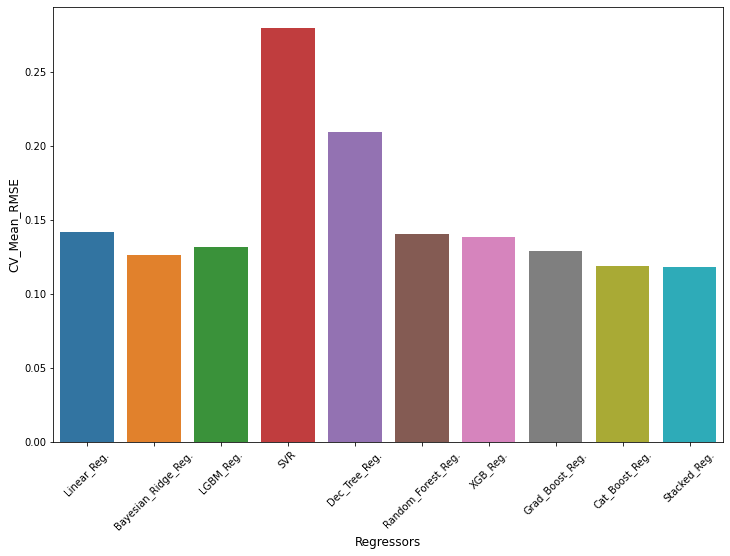

In [49]:
plt.figure(figsize = (12,8))
sns.barplot(final_cv_score['Regressors'],final_cv_score['RMSE_mean'])
plt.xlabel('Regressors', fontsize = 12)
plt.ylabel('CV_Mean_RMSE', fontsize = 12)
plt.xticks(rotation=45)
plt.show()

In [50]:
# Train-Test split the data

X_train,X_val,y_train,y_val = train_test_split(train,target_log,test_size = 0.1,random_state=42)

# Cat Boost Regressor

cat = CatBoostRegressor()
cat_model = cat.fit(X_train,y_train,
                     eval_set = (X_val,y_val),
                     plot=True,
                     verbose = 0)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [51]:
cat_pred = cat_model.predict(X_val)
cat_score = rmse(y_val, cat_pred)
cat_score

0.11399152691025138

Now let's take a look at the top 20 most important variables for our model. This could give us further insight into the functioning of the algorithm and how and which data it uses most to arrive at the final prediction.

In [52]:
# Features' importance of our model

feat_imp = cat_model.get_feature_importance(prettified=True)
feat_imp

,Feature Id,Importances
0,OverallQual,16.889989
1,HighQualSF,8.910640
2,TotalBsmtSF,8.098633
3,Total_Home_Quality,4.934917
4,GrLivArea,4.348377
...,...,...
332,PoolQC_Fa,0.000000
333,PoolQC_None,0.000000
334,MiscFeature_None,0.000000
335,SaleType_Con,0.000000


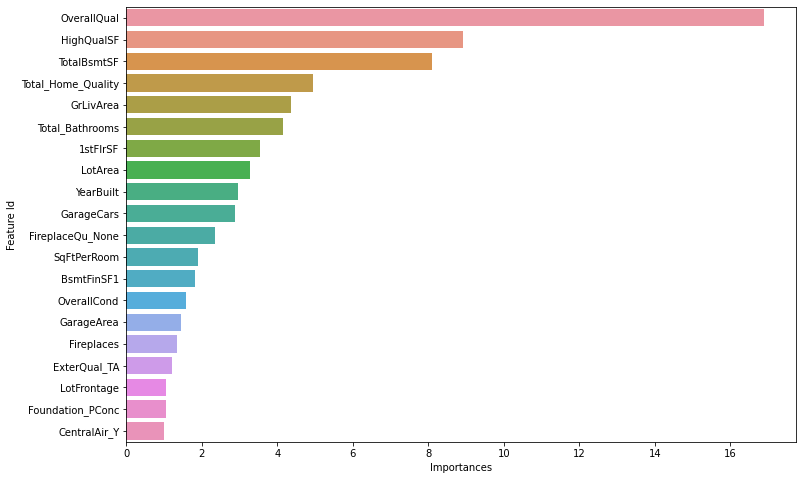

In [53]:
# Plotting top 20 features' importance

plt.figure(figsize = (12,8))
sns.barplot(feat_imp['Importances'][:20],feat_imp['Feature Id'][:20], orient = 'h')
plt.show()

In [54]:
# Feature importance Interactive Plot 

train_pool = Pool(X_train)
val_pool = Pool(X_val)

explainer = shap.TreeExplainer(cat_model) # insert your model
shap_values = explainer.shap_values(train_pool) # insert your train Pool object

shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[:200,:], X_train.iloc[:200,:])

# The plot represents just a slice of the Training data (200 observations)

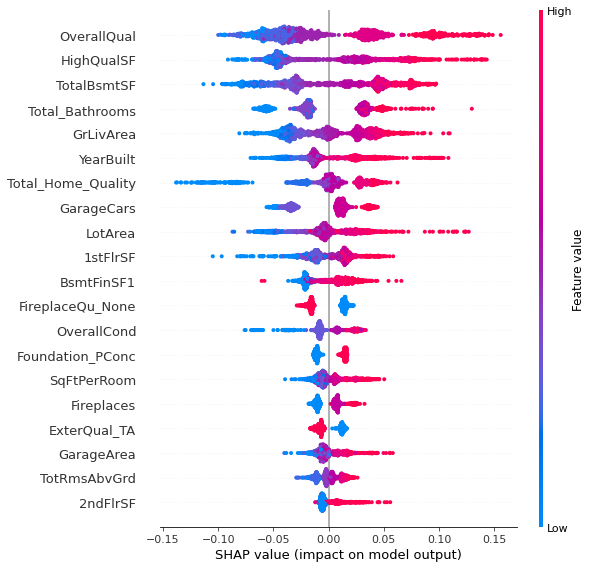

In [55]:
shap.summary_plot(shap_values, X_train)

The above diagram represents each observation (x-axis) for the feature presented (y-axis). The x location of each dot on the x-axis reflects the impact of that feature on the model's predictions, while the color of the dot represents the value of that feature for that exact observation. Dots that pile up on the line show density. Here we can see how features such as 'BsmtFinType1_GLQ' or 'BsmtQual_Ex', differently from 'GrLivArea' and 'OverallQual', do not contribute significantly in producing the final predictions.



 N.B: Catboost comes with a great method: ***get_feature_importance***. This method can be used to find important interactions among features. This is a huge advantage because it can give us insights about possible new features to create that can improve the performance.  

In [56]:
# Features' Interactions

train_data = Pool(X_train)

interaction = cat_model.get_feature_importance(train_data, type="Interaction")
column_names = X_train.columns.values 
interaction = pd.DataFrame(interaction, columns=["feature1", "feature2", "importance"])
interaction.feature1 = interaction.feature1.apply(lambda l: column_names[int(l)])
interaction.feature2 = interaction.feature2.apply(lambda l: column_names[int(l)])
interaction.head(20)

,feature1,feature2,importance
0,OverallQual,HighQualSF,0.578415
1,OverallQual,1stFlrSF,0.490810
2,LotArea,OverallQual,0.451249
3,OverallQual,YearBuilt,0.442246
4,OverallQual,GrLivArea,0.435279
5,YearBuilt,HighQualSF,0.424460
6,LotArea,GarageArea,0.413582
7,TotalBsmtSF,HighQualSF,0.384096
8,LotArea,YearBuilt,0.355843
9,LotArea,SqFtPerRoom,0.343218


Which are the deafult parameters used by CaboostRegressor? This is our real baseline, now we need to optimize the hyperparameters trying to tune the model to obtain a better performance.

In [57]:
# Catboost default paramters

cat_model.get_all_params()

{'nan_mode': 'Min',
 'eval_metric': 'RMSE',
 'iterations': 1000,
 'sampling_frequency': 'PerTree',
 'leaf_estimation_method': 'Newton',
 'grow_policy': 'SymmetricTree',
 'penalties_coefficient': 1,
 'boosting_type': 'Plain',
 'model_shrink_mode': 'Constant',
 'feature_border_type': 'GreedyLogSum',
 'bayesian_matrix_reg': 0.10000000149011612,
 'l2_leaf_reg': 3,
 'random_strength': 1,
 'rsm': 1,
 'boost_from_average': True,
 'model_size_reg': 0.5,
 'subsample': 0.800000011920929,
 'use_best_model': True,
 'random_seed': 0,
 'depth': 6,
 'posterior_sampling': False,
 'border_count': 254,
 'classes_count': 0,
 'auto_class_weights': 'None',
 'sparse_features_conflict_fraction': 0,
 'leaf_estimation_backtracking': 'AnyImprovement',
 'best_model_min_trees': 1,
 'model_shrink_rate': 0,
 'min_data_in_leaf': 1,
 'loss_function': 'RMSE',
 'learning_rate': 0.048517998307943344,
 'score_function': 'Cosine',
 'task_type': 'CPU',
 'leaf_estimation_iterations': 1,
 'bootstrap_type': 'MVS',
 'max_leave

### Hyperparameter Optimization

In [58]:
# Preforming a Random Grid Search to find the best combination of parameters

grid = {'iterations': [1000,6000],
        'learning_rate': [0.05, 0.005, 0.0005],
        'depth': [4, 6, 10],
        'l2_leaf_reg': [1, 3, 5, 9]}

final_model = CatBoostRegressor()
randomized_search_result = final_model.randomized_search(grid,
                                                   X = X_train,
                                                   y= y_train,
                                                   verbose = False,
                                                   plot=True)
                                                   

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


bestTest = 7.313066542
bestIteration = 999


bestTest = 7.355258014
bestIteration = 999


bestTest = 0.2589940122
bestIteration = 999


bestTest = 0.12871112
bestIteration = 5987


bestTest = 0.1752415349
bestIteration = 3269


bestTest = 0.2064467973
bestIteration = 994


bestTest = 0.4038742218
bestIteration = 999


bestTest = 0.4115492092
bestIteration = 999


bestTest = 0.6027614456
bestIteration = 999


bestTest = 0.3323323863
bestIteration = 5999



In [59]:
# Final Cat-Boost Regressor

params = {'iterations': 6000,
          'learning_rate': 0.005,
          'depth': 4,
          'l2_leaf_reg': 1,
          'eval_metric':'RMSE',
          'early_stopping_rounds': 200,
          'verbose': 200,
          'random_seed': 42}
         
cat_f = CatBoostRegressor(**params)
cat_model_f = cat_f.fit(X_train,y_train,
                     eval_set = (X_val,y_val),
                     plot=True,
                     verbose = False)

catf_pred = cat_model_f.predict(X_val)
catf_score = rmse(y_val, catf_pred)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [61]:
catf_score

0.10913927629503581

### SUBMISSION

In [62]:
# Test CSV Submission

test_pred = cat_f.predict(test)
submission = pd.DataFrame(test_id, columns = ['Id'])
test_pred = np.expm1(test_pred)
submission['SalePrice'] = test_pred 
submission.head()

,Id,SalePrice
0,1461,125815.779950
1,1462,155135.637019
2,1463,183998.464501
3,1464,192713.720441
4,1465,184825.181456


In [63]:
# Saving the results in a csv file

submission.to_csv("result.csv", index = False, header = True)